<a href="https://colab.research.google.com/github/William-Gao/toocuaforschool/blob/claude%2Ffinetune-florence-model-BrfRS-impl/MS3_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Training a Computer-Using Agent (CUA) for GUI Task Automation
#### Group 5 — CS 1090B

**Members:** William Gao, Jamie Linsdell, Tim Machasio, Guy Berger, Zaina Edelson
---

#### Problem Statement

GUI grounding — locating a specific UI element in a screenshot given a natural language description — is a core capability for computer-using agents. Given a screenshot and a referring expression (e.g. *"click the search button"*), a model must predict the (x, y) coordinates of that element.

We fine-tune and evaluate two vision-language models on this task using the UGround-V1-Data dataset:
- **Florence-2** (0.77B) — fine-tuned to output (x, y) coordinates
- **Qwen2-VL-2B** — evaluated zero-shot as a comparison baseline

---

#### Milestone 2 Recap

In MS2 we identified UGround-V1-Data as our training dataset (43K web screenshots with grounding annotations), defined the normalized (x, y) [0–999] coordinate format as our output space, and confirmed Florence-2 as our primary model. Key open questions from MS2: (1) what loss functions beyond cross-entropy are appropriate, and (2) how does Florence-2 compare architecturally and resource-wise to Qwen2-VL.

---

#### Research Question

> Can a sub-1B vision-language model (Florence-2), LoRA fine-tuned on a 3.4% UGround subset, match or approach a 2B baseline (Qwen2-VL) on UI element grounding accuracy?


## How to Run This Notebook

This notebook is organized into four sections. Depending on your goal, you can skip
sections 2 and 3 entirely.

---

#### Path A — Full run (EDA + models)

| Step | Cells | What it does |
|------|-------|--------------|
| 1 | **Section 0 — Setup** | Install deps, imports |
| 2 | **Section 1 — Data Loading** | Mount Drive, extract ZIP, load parquet into `ds` |
| 3 | **Section 2 — EDA & Bias Audit** | Element distribution, spatial bias, n-gram analysis |
| 4 | **Section 3 — Data Quality** | Image validation, coordinate conformance |
| 5 | **Section 4a — Florence-2** | Load model, zero-shot inference, metrics, fine-tuning scaffold |
| 6 | Run the **upgrade cell** at the end of 4a, then **restart the runtime** |
| 7 | **Section 4b — Qwen2-VL** | Zero-shot inference, metrics, visualizations |

---

#### Path B — Models only (skip EDA/Data Quality)

> Use this path if you just want to run the model evaluations.
> Sections 2 and 3 are optional — they take 10–20 min and produce
> analysis plots only, with no outputs consumed by sections 4a/4b.

| Step | Cells | What it does |
|------|-------|--------------|
| 1 | **Section 0 — Setup** | Install deps, imports |
| 2 | **Section 1 — Data Loading** | Mount Drive, extract ZIP, load parquet into `ds` |
| 3 | ~~Section 2~~, ~~Section 3~~ | **Skip these entirely** |
| 4 | **Section 4a — Florence-2** | Load model, zero-shot inference, metrics |
| 5 | Run the **upgrade cell** at the end of 4a, then **restart the runtime** |
| 6 | **Section 4b — Qwen2-VL** | Zero-shot inference, metrics, visualizations |

---

#### Section 4b after a kernel restart

After restarting the runtime (required between 4a and 4b), **do not re-run
Section 0–4a cells**. Instead:

1. Re-run **Section 0** cells (install + imports) — but skip the `pip install` cell
   at the very top, OR run cells in this order:
   - Run **Section 1** (data loading) to repopulate `ds`
   - Jump to **Section 4b** and run from there

> **Critical:** The top-of-notebook install cell pins `transformers==4.44.2`
> for Florence-2. Re-running it after the upgrade will downgrade your environment
> and break the Qwen import. After restart, start from Section 1 (data loading)
> and proceed to Section 4b.


## 0. Setup

> **Note on `transformers` versioning:**
> Florence-2 and Qwen2-VL have conflicting `transformers` version requirements:
> - **Florence-2** requires `transformers==4.44.2` — newer versions broke its tokenizer API (`TokenizersBackend` lost the `additional_special_tokens` attribute in 4.45+)
> - **Qwen2-VL** requires `transformers>=4.45.0` — the `Qwen2VLForConditionalGeneration` class was added in 4.45
>
> **How we handle it:** Install `4.44.2` at the top, load Florence-2 first (weights stay in GPU memory), then upgrade to `>=4.45.0` in Section 4b before loading Qwen2-VL. The upgrade cell must be run before the Qwen section.


In [1]:
# Install dependencies
# transformers 4.44.2: last version compatible with Florence-2 processor.
# Qwen2-VL requires >=4.45 but we load Florence-2 first (weights stay in memory)
# then upgrade transformers in the Qwen section.
!pip install -q datasets huggingface_hub matplotlib seaborn numpy pandas timm einops
!pip install -q transformers==4.44.2 accelerate qwen-vl-utils
import transformers; print(f"transformers {transformers.__version__} ready")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 92.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 566.4/566.4 kB 34.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 122.6 MB/s eta 0:00:00


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

transformers 4.44.2 ready


In [2]:
import os
import shutil
import time
import zipfile
import random
import json
import io
import textwrap
from PIL import Image
import matplotlib.pyplot as plt
from datasets import load_dataset

In [3]:
# MOUNT GOOGLE DRIVE
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 1. Data Loading

Loading our UGround subsample from Google Drive. On first run the ZIP is extracted into Drive (~5–10 min); subsequent sessions detect the folder and skip extraction entirely.

In [4]:
# OBTAIN ZIP FILE PATH

# For the path below to work as intended, in the Google Drive web UI, go to "Shared with me",
# right-click the "Too CUA for School" folder → Organise → Add shortcut → root of "My Drive".
NOTEBOOK_DIR = "/content/drive/MyDrive/Too CUA for School/MS4"
ZIP_FILENAME  = "jonathanliuground-v1-subsample.zip"

# Persistent extracted folder on Google Drive (created once, reused every session)
DRIVE_EXTRACT_DIR = os.path.join(NOTEBOOK_DIR, "jonathanliuground-v1-subsample")

# Local Colab session paths (fallback if not extracting to Drive)
LOCAL_ZIP_PATH = f"/content/{ZIP_FILENAME}"
EXTRACT_DIR    = "/content/jonathanliuground-v1-subsample"

# Full path to the ZIP on Drive
DRIVE_ZIP_PATH = os.path.join(NOTEBOOK_DIR, ZIP_FILENAME)

if os.path.isdir(DRIVE_EXTRACT_DIR):
    # Already extracted — no ZIP needed
    print(f"Extracted folder found: {DRIVE_EXTRACT_DIR}")
    print("Skipping ZIP check.")
else:
    # First time — need the ZIP to extract from
    assert os.path.isfile(DRIVE_ZIP_PATH), (
        f"ZIP not found at: {DRIVE_ZIP_PATH}\n"
        f"Either place the ZIP there or ensure the extracted folder exists at:\n"
        f"  {DRIVE_EXTRACT_DIR}"
    )
    zip_size_gb = os.path.getsize(DRIVE_ZIP_PATH) / (1024 ** 3)
    print(f"Found ZIP: {DRIVE_ZIP_PATH}  ({zip_size_gb:.2f} GB)")

Extracted folder found: /content/drive/MyDrive/Too CUA for School/MS4/jonathanliuground-v1-subsample
Skipping ZIP check.


In [5]:
# EXTRACT THE ZIP — persists to Google Drive so future sessions skip this step.
#
# First run  (~5–10 min): extracts parquet files into Drive.
# Future runs: Drive folder already exists → skips extraction entirely.

if os.path.isdir(DRIVE_EXTRACT_DIR):
    # Already extracted to Drive — use it directly (no copy/extract needed)
    EXTRACT_DIR = DRIVE_EXTRACT_DIR
    print(f"Found existing extraction in Drive: {DRIVE_EXTRACT_DIR}")
    print("Skipping copy + extraction.")

elif os.path.isdir(EXTRACT_DIR):
    # Already extracted locally this session
    print(f"Using local extraction at {EXTRACT_DIR}")

else:
    # First time: extract ZIP directly into Drive for persistence
    print(f"Extracting ZIP into Google Drive (one-time, ~5–10 min)...")
    print(f"Target: {DRIVE_EXTRACT_DIR}")
    start = time.time()
    with zipfile.ZipFile(DRIVE_ZIP_PATH, "r") as zf:
        zf.extractall(NOTEBOOK_DIR)
    elapsed = time.time() - start
    EXTRACT_DIR = DRIVE_EXTRACT_DIR
    print(f"Done in {elapsed:.0f}s. Future sessions will skip this step.")

# Walk extracted directory for parquet files
parquet_files = []
for root, dirs, files in os.walk(EXTRACT_DIR):
    for f in files:
        if f.endswith(".parquet"):
            parquet_files.append(os.path.join(root, f))

print(f"\nFound {len(parquet_files)} parquet files in {EXTRACT_DIR}")
subdirs = set(os.path.dirname(p).replace(EXTRACT_DIR, "").strip("/") for p in parquet_files)
subdirs = [s for s in subdirs if s]
if subdirs:
    print("Subfolders:")
    for s in sorted(subdirs):
        count = sum(1 for p in parquet_files if s in p)
        print(f"  {s}/  ({count} files)")

Found existing extraction in Drive: /content/drive/MyDrive/Too CUA for School/MS4/jonathanliuground-v1-subsample
Skipping copy + extraction.

Found 14 parquet files in /content/drive/MyDrive/Too CUA for School/MS4/jonathanliuground-v1-subsample
Subfolders:
  web_direct_150k_description_filtered/  (14 files)


In [6]:
# LOAD PARQUET FILES AND COMBINE THEM INTO A DATASET
import glob as _glob

# Find all parquet files and filter out any 0-byte files
# (Drive sometimes creates empty placeholders during extraction)
all_pq = _glob.glob(f"{EXTRACT_DIR}/**/*.parquet", recursive=True)
valid_pq = [f for f in all_pq if os.path.getsize(f) > 0]

if len(all_pq) != len(valid_pq):
    print(f"Skipped {len(all_pq) - len(valid_pq)} empty/corrupt parquet files.")

print(f"Loading {len(valid_pq)} valid parquet files...")

ds = load_dataset(
    "parquet",
    data_files=valid_pq,
    split="train"
)

print(f"Dataset loaded: {len(ds):,} rows")
print(f"Columns: {ds.column_names}")
print(ds)

Skipped 1 empty/corrupt parquet files.
Loading 13 valid parquet files...
Dataset loaded: 3,570 rows
Columns: ['width', 'height', 'conversations', 'image']
Dataset({
    features: ['width', 'height', 'conversations', 'image'],
    num_rows: 3570
})


### Train / Test Split (80/20)

Fixed random seed ensures the split is reproducible across sessions.
All downstream cells use `train_indices` and `test_indices` to stay consistent.

In [7]:
# ============================================================
# 80/20 TRAIN / TEST SPLIT — used by all model sections
# ============================================================
import numpy as np, json as _json, re as _re
from collections import Counter

SPLIT_SEED = 42
TEST_FRACTION = 0.20

all_indices = np.arange(len(ds))
rng = np.random.RandomState(SPLIT_SEED)
rng.shuffle(all_indices)

split_point = int(len(all_indices) * (1 - TEST_FRACTION))
train_indices = set(all_indices[:split_point].tolist())
test_indices  = set(all_indices[split_point:].tolist())

# Count conversation pairs per row to check for multi-element rows
_COORD_RE = _re.compile(r"\(\s*-?\d+\s*,\s*-?\d+\s*\)")
pairs_per_row = Counter()

total_elements = 0
for ri in range(len(ds)):
    try:
        raw = ds["conversations"][ri]
        convos = _json.loads(raw) if isinstance(raw, str) else raw
    except (TypeError, _json.JSONDecodeError):
        pairs_per_row[0] += 1
        continue
    n_pairs = 0
    for pi in range(0, len(convos) - 1, 2):
        h, g = convos[pi], convos[pi + 1]
        if h.get("from") != "human" or g.get("from") != "gpt":
            continue
        if _COORD_RE.search(g.get("value", "")):
            n_pairs += 1
    pairs_per_row[n_pairs] += 1
    total_elements += n_pairs

print("Elements per row distribution:")
for k in sorted(pairs_per_row.keys()):
    print(f"  {k} elements: {pairs_per_row[k]} rows")
print(f"\nTotal rows: {len(ds):,}  |  Total elements: {total_elements:,}")

# Show a sample row with most conversation turns
max_turns_idx = None
max_turns = 0
for ri in range(min(200, len(ds))):
    try:
        raw = ds["conversations"][ri]
        convos = _json.loads(raw) if isinstance(raw, str) else raw
        if len(convos) > max_turns:
            max_turns = len(convos)
            max_turns_idx = ri
    except:
        pass
if max_turns_idx is not None:
    raw = ds["conversations"][max_turns_idx]
    convos = _json.loads(raw) if isinstance(raw, str) else raw
    print(f"\nRow {max_turns_idx} has {len(convos)} turns ({len(convos)//2} pairs):")
    for t in convos:
        val = t.get('value','')[:120]
        print(f"  [{t.get('from','?').upper()}] {val}")

# Now do the split reporting
train_elements = sum(1 for ri in train_indices for _ in range(1)
                     if ri < len(ds))  # placeholder
# Recount properly per split
def count_split(indices_set):
    c = 0
    for ri in indices_set:
        try:
            raw = ds["conversations"][ri]
            convos = _json.loads(raw) if isinstance(raw, str) else raw
        except (TypeError, _json.JSONDecodeError):
            continue
        for pi in range(0, len(convos) - 1, 2):
            h, g = convos[pi], convos[pi + 1]
            if h.get("from") != "human" or g.get("from") != "gpt":
                continue
            if _COORD_RE.search(g.get("value", "")):
                c += 1
    return c

train_el = count_split(train_indices)
test_el  = count_split(test_indices)
tot_el   = train_el + test_el

print(f"\n{'':30s} {'Rows':>8s}  {'Elements':>10s}")
print(f"{'Dataset total':<30s} {len(ds):>8,d}  {tot_el:>10,d}")
pct_tr = train_el / max(tot_el, 1) * 100
pct_te = test_el / max(tot_el, 1) * 100
print(f"{'Train split':<30s} {len(train_indices):>8,d}  {train_el:>10,d}  ({pct_tr:.1f}%)")
print(f"{'Test split':<30s} {len(test_indices):>8,d}  {test_el:>10,d}  ({pct_te:.1f}%)")
print(f"\nRow overlap: {len(train_indices & test_indices)} (must be 0)")
assert len(train_indices & test_indices) == 0

Elements per row distribution:
  1 elements: 3570 rows

Total rows: 3,570  |  Total elements: 3,570

Row 0 has 2 turns (1 pairs):
  [HUMAN] <image>Your task is to help the user identify the precise coordinates (x, y) of a specific area/element/object on this s
  [GPT] (210, 376)

                                   Rows    Elements
Dataset total                     3,570       3,570
Train split                       2,856       2,856  (80.0%)
Test split                          714         714  (20.0%)

Row overlap: 0 (must be 0)


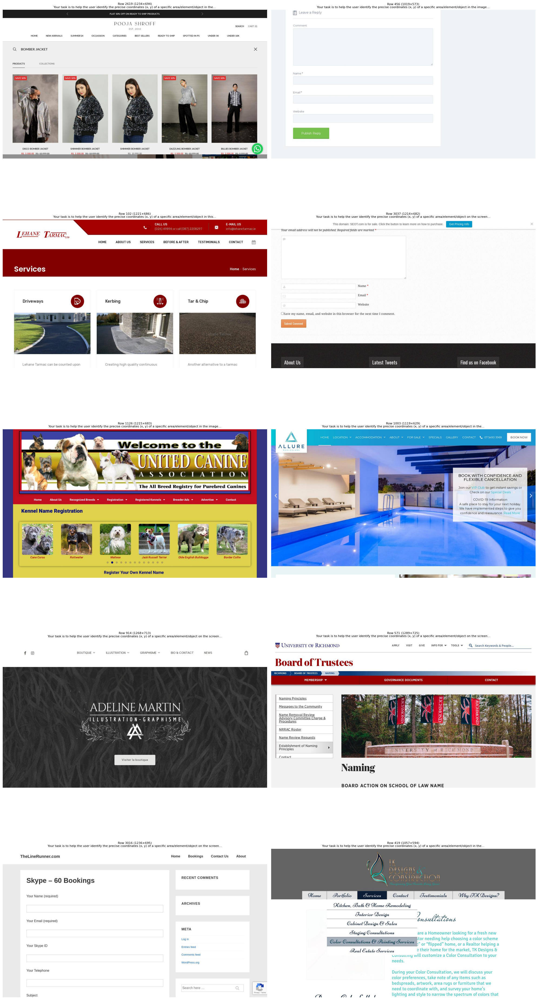

In [8]:
# DISPLAY 10 RANDOM IMAGES
# Each row's image column contains raw image bytes (PNG or JPEG). We decode them with PIL and display them in a grid with matplotlib. The first line of the human conversation turn is shown as the title so you can see what grounding task is being asked.

# Set a seed for reproducibility. Remove this line to get a different
# random selection each time you run the cell.
random.seed(42)

# Pick 10 random row indices from the dataset.
indices = random.sample(range(len(ds)), 10)

# Create a 5-row × 2-column grid of subplots.
fig, axes = plt.subplots(5, 2, figsize=(20, 40))
axes = axes.flatten()  # Flatten the 2D array of axes into a 1D list for easy iteration.

for ax, idx in zip(axes, indices):
    # Fetch the row from the dataset.
    row = ds[idx]

    # --- Decode the image ---
    # The "image" field can be:
    #   (a) raw bytes (if datasets didn't auto-decode) → open with PIL
    #   (b) a PIL Image (if datasets auto-decoded the Image feature)
    #   (c) a dict like {"bytes": ..., "path": ...} (some datasets versions)
    img = row["image"]
    if isinstance(img, bytes):
        # Case (a): raw bytes → wrap in BytesIO and open as a PIL Image.
        img = Image.open(io.BytesIO(img))
    elif isinstance(img, dict) and "bytes" in img:
        # Case (c): dict with a "bytes" key → extract and open.
        img = Image.open(io.BytesIO(img["bytes"]))
    # Case (b): already a PIL Image, no conversion needed.

    # --- Parse the conversation JSON ---
    # The "conversations" column is a JSON string containing a list of turns.
    # Each turn looks like: {"from": "human" or "gpt", "value": "..."}
    convos = json.loads(row["conversations"])

    # Extract the human turn's text for use as the plot title.
    human_msg = convos[0]["value"] if convos else ""

    # Remove the <image> placeholder tag that appears at the start of the prompt.
    human_msg = human_msg.replace("<image>", "").strip()

    # Truncate long prompts so they fit as a subplot title.
    title = textwrap.shorten(human_msg, width=120, placeholder="...")

    # Display the image in the subplot.
    ax.imshow(img)

    # Set the title showing the row index, image dimensions, and the prompt.
    ax.set_title(
        f"Row {idx} ({row['width']}×{row['height']})\n{title}",
        fontsize=8,
        wrap=True
    )

    # Hide the axis ticks and labels for a cleaner look.
    ax.axis("off")

# Adjust spacing between subplots so titles don't overlap.
plt.tight_layout()

# Render the figure.
plt.show()

In [9]:
# INSPECT A SINGLE SAMPLE IN DETAIL
# Shows an example of a full conversation structure for a given row. The human turn describes a UI element to locate, and the GPT turn provides the (x, y) coordinates normalised to [0, 999].

# Pick one of the 10 random indices we already selected.
sample_idx = indices[0]

# Fetch the row.
sample = ds[sample_idx]

# Print the metadata.
print(f"Row index : {sample_idx}")
print(f"Image size: {sample['width']} × {sample['height']}")

# Parse and print each conversation turn.
print(f"\n--- Conversations ---")
convos = json.loads(sample["conversations"])
for turn in convos:
    # Uppercase the role for readability (HUMAN / GPT).
    role = turn["from"].upper()

    # Replace the <image> tag with a readable placeholder.
    text = turn["value"].replace("<image>", "[IMAGE]").strip()

    print(f"\n[{role}]\n{text}")

Row index : 2619
Image size: 1234 × 694

--- Conversations ---

[HUMAN]
[IMAGE]Your task is to help the user identify the precise coordinates (x, y) of a specific area/element/object in the screenshot above based on a description.

- Your response should aim to point to the center or a representative point within the described area/element/object as accurately as possible.
- If the description is unclear or ambiguous, infer the most relevant area or element based on its likely context or purpose.
- Your answer should be a single string (x, y) corresponding to the point of interest.

Description: The text "SHIMMER BOMBER JACKET" located under the second image in the bomber jackets listing.
            
Answer:

[GPT]
(500, 935)


## 2. EDA & Bias Audit

This section analyzes the UGround-V1-Data dataset for element type distribution, action verb bias, linguistic diversity, spatial bias, and resolution distribution.

### 2a. Streaming Sample (Full Dataset Stats)

We stream the full dataset to get unbiased statistics without downloading everything.

In [10]:
from datasets import load_dataset, get_dataset_config_names, get_dataset_split_names
import json

# ============================================================
# CONFIG — adjust sample size as needed
# ============================================================
SAMPLE_SIZE = 50_000       # number of records to analyze
DATASET_ID = "osunlp/UGround-V1-Data"
# ============================================================

# Step 1: Discover available configs and splits
print("Discovering dataset structure...")
try:
    configs = get_dataset_config_names(DATASET_ID)
    print(f"  Configs: {configs}")
except Exception as e:
    configs = ["default"]
    print(f"  Could not fetch configs ({e}), using 'default'")

config_name = configs[0]  # typically 'default'
try:
    splits = get_dataset_split_names(DATASET_ID, config_name)
    print(f"  Splits for '{config_name}': {splits}")
except Exception as e:
    splits = ["train"]
    print(f"  Could not fetch splits ({e}), using 'train'")

# Step 2: Pick which split to load
# Prefer 'web_hybrid' if it exists as a split, otherwise use 'train'
if "web_hybrid" in splits:
    SPLIT = "web_hybrid"
elif "train" in splits:
    SPLIT = "train"
else:
    SPLIT = splits[0]
print(f"\n→ Loading split '{SPLIT}' from config '{config_name}' in streaming mode...")

ds = load_dataset(DATASET_ID, config_name, streaming=True, split=SPLIT)

# Step 3: Collect sample (skip heavy image bytes)
records = []
for i, record in enumerate(ds):
    if i >= SAMPLE_SIZE:
        break
    try:
        convos = json.loads(record["conversations"]) if isinstance(record["conversations"], str) else record["conversations"]
    except (json.JSONDecodeError, TypeError):
        convos = []
    records.append({
        "width": record.get("width"),
        "height": record.get("height"),
        "conversations": convos,
    })
    if (i + 1) % 10000 == 0:
        print(f"  Loaded {i + 1:,} records...")

print(f"\nDone. Loaded {len(records):,} records from split '{SPLIT}'.")
print(f"Sample record columns: {list(record.keys()) if records else 'N/A'}")
print(f"\n💡 To analyze a different split, change SPLIT above to one of: {splits}")

Discovering dataset structure...


README.md: 0.00B [00:00, ?B/s]

Resolving data files:   0%|          | 0/3582 [00:00<?, ?it/s]

  Configs: ['default']


Resolving data files:   0%|          | 0/3582 [00:00<?, ?it/s]

  Splits for 'default': ['train']

→ Loading split 'train' from config 'default' in streaming mode...


Resolving data files:   0%|          | 0/3582 [00:00<?, ?it/s]

  Loaded 10,000 records...
  Loaded 20,000 records...
  Loaded 30,000 records...
  Loaded 40,000 records...
  Loaded 50,000 records...

Done. Loaded 50,000 records from split 'train'.
Sample record columns: ['width', 'height', 'conversations', 'image']

💡 To analyze a different split, change SPLIT above to one of: ['train']


In [11]:
# Quick inspection — what does a conversation look like?
import pprint
for r in records[:3]:
    print(f"Resolution: {r['width']}x{r['height']}")
    pprint.pprint(r["conversations"])
    print("---")

Resolution: 1434x806
[{'from': 'human',
  'value': '<image>Your task is to help the user identify the precise '
           'coordinates (x, y) of a specific area/element/object on this '
           'screen based on a description.\n'
           '\n'
           '- Your response should aim to point to the center or a '
           'representative point within the described area/element/object as '
           'accurately as possible.\n'
           '- If the description is unclear or ambiguous, infer the most '
           'relevant area or element based on its likely context or purpose.\n'
           '- Your answer should be a single string (x, y) corresponding to '
           'the point of interest.\n'
           '\n'
           'Description: The navigation menu item labeled "PLUMBING" with a '
           'small downward-pointing arrow next to it, situated between the '
           '"ABOUT" and "HEATING & AIR CONDITIONING" menu items within the '
           'yellow navigation bar under the c

### 2b. Extract Referring Expressions & Coordinates

In [12]:
import re

referring_expressions = []  # the human instructions
coordinates = []            # parsed (x, y) or (x1, y1, x2, y2) from assistant
resolutions = []            # (width, height)

for rec in records:
    resolutions.append((rec["width"], rec["height"]))
    convos = rec["conversations"]
    if not convos:
        continue

    for turn in convos:
        role = turn.get("from") or turn.get("role") or ""
        text = turn.get("value") or turn.get("content") or ""

        if role in ("human", "user"):
            # Strip system prompt boilerplate if present
            # The RE is usually after the task description
            referring_expressions.append(text)
        elif role in ("gpt", "assistant"):
            # Extract coordinates — format is typically (x, y) normalized to [0, 999]
            nums = re.findall(r'\d+', text)
            if len(nums) >= 2:
                coords = [int(n) for n in nums]
                coordinates.append(coords)

print(f"Extracted {len(referring_expressions):,} referring expressions")
print(f"Extracted {len(coordinates):,} coordinate sets")
print(f"Collected {len(resolutions):,} resolutions")
print(f"\nSample REs:")
for re_text in referring_expressions[:5]:
    print(f"  • {re_text[:120]}..." if len(re_text) > 120 else f"  • {re_text}")

Extracted 50,000 referring expressions
Extracted 50,000 coordinate sets
Collected 50,000 resolutions

Sample REs:
  • <image>Your task is to help the user identify the precise coordinates (x, y) of a specific area/element/object on this s...
  • <image>
Your task is to help the user identify the precise coordinates (x, y) of a specific area/element/object on this ...
  • <image>
Your task is to help the user identify the precise coordinates (x, y) of a specific area/element/object in the i...
  • <image>Your task is to help the user identify the precise coordinates (x, y) of a specific area/element/object on the sc...
  • <image>
Your task is to help the user identify the precise coordinates (x, y) of a specific area/element/object in the i...


### 2c. Element Type Distribution

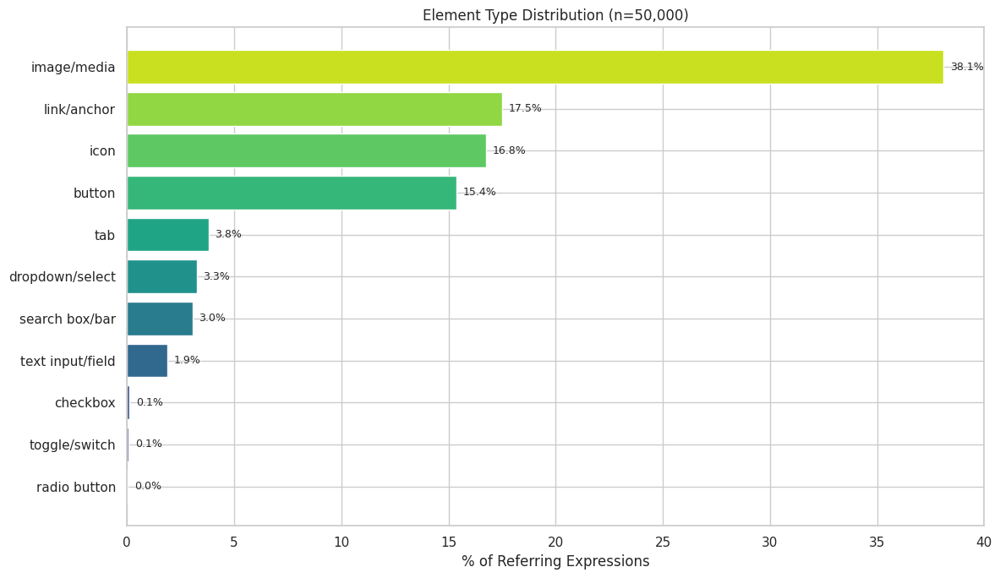


⚠️  Concentration check:
  image/media                38.1% ← POTENTIAL BIAS
  link/anchor                17.5%
  icon                       16.8%
  button                     15.4%
  tab                         3.8%
  dropdown/select             3.3%
  search box/bar              3.0%
  text input/field            1.9%
  checkbox                    0.1%
  toggle/switch               0.1%
  radio button                0.0%


In [13]:
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

sns.set_theme(style="whitegrid")

# Element type keyword patterns (order matters — first match wins)
ELEMENT_PATTERNS = [
    ("search box/bar",    r"\b(search\s*(box|bar|field|input)|search icon)\b"),
    ("text input/field",  r"\b(text\s*(field|input|box|area)|input\s*(field|box)|textarea|form field|type\s*(in|into|here))\b"),
    ("button",            r"\b(button|btn|submit|click\s*(on|the)?\s*(button|btn))\b"),
    ("link/anchor",       r"\b(link|anchor|href|hyperlink|click\s*(on|the)?\s*link)\b"),
    ("dropdown/select",   r"\b(dropdown|select|combobox|drop-down|pulldown|menu\s*option)\b"),
    ("checkbox",          r"\b(checkbox|check\s*box|checkmark|tick\s*box)\b"),
    ("radio button",      r"\b(radio\s*(button|option)|radio)\b"),
    ("toggle/switch",     r"\b(toggle|switch|slider\s*switch)\b"),
    ("tab",               r"\b(tab|tab\s*bar|tab\s*menu)\b"),
    ("icon",              r"\b(icon|logo|favicon|symbol|glyph)\b"),
    ("image/media",       r"\b(image|photo|picture|thumbnail|video|media|img)\b"),
    ("navigation/menu",   r"\b(nav|navigation|menu|hamburger|sidebar|breadcrumb|toolbar)\b"),
    ("text/label",        r"\b(text|label|heading|title|paragraph|caption|header|footer)\b"),
    ("scroll",            r"\b(scroll|scrollbar|scroll\s*(up|down))\b"),
    ("modal/dialog",      r"\b(modal|dialog|popup|popover|overlay|tooltip)\b"),
    ("card/container",    r"\b(card|container|panel|section|div|block|widget|tile)\b"),
]

element_counts = Counter()
unclassified_samples = []

for re_text in referring_expressions:
    text_lower = re_text.lower()
    matched = False
    for label, pattern in ELEMENT_PATTERNS:
        if re.search(pattern, text_lower):
            element_counts[label] += 1
            matched = True
            break
    if not matched:
        element_counts["other/unclassified"] += 1
        if len(unclassified_samples) < 20:
            unclassified_samples.append(re_text[:150])

# Sort and plot
sorted_elements = element_counts.most_common()
labels, counts = zip(*sorted_elements)
total = sum(counts)
pcts = [c / total * 100 for c in counts]

fig, ax = plt.subplots(figsize=(12, 7))
bars = ax.barh(labels[::-1], pcts[::-1], color=sns.color_palette("viridis", len(labels)))
ax.set_xlabel("% of Referring Expressions")
ax.set_title(f"Element Type Distribution (n={total:,})")
for bar, pct in zip(bars, pcts[::-1]):
    ax.text(bar.get_width() + 0.3, bar.get_y() + bar.get_height()/2,
            f"{pct:.1f}%", va='center', fontsize=9)
plt.tight_layout()
plt.show()

print("\n⚠️  Concentration check:")
for label, pct in zip(labels, pcts):
    flag = " ← POTENTIAL BIAS" if pct > 25 else ""
    print(f"  {label:25s} {pct:5.1f}%{flag}")

In [14]:
# Inspect unclassified samples to see what we're missing
print("Sample unclassified REs (check if patterns need expanding):")
for s in unclassified_samples:
    print(f"  • {s}")

Sample unclassified REs (check if patterns need expanding):


### 2d. Action Verb Distribution

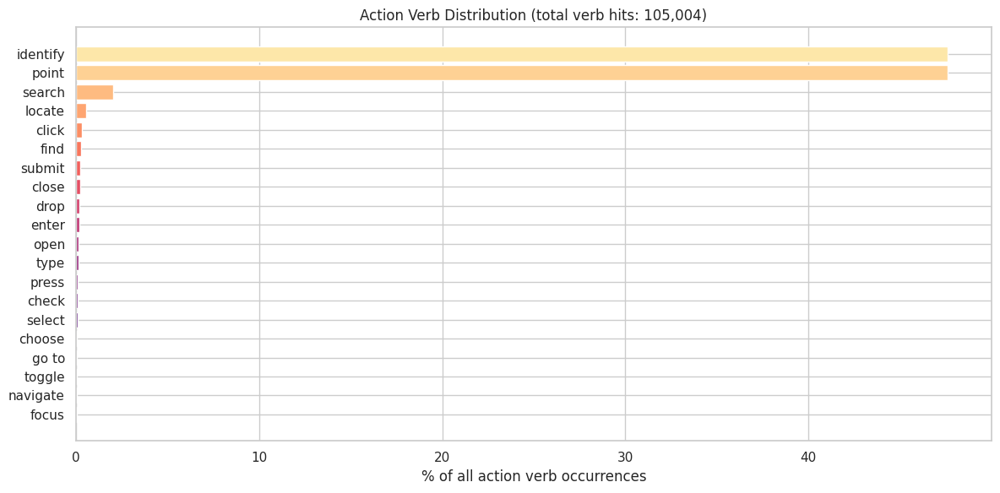


⚠️  Verb dominance check:
  'identify': 47.6% of all verb usage ← HEAVILY DOMINANT
  'point': 47.6% of all verb usage ← HEAVILY DOMINANT
  'search': 2.0% of all verb usage
  'locate': 0.5% of all verb usage
  'click': 0.3% of all verb usage


In [15]:
ACTION_VERBS = [
    "click", "tap", "press", "select", "find", "locate", "identify",
    "point", "hover", "scroll", "type", "enter", "search", "open",
    "close", "expand", "collapse", "drag", "drop", "toggle",
    "check", "uncheck", "submit", "navigate", "go to", "switch",
    "choose", "pick", "highlight", "focus",
]

verb_counts = Counter()

for re_text in referring_expressions:
    text_lower = re_text.lower()
    for verb in ACTION_VERBS:
        if re.search(r'\b' + re.escape(verb) + r'\b', text_lower):
            verb_counts[verb] += 1

# Plot top verbs
top_verbs = verb_counts.most_common(20)
if top_verbs:
    v_labels, v_counts = zip(*top_verbs)
    v_total = sum(verb_counts.values())

    fig, ax = plt.subplots(figsize=(12, 6))
    ax.barh(v_labels[::-1], [c/v_total*100 for c in v_counts[::-1]],
            color=sns.color_palette("magma", len(v_labels)))
    ax.set_xlabel("% of all action verb occurrences")
    ax.set_title(f"Action Verb Distribution (total verb hits: {v_total:,})")
    plt.tight_layout()
    plt.show()

    # Dominance check
    print("\n⚠️  Verb dominance check:")
    for v, c in top_verbs[:5]:
        pct = c / v_total * 100
        flag = " ← HEAVILY DOMINANT" if pct > 30 else ""
        print(f"  '{v}': {pct:.1f}% of all verb usage{flag}")
else:
    print("No action verbs detected — REs may be noun-phrase only (e.g., 'the search box')")

### 2e. Linguistic Diversity

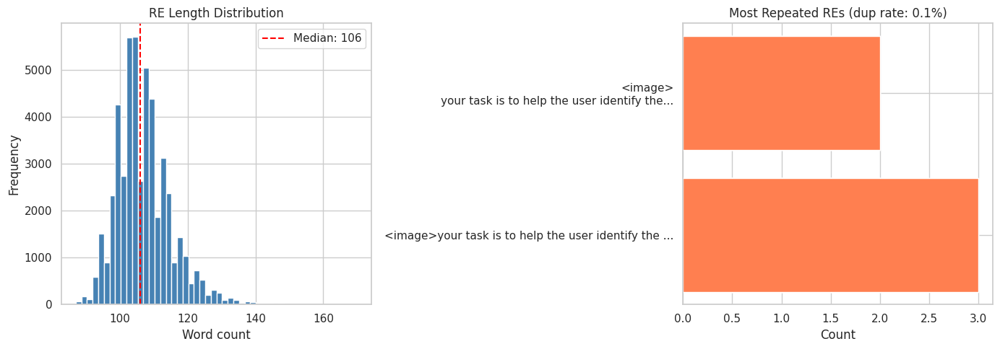


Total REs: 50,000
Unique REs: 49,951
Duplicate rate: 0.1%

⚠️  Duplication looks acceptable (0.1%)


In [16]:
from collections import Counter
import math

# --- 5a. RE length distribution ---
re_lengths = [len(r.split()) for r in referring_expressions]

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].hist(re_lengths, bins=50, color="steelblue", edgecolor="white")
axes[0].set_xlabel("Word count")
axes[0].set_ylabel("Frequency")
axes[0].set_title("RE Length Distribution")
axes[0].axvline(np.median(re_lengths), color='red', linestyle='--', label=f'Median: {np.median(re_lengths):.0f}')
axes[0].legend()

# --- 5b. Exact duplicate rate ---
re_counter = Counter(r.lower().strip() for r in referring_expressions)
total_res = len(referring_expressions)
unique_res = len(re_counter)
dup_rate = (1 - unique_res / total_res) * 100

top_dupes = re_counter.most_common(15)
dupe_labels = [f"{t[:50]}..." if len(t) > 50 else t for t, _ in top_dupes]
dupe_counts = [c for _, c in top_dupes]

axes[1].barh(dupe_labels[::-1], dupe_counts[::-1], color="coral")
axes[1].set_xlabel("Count")
axes[1].set_title(f"Most Repeated REs (dup rate: {dup_rate:.1f}%)")

plt.tight_layout()
plt.show()

print(f"\nTotal REs: {total_res:,}")
print(f"Unique REs: {unique_res:,}")
print(f"Duplicate rate: {dup_rate:.1f}%")
print(f"\n⚠️  Duplication {'is a concern' if dup_rate > 20 else 'looks acceptable'} ({dup_rate:.1f}%)")

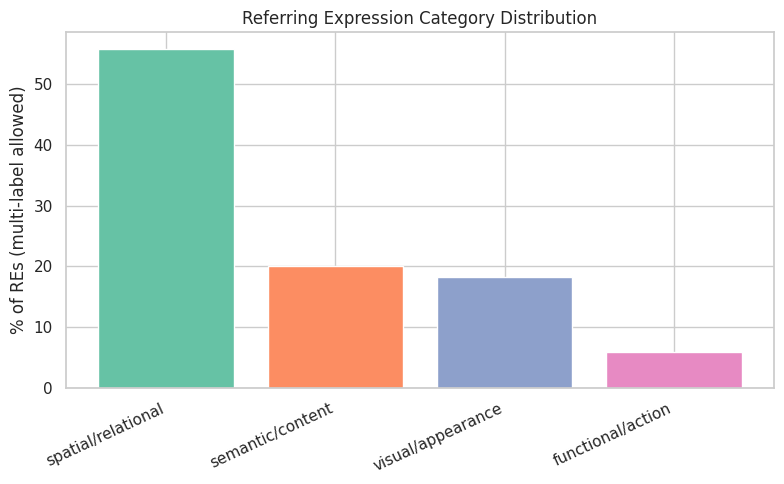


Multi-category REs: 30,500 (61.0%)
(Higher = more diverse/natural descriptions)


In [17]:
# --- 5c. RE Category classification (visual / functional / semantic / spatial) ---

RE_CATEGORY_PATTERNS = {
    "visual/appearance": r"\b(color|colou?red|blue|red|green|white|black|gray|grey|yellow|orange|purple|pink|bold|italic|underline|large|small|big|round|square|bright|dark|transparent|outlined|filled|solid)\b",
    "spatial/relational": r"\b(above|below|left|right|next to|beside|under|over|top|bottom|between|near|corner|center|middle|adjacent|upper|lower|first|second|third|last)\b",
    "functional/action":  r"\b(click|tap|press|submit|login|sign.?in|sign.?up|search|download|upload|play|pause|delete|edit|save|send|buy|add to cart|checkout|subscribe|register|close|open|expand|collapse)\b",
    "semantic/content":   r"\b(says|reads|labeled|labelled|titled|named|shows|displays|contains|with text|that says|reading|written|caption|heading that)\b",
}

category_counts = Counter()
multi_category = 0

for re_text in referring_expressions:
    text_lower = re_text.lower()
    matches = []
    for cat, pattern in RE_CATEGORY_PATTERNS.items():
        if re.search(pattern, text_lower):
            matches.append(cat)
    if not matches:
        category_counts["uncategorized"] += 1
    else:
        for m in matches:
            category_counts[m] += 1
        if len(matches) > 1:
            multi_category += 1

# Plot
fig, ax = plt.subplots(figsize=(8, 5))
cats = category_counts.most_common()
c_labels, c_counts = zip(*cats)
c_total = sum(c_counts)
ax.bar(c_labels, [c/c_total*100 for c in c_counts], color=sns.color_palette("Set2", len(c_labels)))
ax.set_ylabel("% of REs (multi-label allowed)")
ax.set_title("Referring Expression Category Distribution")
plt.xticks(rotation=25, ha='right')
plt.tight_layout()
plt.show()

print(f"\nMulti-category REs: {multi_category:,} ({multi_category/total_res*100:.1f}%)")
print("(Higher = more diverse/natural descriptions)")

### 2f. Spatial / Positional Bias

Coordinate points: 50,000


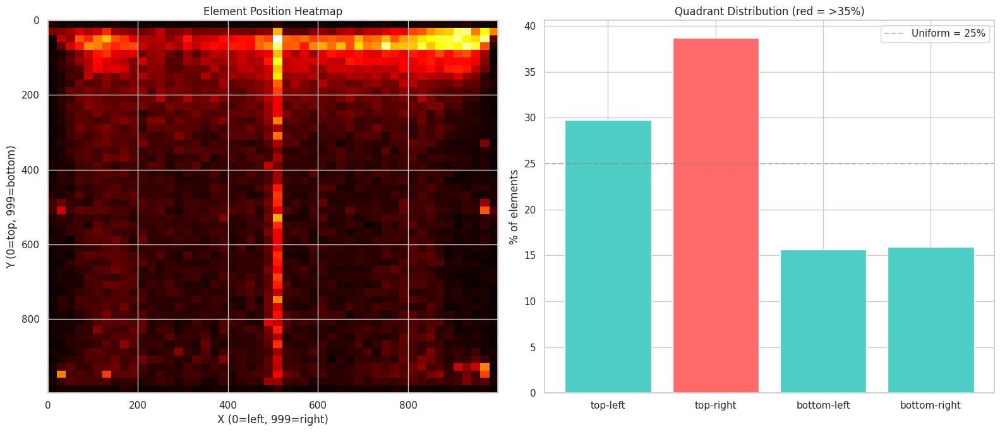


⚠️  Spatial balance check (uniform = 25% each):
  top-left         29.7%
  top-right        38.7% ← OVER-REPRESENTED
  bottom-left      15.7%
  bottom-right     15.9%


In [18]:
# Extract (x, y) center points — take first two numbers as (x, y)
xs, ys = [], []
for coord in coordinates:
    if len(coord) == 2:
        xs.append(coord[0])
        ys.append(coord[1])
    elif len(coord) == 4:
        # Bounding box: use center point
        xs.append((coord[0] + coord[2]) / 2)
        ys.append((coord[1] + coord[3]) / 2)

print(f"Coordinate points: {len(xs):,}")

if xs:
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))

    # Heatmap
    heatmap, xedges, yedges = np.histogram2d(xs, ys, bins=50, range=[[0, 999], [0, 999]])
    axes[0].imshow(heatmap.T, origin='upper', extent=[0, 999, 999, 0],
                   cmap='hot', aspect='auto')
    axes[0].set_xlabel("X (0=left, 999=right)")
    axes[0].set_ylabel("Y (0=top, 999=bottom)")
    axes[0].set_title("Element Position Heatmap")

    # Quadrant analysis
    quadrants = Counter()
    for x, y in zip(xs, ys):
        h = "left" if x < 500 else "right"
        v = "top" if y < 500 else "bottom"
        quadrants[f"{v}-{h}"] += 1

    q_labels = ["top-left", "top-right", "bottom-left", "bottom-right"]
    q_vals = [quadrants.get(q, 0) / len(xs) * 100 for q in q_labels]
    colors = ["#ff6b6b" if v > 35 else "#4ecdc4" for v in q_vals]
    axes[1].bar(q_labels, q_vals, color=colors)
    axes[1].set_ylabel("% of elements")
    axes[1].set_title("Quadrant Distribution (red = >35%)")
    axes[1].axhline(25, color='gray', linestyle='--', alpha=0.5, label='Uniform = 25%')
    axes[1].legend()

    plt.tight_layout()
    plt.show()

    print("\n⚠️  Spatial balance check (uniform = 25% each):")
    for q, v in zip(q_labels, q_vals):
        flag = " ← OVER-REPRESENTED" if v > 35 else (" ← UNDER-REPRESENTED" if v < 15 else "")
        print(f"  {q:15s} {v:5.1f}%{flag}")
else:
    print("No coordinates extracted — check parsing logic above.")

### 2g. Resolution & Aspect Ratio

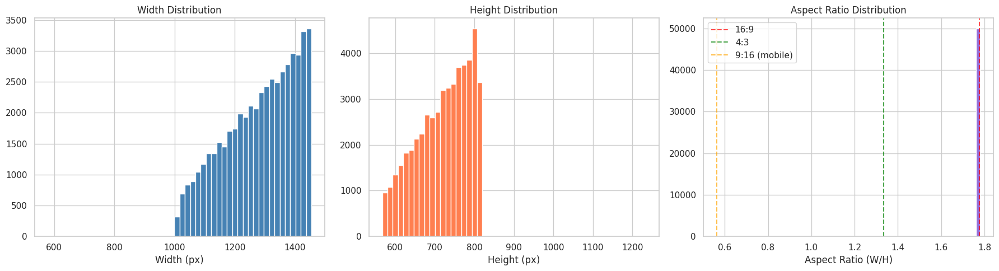


Top 10 resolutions:
  1454x817: 208 (0.4%)
  1449x815: 202 (0.4%)
  1442x811: 200 (0.4%)
  1439x809: 197 (0.4%)
  1413x794: 197 (0.4%)
  1446x813: 196 (0.4%)
  1397x785: 196 (0.4%)
  1437x808: 195 (0.4%)
  1440x810: 194 (0.4%)
  1428x803: 194 (0.4%)

Portrait (mobile-like, AR < 0.8): 1 (0.0%)
Landscape (desktop-like, AR >= 0.8): 49,999 (100.0%)


In [19]:
widths = [r[0] for r in resolutions if r[0] and r[1]]
heights = [r[1] for r in resolutions if r[0] and r[1]]
aspects = [w/h for w, h in zip(widths, heights) if h > 0]

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].hist(widths, bins=50, color="steelblue", edgecolor="white")
axes[0].set_xlabel("Width (px)")
axes[0].set_title("Width Distribution")

axes[1].hist(heights, bins=50, color="coral", edgecolor="white")
axes[1].set_xlabel("Height (px)")
axes[1].set_title("Height Distribution")

axes[2].hist(aspects, bins=50, color="mediumpurple", edgecolor="white")
axes[2].set_xlabel("Aspect Ratio (W/H)")
axes[2].set_title("Aspect Ratio Distribution")
axes[2].axvline(16/9, color='red', linestyle='--', alpha=0.7, label='16:9')
axes[2].axvline(4/3, color='green', linestyle='--', alpha=0.7, label='4:3')
axes[2].axvline(9/16, color='orange', linestyle='--', alpha=0.7, label='9:16 (mobile)')
axes[2].legend()

plt.tight_layout()
plt.show()

# Resolution clustering
res_counter = Counter(resolutions)
print("\nTop 10 resolutions:")
for (w, h), count in res_counter.most_common(10):
    pct = count / len(resolutions) * 100
    print(f"  {w}x{h}: {count:,} ({pct:.1f}%)")

# Mobile vs desktop heuristic
portrait = sum(1 for a in aspects if a < 0.8)  # portrait / mobile-ish
landscape = sum(1 for a in aspects if a >= 0.8)
print(f"\nPortrait (mobile-like, AR < 0.8): {portrait:,} ({portrait/len(aspects)*100:.1f}%)")
print(f"Landscape (desktop-like, AR >= 0.8): {landscape:,} ({landscape/len(aspects)*100:.1f}%)")

### 2h. N-gram Analysis (Template Detection)

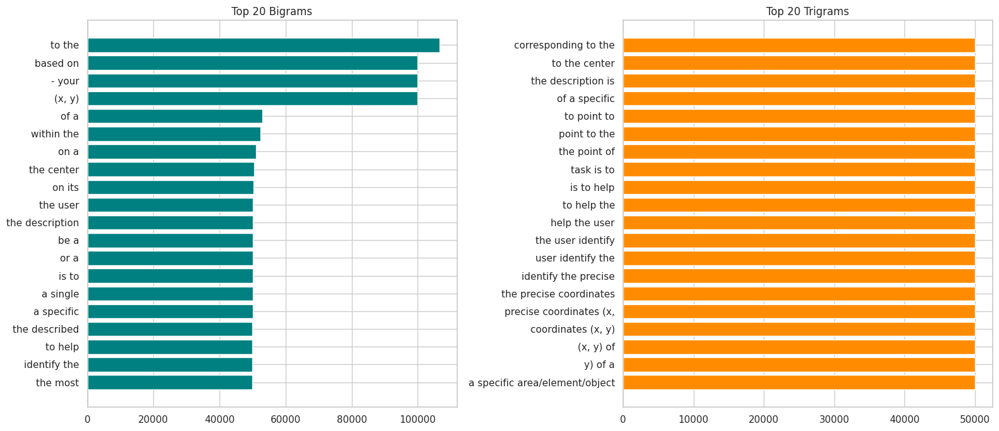


Most common trigram: 'corresponding to the' appears in 100.0% of REs
⚠️  High trigram concentration suggests templated generation


In [20]:
from collections import Counter

def get_ngrams(text, n):
    words = text.lower().split()
    return [' '.join(words[i:i+n]) for i in range(len(words)-n+1)]

bigrams = Counter()
trigrams = Counter()

for re_text in referring_expressions:
    for bg in get_ngrams(re_text, 2):
        bigrams[bg] += 1
    for tg in get_ngrams(re_text, 3):
        trigrams[tg] += 1

fig, axes = plt.subplots(1, 2, figsize=(16, 7))

top_bg = bigrams.most_common(20)
if top_bg:
    bg_labels, bg_counts = zip(*top_bg)
    axes[0].barh(bg_labels[::-1], bg_counts[::-1], color="teal")
    axes[0].set_title("Top 20 Bigrams")

top_tg = trigrams.most_common(20)
if top_tg:
    tg_labels, tg_counts = zip(*top_tg)
    axes[1].barh(tg_labels[::-1], tg_counts[::-1], color="darkorange")
    axes[1].set_title("Top 20 Trigrams")

plt.tight_layout()
plt.show()

# Template detection: if top trigram covers >5% of data, it's likely templated
if top_tg:
    top_tg_pct = top_tg[0][1] / total_res * 100
    print(f"\nMost common trigram: '{top_tg[0][0]}' appears in {top_tg_pct:.1f}% of REs")
    if top_tg_pct > 5:
        print("⚠️  High trigram concentration suggests templated generation")
    else:
        print("✓  Trigram distribution looks reasonably diverse")

### 2i. Summary Report

In [21]:
print("=" * 60)
print("  UGROUND-V1-DATA BIAS AUDIT SUMMARY")
print(f"  Split: {SPLIT} | Sample: {len(records):,} records")
print("=" * 60)

findings = []

# Element type concentration
if sorted_elements:
    top_element_pct = sorted_elements[0][1] / total * 100
    if top_element_pct > 25:
        findings.append(f"🔴 Element type '{sorted_elements[0][0]}' dominates at {top_element_pct:.1f}%")
    else:
        findings.append(f"🟢 No single element type exceeds 25% (top: {sorted_elements[0][0]} at {top_element_pct:.1f}%)")

# RE duplication
if dup_rate > 20:
    findings.append(f"🔴 High RE duplication rate: {dup_rate:.1f}%")
elif dup_rate > 10:
    findings.append(f"🟡 Moderate RE duplication rate: {dup_rate:.1f}%")
else:
    findings.append(f"🟢 Low RE duplication rate: {dup_rate:.1f}%")

# Spatial bias
if xs:
    max_quadrant_pct = max(q_vals)
    if max_quadrant_pct > 35:
        findings.append(f"🔴 Spatial bias detected: one quadrant has {max_quadrant_pct:.1f}% of elements")
    else:
        findings.append(f"🟢 Spatial distribution is reasonably balanced (max quadrant: {max_quadrant_pct:.1f}%)")

# Verb dominance
if top_verbs:
    top_verb_pct = top_verbs[0][1] / v_total * 100
    if top_verb_pct > 30:
        findings.append(f"🔴 Action verb '{top_verbs[0][0]}' dominates at {top_verb_pct:.1f}%")
    else:
        findings.append(f"🟢 Action verb distribution is balanced (top: '{top_verbs[0][0]}' at {top_verb_pct:.1f}%)")

# Resolution diversity
if resolutions:
    top_res_pct = res_counter.most_common(1)[0][1] / len(resolutions) * 100
    if top_res_pct > 50:
        findings.append(f"🔴 Resolution heavily concentrated: top resolution = {top_res_pct:.1f}%")
    else:
        findings.append(f"🟢 Resolution diversity is reasonable (top resolution = {top_res_pct:.1f}%)")

# Platform skew (known from paper)
findings.append("🟡 Known: ~95% web-sourced data — mobile/desktop coverage is limited")

print()
for f in findings:
    print(f"  {f}")
print()
print("=" * 60)
print("  Next steps:")
print("  • Increase SAMPLE_SIZE for higher confidence")
print("  • Run on 'web_direct' subset and compare")
print("  • Sample & visually inspect screenshots for domain diversity")
print("  • Cross-check against your downstream task's element needs")
print("=" * 60)

  UGROUND-V1-DATA BIAS AUDIT SUMMARY
  Split: train | Sample: 50,000 records

  🔴 Element type 'image/media' dominates at 38.1%
  🟢 Low RE duplication rate: 0.1%
  🔴 Spatial bias detected: one quadrant has 38.7% of elements
  🔴 Action verb 'identify' dominates at 47.6%
  🟢 Resolution diversity is reasonable (top resolution = 0.4%)
  🟡 Known: ~95% web-sourced data — mobile/desktop coverage is limited

  Next steps:
  • Increase SAMPLE_SIZE for higher confidence
  • Run on 'web_direct' subset and compare
  • Sample & visually inspect screenshots for domain diversity
  • Cross-check against your downstream task's element needs


## 3. Data Quality Analysis

Restoring 'ds' to the full parquet dataset...


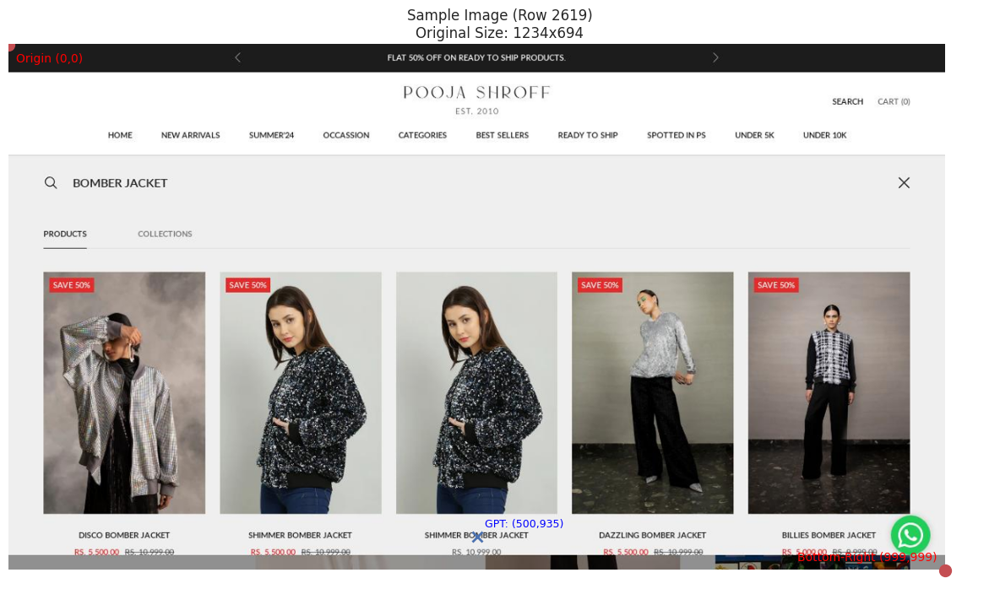

Image dimensions: Width=1234 pixels, Height=694 pixels

--- Conversations for Row 2619 ---
{ role: human, value: 'Your task is to help the user identify the precise coordinates (x, y) of a specific...' }
{ role: gpt, value: '(500, 935)' }


In [22]:
import matplotlib.pyplot as plt
import io
from PIL import Image
import json
import textwrap
import numpy as np
import re

# Define the coordinate range for visualization
MIN_COORD = 0
MAX_COORD = 999

# Ensure 'ds' and 'indices' are available from previous runs
if 'ds' not in locals() or 'indices' not in locals():
    print("Please run previous cells to load the dataset and select indices.")
    if 'indices' not in locals():
        import random
        random.seed(42)
        # Fallback just in case ds is available
        indices = random.sample(range(len(ds)), 10)

# Check if ds was overwritten by Section 2a's streaming dataset
if type(ds).__name__ == 'IterableDataset':
    print("Restoring 'ds' to the full parquet dataset...")
    from datasets import load_dataset
    if 'valid_pq' in locals():
        ds = load_dataset("parquet", data_files=valid_pq, split="train")
    else:
        print("Cannot find valid_pq to reload ds. Please re-run Section 1.")

sample_idx = indices[0]
sample = ds[sample_idx]

# --- Display the image ---
# Decode the image
img = sample["image"]
if isinstance(img, bytes):
    # Case (a): raw bytes → wrap in BytesIO and open as a PIL Image.
    img = Image.open(io.BytesIO(img))
elif isinstance(img, dict) and "bytes" in img:
    # Case (c): dict with a "bytes" key → extract and open.
    img = Image.open(io.BytesIO(img["bytes"]))

# Ensure img is always a PIL Image and converted to RGB
if hasattr(img, 'convert'):
    img = img.convert("RGB")
else:
    print(f"Warning: img is of type {type(img)} and cannot be converted to RGB directly.")

original_width = sample["width"]
original_height = sample["height"]

plt.figure(figsize=(12, 10))
plt.imshow(np.array(img)) # Convert PIL Image to NumPy array for imshow

# --- Visualize the (0,0) and (999,999) corners of the normalized grid ---
# Convert normalized corners to original pixel coordinates
pixel_0_0_x = int(round(MIN_COORD / MAX_COORD * original_width))
pixel_0_0_y = int(round(MIN_COORD / MAX_COORD * original_height))
pixel_999_999_x = int(round(MAX_COORD / MAX_COORD * original_width))
pixel_999_999_y = int(round(MAX_COORD / MAX_COORD * original_height))

# Plot the (0,0) origin
plt.plot(pixel_0_0_x, pixel_0_0_y, 'ro', markersize=10, label='(0,0) Origin (Normalized)')
plt.text(pixel_0_0_x + 10, pixel_0_0_y + 10, f'Origin (0,0)', color='red', fontsize=10, ha='left', va='top')

# Plot the (999,999) bottom-right corner
plt.plot(pixel_999_999_x, pixel_999_999_y, 'ro', markersize=10, label='(999,999) Bottom-Right (Normalized)')
plt.text(pixel_999_999_x - 10, pixel_999_999_y - 10, f'Bottom-Right (999,999)', color='red', fontsize=10, ha='right', va='bottom')


# --- Display dimensions and plot GPT conversation points ---
convos = json.loads(sample["conversations"])

# Collect GPT points for plotting
gpt_points = []
for turn_idx, turn in enumerate(convos):
    if turn["from"] == "gpt":
        value = turn["value"]
        match = re.fullmatch(r"\(([-]?\d+),\s*([-]?\d+)\)", value)
        if match:
            try:
                normalized_x = int(match.group(1))
                normalized_y = int(match.group(2))

                # Convert normalized coordinates to original pixel coordinates
                pixel_x = int(round(normalized_x / MAX_COORD * original_width))
                pixel_y = int(round(normalized_y / MAX_COORD * original_height))

                gpt_points.append(((pixel_x, pixel_y), (normalized_x, normalized_y)))
            except ValueError:
                pass # Skip if coordinates are not valid numbers

# Plot GPT points
for (px, py), (nx, ny) in gpt_points:
    plt.plot(px, py, 'bx', markersize=8, markeredgewidth=2) # Blue 'x' for GPT points
    plt.text(px + 10, py - 10, f'GPT: ({nx},{ny})', color='blue', fontsize=9, ha='left', va='bottom')


plt.title(f"Sample Image (Row {sample_idx})\nOriginal Size: {original_width}x{original_height}")
plt.axis("off")
plt.tight_layout()
plt.show()

# --- Display dimensions ---
print(f"Image dimensions: Width={original_width} pixels, Height={original_height} pixels")

# --- Display conversations in requested format ---
print(f"\n--- Conversations for Row {sample_idx} ---")
for turn in convos:
    role = turn["from"]
    # Clean the value, remove <image> and strip whitespace
    value = turn["value"].replace("<image>", "").strip()
    # For displaying, ensure multi-line values are presented on one line for brevity or wrapped
    display_value = textwrap.shorten(value.replace('\n', ' '), width=100, placeholder='...')
    print(f"{{ role: {role}, value: '{display_value}' }}")


Image dimension collection complete.

Maximum image width observed: 1454 pixels
Maximum image height observed: 817 pixels


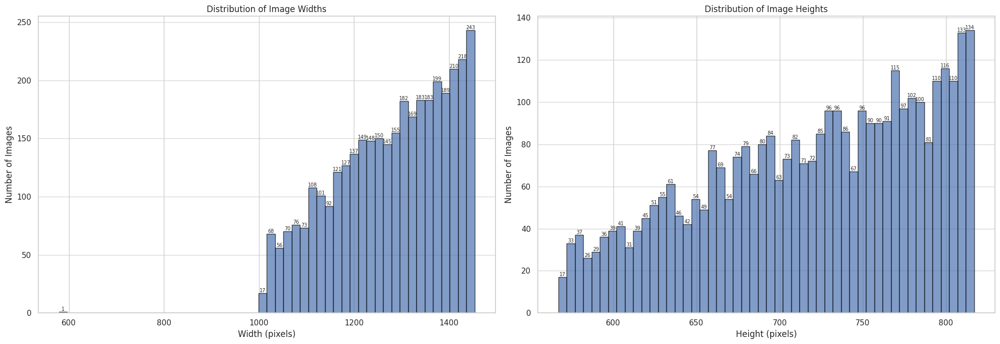

In [23]:
image_widths = []
image_heights = []

print("Collecting image dimensions...")

for i, row in enumerate(ds):
    image_widths.append(row["width"])
    image_heights.append(row["height"])
    if (i + 1) % 10000 == 0:
        print(f"Collected dimensions for {i + 1}/{len(ds)} rows...")

print("Image dimension collection complete.")

max_width = max(image_widths)
max_height = max(image_heights)

print(f"\nMaximum image width observed: {max_width} pixels")
print(f"Maximum image height observed: {max_height} pixels")

# Create histograms
fig, axes = plt.subplots(1, 2, figsize=(20, 7))

# Histogram for Widths
n_width, bins_width, patches_width = axes[0].hist(image_widths, bins=50, edgecolor='black', alpha=0.7)
axes[0].set_title('Distribution of Image Widths')
axes[0].set_xlabel('Width (pixels)')
axes[0].set_ylabel('Number of Images')
axes[0].grid(axis='y', alpha=0.75)
# Add labels on top of bars for widths
for i in range(len(patches_width)):
    if n_width[i] > 0: # Only label bars that have a count
        axes[0].text(patches_width[i].get_x() + patches_width[i].get_width() / 2,
                     patches_width[i].get_height(),
                     f'{int(n_width[i])}', ha='center', va='bottom', fontsize=7)

# Histogram for Heights
n_height, bins_height, patches_height = axes[1].hist(image_heights, bins=50, edgecolor='black', alpha=0.7)
axes[1].set_title('Distribution of Image Heights')
axes[1].set_xlabel('Height (pixels)')
axes[1].set_ylabel('Number of Images')
axes[1].grid(axis='y', alpha=0.75)
# Add labels on top of bars for heights
for i in range(len(patches_height)):
    if n_height[i] > 0: # Only label bars that have a count
        axes[1].text(patches_height[i].get_x() + patches_height[i].get_width() / 2,
                     patches_height[i].get_height(),
                     f'{int(n_height[i])}', ha='center', va='bottom', fontsize=7)

plt.tight_layout()
plt.show()

In [24]:
import collections

resolution_pairs = []
for row in ds:
    resolution_pairs.append((row["width"], row["height"]))

resolution_counts = collections.Counter(resolution_pairs)

print("Top 10 most common resolution pairs:")
for pair, count in resolution_counts.most_common(10):
    print(f"  {pair[0]}x{pair[1]}: {count} occurrences")

print(f"\nTotal unique resolution pairs: {len(resolution_counts)}")


Top 10 most common resolution pairs:
  1442x811: 23 occurrences
  1298x730: 19 occurrences
  1432x805: 18 occurrences
  1445x812: 18 occurrences
  1443x811: 18 occurrences
  1340x753: 18 occurrences
  1452x816: 17 occurrences
  1335x750: 17 occurrences
  1417x797: 17 occurrences
  1350x759: 17 occurrences

Total unique resolution pairs: 446


Calculating conversation lengths...
Conversation length calculation complete.


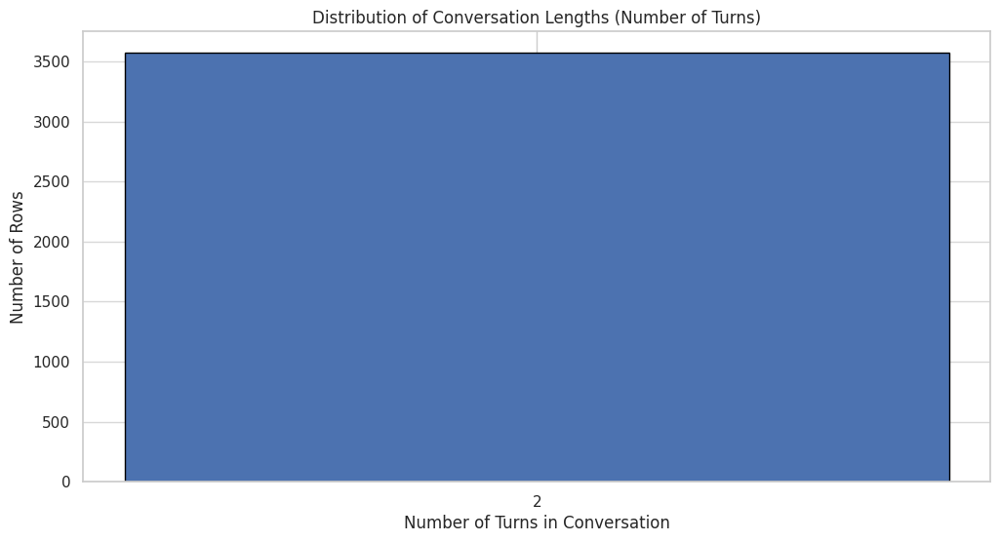

In [25]:
import collections
import matplotlib.pyplot as plt

conversation_lengths = []

print("Calculating conversation lengths...")

for i, row in enumerate(ds):
    try:
        convos = json.loads(row["conversations"])
        conversation_lengths.append(len(convos))
    except json.JSONDecodeError:
        # Handle rows where JSON might be malformed (though our earlier check found none)
        print(f"Warning: Could not parse conversations for row {i}")
        conversation_lengths.append(0) # Assign 0 or -1 for unparseable entries
    if (i + 1) % 10000 == 0:
        print(f"Processed {i + 1}/{len(ds)} rows...")

print("Conversation length calculation complete.")

# Using collections.Counter and plt.bar for clearer discrete counts
length_counts = collections.Counter(conversation_lengths)
sorted_lengths = sorted(length_counts.keys())
counts = [length_counts[length] for length in sorted_lengths]

plt.figure(figsize=(12, 6))
plt.bar(sorted_lengths, counts, edgecolor='black', align='center', width=0.8) # Use bar plot
plt.title('Distribution of Conversation Lengths (Number of Turns)')
plt.xlabel('Number of Turns in Conversation')
plt.ylabel('Number of Rows')
plt.xticks(sorted_lengths) # Set ticks directly at the center of each bar for each length
plt.grid(axis='y', alpha=0.75)
plt.show()

In [26]:
import json
import re

# List to store information about non-conforming GPT responses
non_coordinate_gpt_responses = []

# Define the expected coordinate range
MIN_COORD = 0
MAX_COORD = 999

print("Starting analysis for non-conforming GPT coordinate responses...")

for i, row in enumerate(ds):
    try:
        convos = json.loads(row["conversations"])
        for turn_idx, turn in enumerate(convos):
            if turn.get("from") == "gpt":
                value = turn.get("value", "").strip()

                # Updated regex to allow for optional negative signs before digits
                match = re.fullmatch(r"\(([-]?\d+),\s*([-]?\d+)\)", value)

                if match:
                    try:
                        x = int(match.group(1))
                        y = int(match.group(2))
                        # Explicitly check if coordinates are within the expected range
                        if not (MIN_COORD <= x <= MAX_COORD and MIN_COORD <= y <= MAX_COORD):
                            non_coordinate_gpt_responses.append(
                                (i, turn_idx, value, f"Coordinates out of bounds: ({x},{y})")
                            )
                    except ValueError:
                        # This catch-all is less likely now with the updated regex, but good practice
                        non_coordinate_gpt_responses.append(
                            (i, turn_idx, value, "Non-numeric coordinate values despite regex match")
                        )
                else:
                    # This GPT response does not fit the (x, y) format at all
                    non_coordinate_gpt_responses.append(
                        (i, turn_idx, value, "Does not match (x, y) coordinate format")
                    )

    except json.JSONDecodeError:
        non_coordinate_gpt_responses.append((i, -1, "N/A", "JSON parsing error in conversations"))

    if (i + 1) % 10000 == 0:
        print(f"Processed {i + 1}/{len(ds)} rows...")

print("\n--- Non-conforming GPT Coordinate Responses Analysis Results ---")
print(f"Total rows processed: {len(ds)}")

if non_coordinate_gpt_responses:
    print(f"Found {len(non_coordinate_gpt_responses)} issues where GPT responses were not valid (x, y) coordinates within [0, 999].")
    print("Examples (row_idx, turn_idx, actual_value, issue):")
    for issue in non_coordinate_gpt_responses[:10]: # Display up to 10 examples
        print(f"  Row {issue[0]}, Turn {issue[1]}: '{issue[2]}' -> {issue[3]}")
else:
    print("No issues found: All GPT responses in the dataset conform to the (x, y) coordinate format within the [0, 999] range.")

print("Analysis complete.")

Starting analysis for non-conforming GPT coordinate responses...

--- Non-conforming GPT Coordinate Responses Analysis Results ---
Total rows processed: 3570
No issues found: All GPT responses in the dataset conform to the (x, y) coordinate format within the [0, 999] range.
Analysis complete.


In [27]:
import json
import io
from PIL import Image, UnidentifiedImageError # Import UnidentifiedImageError
import re
import numpy as np

# Initialize lists to store issues found
missing_data = []
invalid_dimensions = []
malformed_coordinates = []
empty_expressions = []
invalid_conversation_structure = []
unreadable_images = [] # New list for unreadable images
unknown_image_formats = [] # New list for unexpected image formats (e.g., not PNG/JPEG)
image_formats = [] # New list to store all identified image formats
unexpected_coords_in_human_turns = [] # New list for human turns containing coordinates
missing_image_token_in_human_turns = [] # New list for human turns missing '<image>'

# Define the coordinate range for validation
MIN_COORD = 0
MAX_COORD = 999

print("Starting comprehensive data quality analysis...")

for i, row in enumerate(ds):
    # --- Check for missing data (image, width, height, conversations) ---
    image_present = True
    if row["image"] is None or (isinstance(row["image"], bytes) and not row["image"]) or \
       (isinstance(row["image"], dict) and "bytes" in row["image"] and not row["image"]["bytes"]):
        missing_data.append((i, "image"))
        image_present = False

    if row["width"] is None:
        missing_data.append((i, "width"))
    if row["height"] is None:
        missing_data.append((i, "height"))
    if row["conversations"] is None or not row["conversations"].strip():
        missing_data.append((i, "conversations"))

    # --- Check for invalid dimensions (zero or negative) ---
    if row["width"] is not None and row["width"] <= 0:
        invalid_dimensions.append((i, "width", row["width"]))
    if row["height"] is not None and row["height"] <= 0:
        invalid_dimensions.append((i, "height", row["height"]))

    # --- Attempt to load image to check for corruption/validity and format ---
    if image_present:
        img_data = row["image"]
        if isinstance(img_data, dict) and "bytes" in img_data:
            img_data = img_data["bytes"]

        if img_data:
            try:
                img = Image.open(io.BytesIO(img_data))
                img.verify() # Verify image integrity

                # Collect image format
                if img.format:
                    image_formats.append(img.format)

                if img.format not in ['PNG', 'JPEG']:
                    unknown_image_formats.append((i, img.format))
                img.close() # Close to free resources
            except (IOError, UnidentifiedImageError, OSError) as e:
                unreadable_images.append((i, str(e)))
        else:
            # This case should ideally be caught by missing_data['image']
            pass

    # --- Check for malformed coordinates, empty expressions, and conversation structure ---
    try:
        convos = json.loads(row["conversations"])

        # Check for even number of turns and correct alternation (human, gpt, human, gpt...)
        if len(convos) % 2 != 0:
            invalid_conversation_structure.append((i, "Odd number of turns"))

        for turn_idx, turn in enumerate(convos):
            expected_role = "human" if turn_idx % 2 == 0 else "gpt"
            if turn.get("from") != expected_role:
                invalid_conversation_structure.append(
                    (i, f"Turn {turn_idx}: Expected '{expected_role}', got '{turn.get("from")}'")
                )

            # Check for empty expressions
            if not turn.get("value", "").strip():
                empty_expressions.append((i, turn_idx, turn.get("from", "unknown")))

            # Check coordinates (only in GPT turns)
            if turn.get("from") == "gpt":
                value = turn.get("value", "").strip()
                match = re.fullmatch(r"\(([-]?\d+),\s*([-]?\d+)\)", value)

                if match:
                    try:
                        x = int(match.group(1))
                        y = int(match.group(2))
                        if not (MIN_COORD <= x <= MAX_COORD and MIN_COORD <= y <= MAX_COORD):
                            malformed_coordinates.append(
                                (i, turn_idx, value, f"Coordinates out of bounds: ({x},{y})")
                            )
                    except ValueError:
                        malformed_coordinates.append(
                            (i, turn_idx, value, "Non-numeric coordinate values despite regex match")
                        )
                else:
                    malformed_coordinates.append(
                        (i, turn_idx, value, "Does not match (x, y) coordinate format")
                    )

            # New check: Human turns should not contain coordinates
            elif turn.get("from") == "human":
                value = turn.get("value", "").strip()
                # Check if the human turn's value looks like a coordinate
                if re.search(r"\(([-]?\d+),\s*([-]?\d+)\)", value):
                    unexpected_coords_in_human_turns.append((i, turn_idx, value))

                # New check: Human turns should contain '<image>' token
                if "<image>" not in value and i not in [issue[0] for issue in missing_image_token_in_human_turns]: # Avoid duplicate reporting for the same row
                    missing_image_token_in_human_turns.append((i, turn_idx, value))

    except (json.JSONDecodeError, TypeError): # Added TypeError for cases where row["conversations"] might not be a string
        missing_data.append((i, "conversations_json_parse_error"))

    if (i + 1) % 10000 == 0:
        print(f"Processed {i + 1}/{len(ds)} rows...")

print("\n--- Comprehensive Data Quality Analysis Results ---")
print(f"Total rows processed: {len(ds)}")

print(f"\nMissing or empty data fields: {len(missing_data)} issues")
if missing_data:
    print(f"  Examples: {missing_data[:5]}...")

print(f"\nInvalid image dimensions (zero or negative): {len(invalid_dimensions)} issues")
if invalid_dimensions:
    print(f"  Examples: {invalid_dimensions[:5]}...")

print(f"\nUnreadable images (corrupted or invalid format): {len(unreadable_images)} issues")
if unreadable_images:
    print(f"  Examples: {unreadable_images[:5]}...")

print(f"\nImages with unexpected format (not PNG/JPEG): {len(unknown_image_formats)} issues")
if unknown_image_formats:
    print(f"  Examples: {unknown_image_formats[:5]}...")

# New check for consistent image format
if image_formats:
    unique_formats = set(image_formats)
    if len(unique_formats) == 1:
        print(f"\nAll images have a consistent format: {list(unique_formats)[0]}")
    else:
        print(f"\nImages have mixed formats. Found {len(unique_formats)} unique formats: {unique_formats}")
else:
    print("\nNo image formats were identified (possibly due to missing/unreadable images).")

print(f"\nMalformed or out-of-bounds coordinates: {len(malformed_coordinates)} issues")
if malformed_coordinates:
    print("  Examples (row_idx, turn_idx, actual_value, issue):")
    for issue in malformed_coordinates[:5]:
        print(f"    {issue}")

print(f"\nEmpty conversation expressions: {len(empty_expressions)} issues")
if empty_expressions:
    print("  Examples (row_idx, turn_idx, speaker):")
    for issue in empty_expressions[:5]:
        print(f"    {issue}")

print(f"\nInvalid conversation structure (e.g., odd turns, wrong order): {len(invalid_conversation_structure)} issues")
if invalid_conversation_structure:
    print(f"  Examples: {invalid_conversation_structure[:5]}...")

# Print results for new checks
print(f"\nUnexpected coordinates found in human turns: {len(unexpected_coords_in_human_turns)} issues")
if unexpected_coords_in_human_turns:
    print("  Examples (row_idx, turn_idx, value):")
    for issue in unexpected_coords_in_human_turns[:5]:
        print(f"    {issue}")

print(f"\nMissing '<image>' token in human turns: {len(missing_image_token_in_human_turns)} issues")
if missing_image_token_in_human_turns:
    print("  Examples (row_idx, turn_idx, value):")
    for issue in missing_image_token_in_human_turns[:5]:
        print(f"    {issue}")

print("Analysis complete.")

# --- Removing problematic rows ---
# Consolidate all unique problematic row indices
problematic_indices = set()

# Add indices from malformed_coordinates (which includes out-of-bounds)
for issue in malformed_coordinates:
    problematic_indices.add(issue[0])

# Add indices from unexpected_coords_in_human_turns
for issue in unexpected_coords_in_human_turns:
    problematic_indices.add(issue[0])

# Add indices from missing_image_token_in_human_turns
for issue in missing_image_token_in_human_turns:
    problematic_indices.add(issue[0])

# Convert to a sorted list for consistent reporting
problematic_indices_list = sorted(list(problematic_indices))

print(f"\nTotal unique problematic rows identified for removal: {len(problematic_indices_list)}")

# Create a boolean array indicating which rows to keep
indices_to_keep = np.ones(len(ds), dtype=bool)
for idx in problematic_indices_list:
    indices_to_keep[idx] = False

# Filter the dataset to create a cleaned version - WE SHOULD USE THIS GOING FORWARD?
ds_cleaned = ds.filter(lambda example, idx: indices_to_keep[idx], with_indices=True)

# Create a dataset of just the problematic rows for inspection
ds_problematic = ds.filter(lambda example, idx: not indices_to_keep[idx], with_indices=True)

print(f"Original dataset size: {len(ds)} rows")
print(f"Number of rows removed: {len(problematic_indices_list)}")
print(f"Cleaned dataset size: {len(ds_cleaned)} rows")
print(f"Problematic dataset size (rows that were removed): {len(ds_problematic)} rows")


Starting comprehensive data quality analysis...

--- Comprehensive Data Quality Analysis Results ---
Total rows processed: 3570

Missing or empty data fields: 0 issues

Invalid image dimensions (zero or negative): 0 issues

Unreadable images (corrupted or invalid format): 0 issues

Images with unexpected format (not PNG/JPEG): 0 issues

All images have a consistent format: PNG

Malformed or out-of-bounds coordinates: 0 issues

Empty conversation expressions: 0 issues

Invalid conversation structure (e.g., odd turns, wrong order): 0 issues

Unexpected coordinates found in human turns: 0 issues

Missing '<image>' token in human turns: 0 issues
Analysis complete.

Total unique problematic rows identified for removal: 0


Filter:   0%|          | 0/3570 [00:00<?, ? examples/s]

Filter:   0%|          | 0/3570 [00:00<?, ? examples/s]

Original dataset size: 3570 rows
Number of rows removed: 0
Cleaned dataset size: 3570 rows
Problematic dataset size (rows that were removed): 0 rows


In [28]:
import json

# We'll use the same sample_idx as before for consistency
sample_idx = indices[0] # This was 41905 in the previous run
sample = ds[sample_idx]

# Get original image dimensions
original_width = sample["width"]
original_height = sample["height"]

# Parse conversations
convos = json.loads(sample["conversations"])

# Find the first GPT turn with coordinates
normalized_x = None
normalized_y = None
for turn in convos:
    if turn["from"] == "gpt":
        value = turn["value"]
        # Coordinates are expected in the format '(x, y)'
        if value.startswith('(') and value.endswith(')'):
            coord_str = value[1:-1]
            try:
                normalized_x, normalized_y = map(int, coord_str.split(','))
                break # Found the first one, exit loop
            except ValueError:
                pass # Not a valid coordinate pair, continue searching

if normalized_x is not None and normalized_y is not None:
    # Calculate original coordinates
    original_x = int(round(normalized_x / 999 * original_width))
    original_y = int(round(normalized_y / 999 * original_height))

    print(f"Original Image Size: {original_width}x{original_height}")
    print(f"Normalized Coordinate (0-999): ({normalized_x}, {normalized_y})")
    print(f"Converted Original Pixel Coordinate: ({original_x}, {original_y})")
else:
    print(f"Could not find a valid GPT coordinate in sample {sample_idx}.")


Original Image Size: 1234x694
Normalized Coordinate (0-999): (500, 935)
Converted Original Pixel Coordinate: (618, 650)


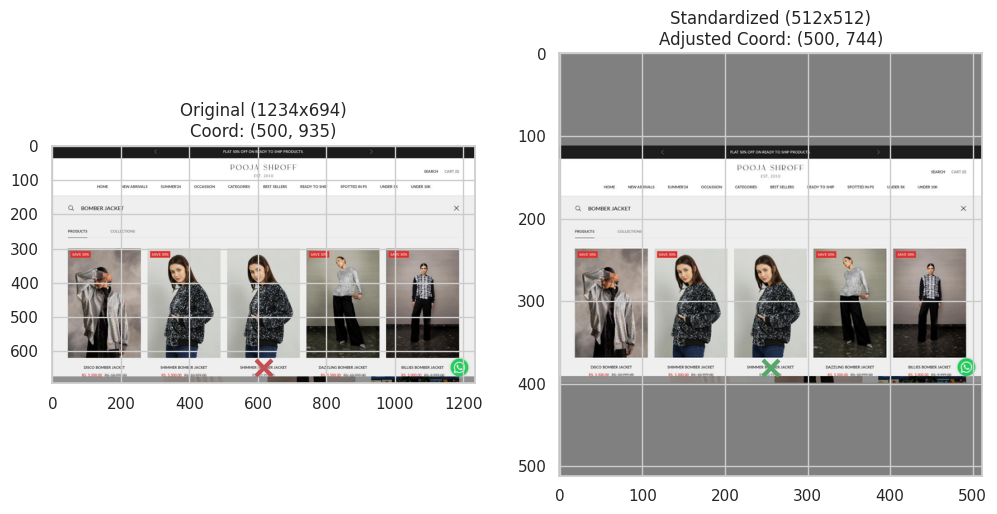

In [29]:
import numpy as np
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import json
import io
import re

TARGET_RESOLUTION = 512 # Standardize to 512x512 for training

def standardize_sample_for_training(img, original_coords_999):
    orig_w, orig_h = img.size

    # 1. Calculate scale factor to fit within TARGET_RESOLUTION
    scale = min(TARGET_RESOLUTION / orig_w, TARGET_RESOLUTION / orig_h)
    new_w = int(orig_w * scale)
    new_h = int(orig_h * scale)

    # 2. Resize image
    resized_img = img.resize((new_w, new_h), Image.Resampling.LANCZOS)

    # 3. Create target canvas and paste resized image (padding)
    pad_x = (TARGET_RESOLUTION - new_w) // 2
    pad_y = (TARGET_RESOLUTION - new_h) // 2
    standardized_img = Image.new("RGB", (TARGET_RESOLUTION, TARGET_RESOLUTION), (128, 128, 128))
    standardized_img.paste(resized_img, (pad_x, pad_y))

    # 4. Adjust the coordinates
    adjusted_coords_999 = []
    for (nx, ny) in original_coords_999:
        # Convert normalized [0,999] to original pixels
        px = nx / 999.0 * orig_w
        py = ny / 999.0 * orig_h

        # Scale to resized pixels and add padding offset
        new_px = (px * scale) + pad_x
        new_py = (py * scale) + pad_y

        # Convert back to normalized [0,999] relative to the NEW padded canvas
        new_nx = int(round((new_px / TARGET_RESOLUTION) * 999))
        new_ny = int(round((new_py / TARGET_RESOLUTION) * 999))
        adjusted_coords_999.append((new_nx, new_ny))

    return standardized_img, adjusted_coords_999

# --- Test it on our sample ---
sample = ds[indices[0]]
img = Image.open(io.BytesIO(sample["image"]["bytes"] if isinstance(sample["image"], dict) else sample["image"])).convert("RGB")

# Extract first GPT coordinate
orig_coords = []
for turn in json.loads(sample["conversations"]):
    if turn["from"] == "gpt":
        match = re.fullmatch(r"\(([-]?\d+),\s*([-]?\d+)\)", turn["value"].strip())
        if match:
            orig_coords.append((int(match.group(1)), int(match.group(2))))
            break

standardized_img, adjusted_coords = standardize_sample_for_training(img, orig_coords)

# --- Visualization ---
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Original
axes[0].imshow(img)
orig_px = orig_coords[0][0] / 999.0 * img.width
orig_py = orig_coords[0][1] / 999.0 * img.height
axes[0].plot(orig_px, orig_py, 'rx', markersize=12, markeredgewidth=3)
axes[0].set_title(f"Original ({img.width}x{img.height})\nCoord: {orig_coords[0]}")

# Standardized
axes[1].imshow(standardized_img)
adj_px = adjusted_coords[0][0] / 999.0 * TARGET_RESOLUTION
adj_py = adjusted_coords[0][1] / 999.0 * TARGET_RESOLUTION
axes[1].plot(adj_px, adj_py, 'gx', markersize=12, markeredgewidth=3)
axes[1].set_title(f"Standardized ({TARGET_RESOLUTION}x{TARGET_RESOLUTION})\nAdjusted Coord: {adjusted_coords[0]}")

plt.show()


## 4. Model Evaluation

### 4.1 Florence-2 (0.77B)

This section covers our Florence-2 pipeline:
1. Model selection justification & architecture overview
2. Data preprocessing for Florence-2
3. Dataset class, collator, and DataLoader
4. Zero-shot inference demo
5. Evaluation: L2, tolerance accuracy, GT-in-predicted-box
6. Fine-tuning setup (freeze vision encoder, training loop)
7. Results visualisation & interpretation
8. Architecture/resource comparison vs. Qwen2-VL (2B)

### 4.1.1 Model Overview & Architecture Justification

Florence-2-large (0.77B) is a unified vision-language model from Microsoft Research trained on the FLD-5B dataset.  
It uses a **sequence-to-sequence** architecture, which makes it straightforward to fine-tune for tasks that require text output conditioned on an image.

#### Architecture summary

| Component | Details |
|---|---|
| Image Encoder | DaViT (Dual Attention Vision Transformer) |
| Language Head | BART-style encoder–decoder |
| Total Parameters | **0.77 B** (Florence-2-large) |
| Native Coord Format | `<loc_XYZ>` tokens, range 0–999 |
| Grounding Task | `<REFERRING_EXPRESSION_COMPREHENSION>` → bounding box |

#### Why Florence-2 for UI grounding?

- **Native 0–999 coordinate tokens** — UGround normalises all coordinates to [0, 999], exactly matching Florence-2's `<loc_XYZ>` vocabulary.
- **Compact size** — at 0.77 B it is ~2.6× smaller than Qwen2-VL (2B), enabling faster training iterations with less GPU memory.
- **Strong zero-shot REC baseline** — `<REFERRING_EXPRESSION_COMPREHENSION>` (REC) allows out-of-the-box referring expression grounding without any fine-tuning.
- **LoRA-friendly** — standard transformer decoder makes low-rank adaptation straightforward.

In [30]:
from transformers import AutoProcessor, AutoModelForCausalLM
import torch

FLORENCE_MODEL_ID = "multimodalart/Florence-2-large-no-flash-attn"
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

if torch.cuda.is_available():
    gpu = torch.cuda.get_device_name(0)
    mem = torch.cuda.get_device_properties(0).total_memory / 1e9
    print(f"[1/2] Device: {DEVICE} ({gpu}, {mem:.1f} GB)")
else:
    print(f"[1/2] Device: {DEVICE}")

print(f"[2/2] Loading {FLORENCE_MODEL_ID}...")
florence_processor = AutoProcessor.from_pretrained(
    FLORENCE_MODEL_ID, trust_remote_code=True,
)
florence_model = AutoModelForCausalLM.from_pretrained(
    FLORENCE_MODEL_ID,
    torch_dtype=torch.float16 if DEVICE.type == "cuda" else torch.float32,
    trust_remote_code=True,
).to(DEVICE)
florence_model.eval()
total_params = sum(p.numel() for p in florence_model.parameters()) / 1e6
print(f"[2/2] Loaded. Parameters: {total_params:.1f} M  |  dtype: {next(florence_model.parameters()).dtype}")

[1/2] Device: cuda (NVIDIA A100-SXM4-40GB, 42.4 GB)
[2/2] Loading multimodalart/Florence-2-large-no-flash-attn...


preprocessor_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

processing_florence2.py: 0.00B [00:00, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/multimodalart/Florence-2-large-no-flash-attn:
- processing_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


tokenizer_config.json:   0%|          | 0.00/34.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

config.json: 0.00B [00:00, ?B/s]

configuration_florence2.py: 0.00B [00:00, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/multimodalart/Florence-2-large-no-flash-attn:
- configuration_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
/usr/local/lib/python3.12/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


modeling_florence2.py: 0.00B [00:00, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/multimodalart/Florence-2-large-no-flash-attn:
- modeling_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


pytorch_model.bin:   0%|          | 0.00/1.54G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/51.0 [00:00<?, ?B/s]

[2/2] Loaded. Parameters: 822.7 M  |  dtype: torch.float16


### 4.1.2 Data Preprocessing

Build the evaluation item list from the 20% test split defined in §1.
This same `test_eval_items` list is used for both zero-shot and fine-tuned evaluation,
ensuring all comparisons are on identical data.

Florence-2's `<REFERRING_EXPRESSION_COMPREHENSION>` (REC) task expects:
- **Input:** `<REC> <element description>` + image
- **Output:** `<loc_x1><loc_y1><loc_x2><loc_y2>` bounding box

In [31]:
import re, json, io
from PIL import Image
from torch.utils.data import Dataset


def extract_uground_sample(row):
    """Parse a UGround dataset row into (image, referring_expr, gt_point).
    Handles conversations as a JSON string OR an already-parsed list.
    Image may be raw bytes or a dict with a 'bytes' key.
    """
    # --- Image ---
    img_data = row.get("image")
    if img_data is None:
        return None
    try:
        if isinstance(img_data, bytes):
            img = Image.open(io.BytesIO(img_data)).convert("RGB")
        elif isinstance(img_data, dict) and "bytes" in img_data:
            img = Image.open(io.BytesIO(img_data["bytes"])).convert("RGB")
        else:
            img = img_data.convert("RGB") if hasattr(img_data, "convert") else None
        if img is None:
            return None
    except Exception:
        return None

    # --- Conversations: string or already-parsed list ---
    convos_raw = row.get("conversations")
    try:
        if isinstance(convos_raw, str):
            convos = json.loads(convos_raw)
        elif isinstance(convos_raw, list):
            convos = convos_raw
        else:
            return None
    except (json.JSONDecodeError, TypeError):
        return None

    referring_expr, gt_point = None, None
    for turn in convos:
        if turn.get("from") == "human" and referring_expr is None:
            referring_expr = re.sub(r"<image>", "", turn.get("value", "")).strip()
        if turn.get("from") == "gpt" and gt_point is None:
            m = re.fullmatch(r"\(\s*(\d+)\s*,\s*(\d+)\s*\)", turn.get("value", "").strip())
            if m:
                gt_point = (int(m.group(1)), int(m.group(2)))

    if not referring_expr or gt_point is None:
        return None

    return {
        "image": img,
        "referring_expression": referring_expr,
        "gt_point": gt_point,
        "width": row.get("width") or img.width,
        "height": row.get("height") or img.height,
    }

In [32]:
# ============================================================
# Build evaluation items from the 20% test split (§1)
# ============================================================
# All models (Florence zero-shot, Florence fine-tuned, Qwen) evaluate
# on the same test set for apples-to-apples comparison.

import io
from PIL import Image

assert "test_indices" in dir(), "Run §1 (train/test split) first."

def build_eval_items(dataset, indices_set):
    items = []
    for ri in sorted(indices_set):
        row = dataset[int(ri)]
        # Decode image
        img_data = row.get("image")
        try:
            if isinstance(img_data, bytes):
                img = Image.open(io.BytesIO(img_data)).convert("RGB")
            elif isinstance(img_data, dict) and "bytes" in img_data:
                img = Image.open(io.BytesIO(img_data["bytes"])).convert("RGB")
            else:
                img = img_data.convert("RGB") if hasattr(img_data, "convert") else None
            if img is None:
                continue
        except Exception:
            continue

        # Parse conversation
        convos_raw = row.get("conversations")
        try:
            convos = json.loads(convos_raw) if isinstance(convos_raw, str) else convos_raw
        except (json.JSONDecodeError, TypeError):
            continue

        for pi in range(0, len(convos) - 1, 2):
            h, g = convos[pi], convos[pi + 1]
            if h.get("from") != "human" or g.get("from") != "gpt":
                continue
            m = re.search(r"\(\s*(-?\d+)\s*,\s*(-?\d+)\s*\)", g.get("value", ""))
            if m is None:
                continue
            items.append({
                "source_idx":           ri,
                "width":                row["width"],
                "height":               row["height"],
                "referring_expression": h.get("value", ""),
                "gt_point":             (int(m.group(1)), int(m.group(2))),
                "image":                img,
            })
    return items

test_eval_items = build_eval_items(ds, test_indices)
print(f"Test eval set: {len(test_eval_items)} items from {len(test_indices)} test rows")
print(f"Sample: RE={test_eval_items[0]['referring_expression'][:70]}...")
print(f"        GT={test_eval_items[0]['gt_point']}  |  {test_eval_items[0]['width']}x{test_eval_items[0]['height']}")

Test eval set: 714 items from 714 test rows
Sample: RE=<image>
Your task is to help the user identify the precise coordinates...
        GT=(335, 545)  |  1436x807


> **Note:** The evaluation items (`test_eval_items`) were built in §4.1.2 above
> from the 20% test split. The same set is reused for both zero-shot (§4.1.3)
> and fine-tuned (§4.1.7) evaluation.

### 4.1.3 Zero-Shot Inference

Before any fine-tuning, we run Florence-2 in **zero-shot** mode using the  
`<REFERRING_EXPRESSION_COMPREHENSION>` task to establish a baseline.  

This mirrors the approach from the reference fine-tuning notebook (Cell 9).

In [33]:
import time, re

TASK = "<REFERRING_EXPRESSION_COMPREHENSION>"

# Regex to extract loc tokens directly from raw output as fallback
_LOC_RE = re.compile(r"<loc_(\d+)><loc_(\d+)><loc_(\d+)><loc_(\d+)>")

def extract_element_description(text):
    """Extract the actual element description from UGround's verbose prompt format.
    UGround prompts: 'Your task is to help...described as follows: Click the search button'
    We want: 'the search button'
    """
    text = text.replace("<image>", "").strip()

    # UGround format: extract after 'described as follows:' or 'element is:'
    for marker in ["described as follows:", "element is:", "looking for:", "locate:"]:
        if marker in text.lower():
            idx = text.lower().index(marker) + len(marker)
            text = text[idx:].strip()
            break

    # Strip leading action verbs
    text = re.sub(r"^(click\s+(on\s+)?|tap\s+(on\s+)?|press\s+|select\s+|find\s+|locate\s+|identify\s+)", "", text, flags=re.IGNORECASE)
    # Truncate at first preposition to keep the noun phrase
    text = re.split(r"\s+(at|in|near|located|within)\s+", text)[0]
    return text.strip() or "the element"


def parse_box_from_raw(raw_text, image_w, image_h):
    """Fallback: extract loc tokens directly from raw generated text."""
    m = _LOC_RE.search(raw_text)
    if not m:
        return None
    x1, y1, x2, y2 = [int(v) for v in m.groups()]
    # Skip degenerate full-image boxes (0,0,998,998)
    if x1 == 0 and y1 == 0 and x2 >= 997 and y2 >= 997:
        return None
    # Convert from [0,999] space to pixel space
    px1 = x1 / 999 * image_w
    py1 = y1 / 999 * image_h
    px2 = x2 / 999 * image_w
    py2 = y2 / 999 * image_h
    return [px1, py1, px2, py2]


def run_example(task_prompt, text_input, image):
    cleaned = extract_element_description(text_input)
    prompt = task_prompt + " " + cleaned
    if image.mode != "RGB":
        image = image.convert("RGB")

    with torch.inference_mode():
        inputs = florence_processor(text=prompt, images=image, return_tensors="pt").to(DEVICE)
        generated_ids = florence_model.generate(
            input_ids=inputs["input_ids"],
            pixel_values=inputs["pixel_values"].to(
                torch.float16 if DEVICE.type == "cuda" else torch.float32
            ),
            max_new_tokens=64,
            do_sample=False,
            num_beams=3,
        )
    raw_text = florence_processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
    parsed = florence_processor.post_process_generation(
        raw_text, task=task_prompt, image_size=(image.width, image.height),
    )
    del inputs, generated_ids
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    return parsed, raw_text, cleaned


# --- Run on test_eval_items ---
import gc
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()
    free_gb = torch.cuda.mem_get_info()[0] / 1e9
    total_gb = torch.cuda.get_device_properties(0).total_memory / 1e9
    print(f"GPU memory: {total_gb - free_gb:.1f} / {total_gb:.1f} GB used  ({free_gb:.1f} GB free)")
    if free_gb < 1.5:
        print("WARNING: < 1.5 GB free. Do Runtime → Disconnect and delete runtime, then rerun sections 0, 1, 4a only.")
        raise MemoryError("Insufficient GPU memory.")

TOTAL = len(test_eval_items)
print(f"Zero-shot inference on {TOTAL} samples...")
print("-" * 55)

results = []
t0 = time.time()
n_pred = 0

for i, sample_data in enumerate(test_eval_items):
    parsed, raw_text, cleaned_expr = run_example(
        TASK, sample_data["referring_expression"], sample_data["image"]
    )
    w, h = sample_data["width"], sample_data["height"]

    pred_box = None
    if TASK in parsed:
        out = parsed[TASK]
        if isinstance(out, dict):
            boxes = out.get("bboxes", [])
            if boxes:
                pred_box = boxes[0]

    if pred_box is None:
        pred_box = parse_box_from_raw(raw_text, w, h)

    if pred_box is not None:
        n_pred += 1

    if i < 3:
        print(f"[{i}] Cleaned : {cleaned_expr}")
        print(f"     Raw    : {raw_text[5:100]}")
        print(f"     Box    : {[round(v) for v in pred_box] if pred_box else None}")

    results.append({
        "source_idx":           sample_data["source_idx"],
        "referring_expression": sample_data["referring_expression"],
        "gt_point":             sample_data["gt_point"],
        "image_size":           (w, h),
        "image":                sample_data["image"],
        "pred_box_pixels":      pred_box,
    })

    elapsed = time.time() - t0
    rate = (i + 1) / elapsed
    eta = (TOTAL - i - 1) / rate
    bar_filled = int(30 * (i + 1) / TOTAL)
    bar = "█" * bar_filled + "░" * (30 - bar_filled)
    from IPython.display import clear_output
    clear_output(wait=True)
    print(f"Florence-2 zero-shot inference")
    print(f"{bar} {i+1}/{TOTAL}")
    print(f"hit rate : {n_pred/(i+1)*100:.0f}%  ({n_pred} predicted)")
    print(f"elapsed  : {elapsed:.0f}s   ETA: {eta:.0f}s   ({rate:.1f} samp/s)")

elapsed = time.time() - t0
n = max(len(results), 1)
print("-" * 55)
print(f"Done. {len(results):,} samples in {elapsed:.1f}s ({elapsed/n:.2f}s/sample, {n/elapsed*60:.1f}/min)")
print(f"Prediction rate: {n_pred/n*100:.1f}%  ({n_pred}/{n} with a valid box)")

Florence-2 zero-shot inference
██████████████████████████████ 714/714
hit rate : 62%  (446 predicted)
elapsed  : 249s   ETA: 0s   (2.9 samp/s)
-------------------------------------------------------
Done. 714 samples in 249.2s (0.35s/sample, 171.9/min)
Prediction rate: 62.5%  (446/714 with a valid box)


### 4.1.4 Metrics & Results

Based on TF feedback, we move beyond simple L2 distance.  
**"Being within the region"** of the target element is functionally correct — a click anywhere on a button is a successful interaction.

#### Metrics

| Metric | Definition | Rationale |
|---|---|---|
| **L2 Distance (px)** | Euclidean distance between predicted center and GT point | Simplest baseline; fully differentiable |
| **Normalised L2** | L2 / image diagonal | Resolution-invariant; comparable across screen sizes |
| **Tolerance Acc @ k%** | `1[L2 < k% × diagonal]` (k = 5, 10, 25) | Standard in grounding literature; captures "close enough" |
| **GT-in-predicted-box** | `1[GT_x ∈ [x̂₁,x̂₂] and GT_y ∈ [ŷ₁,ŷ₂]]` | Florence-2-specific: did the predicted box cover the GT point? |

> **Why not just L2?**  A prediction 30 px from center on a 200×50 button is still functionally correct.  
> Tolerance accuracy and GT-in-box capture this — penalising catastrophic misses while accepting near-misses.

In [34]:
import numpy as np
import pandas as pd

# Convert Florence-2 bounding box results to (x, y) center points
# Same metric pipeline as Qwen2-VL for direct comparison.

rows = []
for r in results:
    gt_nx, gt_ny = r["gt_point"]
    orig_w, orig_h = r["image_size"]

    if r["pred_box_pixels"] is None:
        rows.append({
            "source_idx": r["source_idx"], "width": orig_w, "height": orig_h,
            "gt_x": gt_nx, "gt_y": gt_ny, "pred_x": None, "pred_y": None,
        })
        continue

    x1, y1, x2, y2 = r["pred_box_pixels"]
    cx_norm = int(((x1 + x2) / 2) / orig_w * 999)
    cy_norm = int(((y1 + y2) / 2) / orig_h * 999)
    rows.append({
        "source_idx": r["source_idx"], "width": orig_w, "height": orig_h,
        "gt_x": gt_nx, "gt_y": gt_ny, "pred_x": cx_norm, "pred_y": cy_norm,
    })

df = pd.DataFrame(rows)
n_total = len(df)

df["parsed"] = df["pred_x"].notna() & df["pred_y"].notna()
parse_rate = df["parsed"].mean() * 100

in_bounds_mask = df["parsed"] & df["pred_x"].between(0, 999) & df["pred_y"].between(0, 999)
oob_count = (df["parsed"] & ~in_bounds_mask).sum()
oob_rate = oob_count / max(df["parsed"].sum(), 1) * 100

valid = df[in_bounds_mask].copy()

if len(valid) > 0:
    valid["err_norm"] = np.sqrt((valid["pred_x"] - valid["gt_x"])**2 + (valid["pred_y"] - valid["gt_y"])**2)
    valid["err_norm_x"] = (valid["pred_x"] - valid["gt_x"]).abs()
    valid["err_norm_y"] = (valid["pred_y"] - valid["gt_y"]).abs()
    pred_px_x = valid["pred_x"] / 999.0 * valid["width"]
    pred_px_y = valid["pred_y"] / 999.0 * valid["height"]
    gt_px_x   = valid["gt_x"]   / 999.0 * valid["width"]
    gt_px_y   = valid["gt_y"]   / 999.0 * valid["height"]
    valid["err_px"] = np.sqrt((pred_px_x - gt_px_x)**2 + (pred_px_y - gt_px_y)**2)
    img_diag = np.sqrt(valid["width"]**2 + valid["height"]**2)
    valid["err_pct_diag"] = valid["err_px"] / img_diag * 100

def acc_at(col, threshold):
    if len(valid) == 0: return 0.0
    return (valid[col] <= threshold).sum() / n_total * 100

sep = "=" * 72
print(sep)
print("  Florence-2 Zero-Shot Baseline on UGround (box center as predicted point)")
print("  Eval size: " + str(n_total) + " samples | greedy decoding")
print(sep)
print("")
print("[Format compliance]")
print("  Parse rate (got a bounding box)           : " + f"{parse_rate:6.2f}%")
print("  Out-of-bounds rate (of parsed)            : " + f"{oob_rate:6.2f}%  (" + str(int(oob_count)) + " samples)")
print("  Usable predictions (parsed + in bounds)   : " + str(len(valid)) + " / " + str(n_total) + " (" + f"{len(valid)/max(n_total,1)*100:.2f}%)")

if len(valid) > 0:
    print("")
    print("[Distance error - normalized space (0-999)]")
    print("  Mean Euclidean error    : " + f"{valid['err_norm'].mean():6.1f}")
    print("  Median Euclidean error  : " + f"{valid['err_norm'].median():6.1f}")
    print("  Mean |dx|               : " + f"{valid['err_norm_x'].mean():6.1f}")
    print("  Mean |dy|               : " + f"{valid['err_norm_y'].mean():6.1f}")
    print("")
    print("[Distance error - pixel space]")
    print("  Mean pixel error        : " + f"{valid['err_px'].mean():6.1f} px")
    print("  Median pixel error      : " + f"{valid['err_px'].median():6.1f} px")
    print("  Mean error / diagonal   : " + f"{valid['err_pct_diag'].mean():6.2f}%")
    print("")
    print("[Accuracy @ pixel thresholds (% of all " + str(n_total) + " samples)]")
    for thr in [5, 10, 25, 50, 100, 200]:
        print("  Acc @ " + str(thr).rjust(3) + " px  : " + f"{acc_at('err_px', thr):6.2f}%")
    print("")
    print("[Accuracy @ normalized thresholds]")
    for thr in [10, 25, 50, 100, 200]:
        print("  Acc @ " + str(thr).rjust(3) + "       : " + f"{acc_at('err_norm', thr):6.2f}%")
    print("")
    print("[Accuracy @ relative thresholds (% of image diagonal)]")
    for thr in [1, 2, 5, 10]:
        print("  Acc @ " + str(thr).rjust(2) + "% diag  : " + f"{acc_at('err_pct_diag', thr):6.2f}%")

print(sep)
df.to_csv("/content/florence2_zeroshot_results.csv", index=False)
print("Results saved to /content/florence2_zeroshot_results.csv")


  Florence-2 Zero-Shot Baseline on UGround (box center as predicted point)
  Eval size: 714 samples | greedy decoding

[Format compliance]
  Parse rate (got a bounding box)           :  62.46%
  Out-of-bounds rate (of parsed)            :   0.00%  (0 samples)
  Usable predictions (parsed + in bounds)   : 446 / 714 (62.46%)

[Distance error - normalized space (0-999)]
  Mean Euclidean error    :  487.3
  Median Euclidean error  :  497.7
  Mean |dx|               :  251.3
  Mean |dy|               :  371.7

[Distance error - pixel space]
  Mean pixel error        :  458.8 px
  Median pixel error      :  433.4 px
  Mean error / diagonal   :  31.19%

[Accuracy @ pixel thresholds (% of all 714 samples)]
  Acc @   5 px  :   0.70%
  Acc @  10 px  :   0.70%
  Acc @  25 px  :   1.12%
  Acc @  50 px  :   1.68%
  Acc @ 100 px  :   3.08%
  Acc @ 200 px  :   7.84%

[Accuracy @ normalized thresholds]
  Acc @  10       :   0.70%
  Acc @  25       :   0.84%
  Acc @  50       :   1.68%
  Acc @ 100     

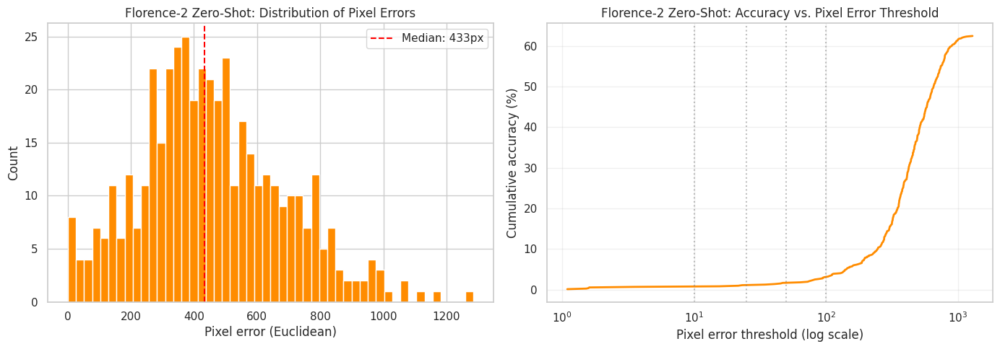

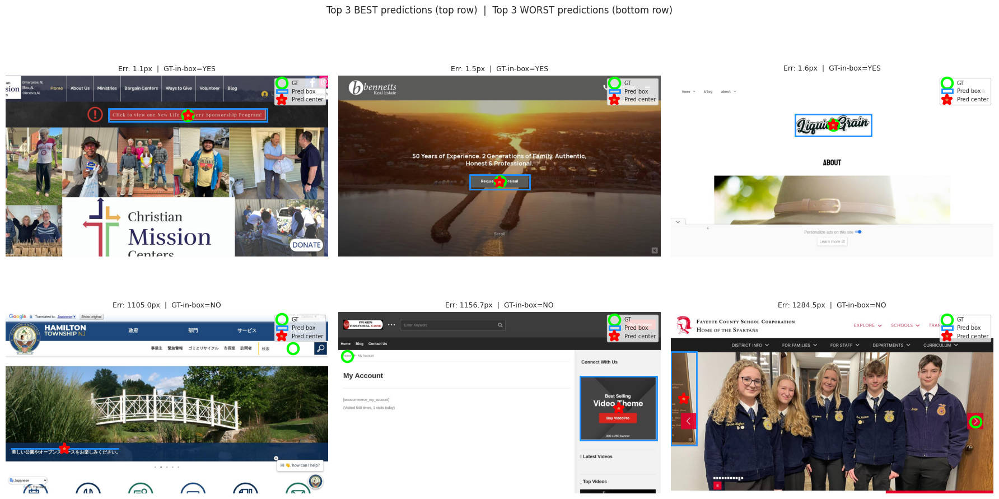

In [35]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# ── Plot 1: Error distribution + cumulative accuracy curve ───────────────────
if len(valid) > 0:
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    axes[0].hist(valid["err_px"], bins=50, color="darkorange", edgecolor="white")
    axes[0].axvline(valid["err_px"].median(), color="red", linestyle="--",
                    label="Median: " + f"{valid['err_px'].median():.0f}px")
    axes[0].set_xlabel("Pixel error (Euclidean)")
    axes[0].set_ylabel("Count")
    axes[0].set_title("Florence-2 Zero-Shot: Distribution of Pixel Errors")
    axes[0].legend()

    sorted_err = np.sort(valid["err_px"].values)
    cum_acc = np.arange(1, len(sorted_err) + 1) / n_total * 100
    axes[1].plot(sorted_err, cum_acc, color="darkorange", linewidth=2)
    axes[1].set_xscale("log")
    axes[1].set_xlabel("Pixel error threshold (log scale)")
    axes[1].set_ylabel("Cumulative accuracy (%)")
    axes[1].set_title("Florence-2 Zero-Shot: Accuracy vs. Pixel Error Threshold")
    axes[1].grid(True, alpha=0.3)
    for thr in [10, 25, 50, 100]:
        axes[1].axvline(thr, color="gray", linestyle=":", alpha=0.5)

    plt.tight_layout()
    plt.show()

# ── Plot 2: Best / worst examples grid ───────────────────────────────────────
if len(valid) >= 6:
    valid_sorted = valid.sort_values("err_px")
    example_indices = list(valid_sorted.head(3).index) + list(valid_sorted.tail(3).index)

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()

    for ax, idx in zip(axes, example_indices):
        r = results[idx]
        img = r["image"].copy()
        orig_w, orig_h = r["image_size"]

        ax.imshow(img)

        # GT point
        gt_nx, gt_ny = r["gt_point"]
        gt_px_x = gt_nx / 999.0 * orig_w
        gt_px_y = gt_ny / 999.0 * orig_h
        ax.plot(gt_px_x, gt_px_y, "o", markersize=14, markerfacecolor="none",
                markeredgecolor="lime", markeredgewidth=3, label="GT")

        row = df.iloc[idx]
        err_px = valid.loc[idx, "err_px"] if idx in valid.index else float("nan")

        if r["pred_box_pixels"] is not None:
            x1, y1, x2, y2 = r["pred_box_pixels"]
            cx = (x1 + x2) / 2
            cy = (y1 + y2) / 2
            # Draw predicted box
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                      linewidth=2, edgecolor="dodgerblue",
                                      facecolor="none", label="Pred box")
            ax.add_patch(rect)
            # Draw predicted center
            ax.plot(cx, cy, "*", markersize=14, markeredgecolor="red",
                    markeredgewidth=3, label="Pred center")

        ax.set_title("Err: " + f"{err_px:.1f}px" + "  |  GT-in-box=" +
                     ("YES" if r["pred_box_pixels"] and
                      r["pred_box_pixels"][0] <= gt_px_x <= r["pred_box_pixels"][2] and
                      r["pred_box_pixels"][1] <= gt_px_y <= r["pred_box_pixels"][3] else "NO"),
                     fontsize=9)
        ax.legend(loc="upper right", fontsize=7)
        ax.axis("off")

    plt.suptitle("Top 3 BEST predictions (top row)  |  Top 3 WORST predictions (bottom row)",
                 fontsize=12)
    plt.tight_layout()
    plt.show()


### 4.1.5 Architecture & Resource Comparison

| | **Florence-2-large** | **Qwen2-VL-2B** |
|---|---|---|
| Parameters | **0.77 B** | 2 B |
| Image Encoder | DaViT (Dual Attention ViT) | ViT with RoPE-2D |
| Language Head | BART encoder–decoder | Qwen2 decoder-only |
| Native Coord Format | `<loc_XYZ>` tokens (0–999) | `(x, y)` point (0–999) |
| Native Grounding Output | Bounding box | Point |
| GPU Memory (fp16) | ~3–4 GB | ~6–8 GB |
| Relative Inference Speed | ~2.6× faster | Baseline |

**Key observation**: Florence-2 natively outputs *boxes*, while UGround labels are *points*.  
Qwen2-VL is pre-trained to output points directly, which is a closer fit.  
This makes the Florence-2 vs. Qwen2-VL comparison meaningful — Florence-2 may close the gap with fine-tuning.

### 4.1.6 Future Directions

#### What This Notebook Contains

- **EDA & Bias Audit** — element type distribution, action verb analysis, spatial bias, resolution diversity, n-gram template detection, and a summary report on UGround-V1-Data
- **Data Quality Analysis** — image validation, coordinate conformance checking, and preprocessing standardization
- **Florence-2 Zero-Shot Baseline** — inference using `<REFERRING_EXPRESSION_COMPREHENSION>`, bounding box to center point conversion, evaluation metrics matching Qwen for direct comparison
- **Florence-2 Fine-Tuning Setup** — dataset class, data bridge, training loop with frozen vision encoder; scaffolded but not yet run
- **Qwen2-VL-2B Zero-Shot Baseline** — full inference pipeline with prompt engineering, coordinate parsing, matching evaluation metrics

---

#### What's Not Yet Done (Next Steps)

**1. LoRA Fine-Tuning**
Replace the current full-parameter training loop with a LoRA adapter on the decoder layers using `peft`.

**2. Alternative Loss Functions**
TF feedback requested going beyond cross-entropy:
- *L2 loss on predicted center vs GT point* — directly optimises point prediction accuracy
- *Soft-IoU / GIoU* — rewards overlap between predicted box and a pseudo-box around the GT point
- *Tolerance-based accuracy* — reward = 1 if prediction is within X% of image diagonal

**3. Run Fine-Tuning & Evaluate**
Once LoRA is wired up, train on the 3.4% UGround subset (~3,570 samples) and compare fine-tuned Florence-2 against Qwen2-VL using the shared metrics pipeline.

**4. Unfreeze Vision Tower**
After the decoder stabilizes (epoch 2+), unfreeze the vision encoder for end-to-end fine-tuning.

**5. Scale Up Evaluation**
Currently using 20 samples for prototyping. Final evaluation should use a held-out test split.


### 4.1.7 LoRA Fine-Tune (Combined CE + L2 Loss)

Section 4.1.4 ran Florence-2 zero-shot, parsing the predicted bbox and taking its
center as the click point. Here we **fine-tune Florence with LoRA to emit a
single coordinate directly** as `<loc_X><loc_Y>` (two tokens), with a combined
loss recommended by the TA:

$$
\mathcal{L} = \mathrm{CE}(\text{answer tokens}) + \lambda \cdot \frac{1}{999}\sqrt{(\hat{x} - x)^2 + (\hat{y} - y)^2}
$$

The L2 term is differentiable: $\hat{x} = \sum_{i=0}^{999} p_i \cdot i$ is the
expectation over the model's softmax over the 1000 `<loc_*>` tokens at the answer
position.  Implementation lives in `florence_finetune.py` (pulled from this
branch on each iteration).

Run order in this section:
1. Setup — `git pull` + import the module.
2. Build train_items disjoint from the 20% test split.
3. **Smoke test** (~3-5 min on A100): confirms loc-token vocab, shapes,
   loss components, and a sample inference before committing to a long run.
4. Full training (~4-6 hr on A100, autoresumes from local + Drive checkpoints).
5. Evaluate the fine-tuned model on the 20% held-out test split.
6. Side-by-side comparison vs the §4.1.4 zero-shot baseline.

#### 4.1.7.1 Training code (inlined)

`florence_finetune.py` is inlined below so the notebook runs standalone.


In [36]:
# florence_finetune.py — inlined for standalone execution.
# Install training deps.
!pip install -q "peft>=0.12.0" "torchao>=0.16.0"

"""Florence-2 LoRA fine-tune for GUI grounding (point prediction).

Loss = CE(answer tokens) + lambda_l2 * L2(expected (x,y), gt (x,y))
where the L2 term is a differentiable expectation over Florence's
1000 <loc_*> tokens at the two answer positions.

Designed for Colab/A100. The notebook does:
    !git pull
    from florence_finetune import (
        attach_lora, build_training_items, FlorencePointDataset,
        FlorencePointTrainer, train, evaluate, parse_point,
        get_loc_token_ids, standardize_sample_for_training,
    )
"""
from __future__ import annotations

import io
import json
import os
import queue
import random
import re
import shutil
import threading
import time
from dataclasses import dataclass

import numpy as np
import pandas as pd
import torch
from PIL import Image
from torch.utils.data import Dataset
from transformers import Trainer, TrainerCallback, TrainingArguments

LOC_TOKEN_RE = re.compile(r"<loc_(\d+)>")
TASK = "<REFERRING_EXPRESSION_COMPREHENSION>"
TARGET_RESOLUTION = 512


# ---------------------------------------------------------------------------
# Image / coord utilities (verbatim from MS3_Notebook_Tim_Qwen cell 50)
# ---------------------------------------------------------------------------

def standardize_sample_for_training(img: Image.Image, original_coords_999):
    """Letterbox to TARGET_RESOLUTION and remap [0,999] coords to the new canvas."""
    orig_w, orig_h = img.size
    scale = min(TARGET_RESOLUTION / orig_w, TARGET_RESOLUTION / orig_h)
    new_w, new_h = int(orig_w * scale), int(orig_h * scale)
    resized = img.resize((new_w, new_h), Image.Resampling.LANCZOS)
    pad_x = (TARGET_RESOLUTION - new_w) // 2
    pad_y = (TARGET_RESOLUTION - new_h) // 2
    canvas = Image.new("RGB", (TARGET_RESOLUTION, TARGET_RESOLUTION), (128, 128, 128))
    canvas.paste(resized, (pad_x, pad_y))

    adjusted = []
    for nx, ny in original_coords_999:
        px = nx / 999.0 * orig_w
        py = ny / 999.0 * orig_h
        new_px = px * scale + pad_x
        new_py = py * scale + pad_y
        adjusted.append((
            int(round(new_px / TARGET_RESOLUTION * 999)),
            int(round(new_py / TARGET_RESOLUTION * 999)),
        ))
    return canvas, adjusted


def decode_image(img_field):
    if isinstance(img_field, Image.Image):
        img = img_field
    elif isinstance(img_field, bytes):
        img = Image.open(io.BytesIO(img_field))
    elif isinstance(img_field, dict) and "bytes" in img_field:
        img = Image.open(io.BytesIO(img_field["bytes"]))
    else:
        raise ValueError(f"Unsupported image field type: {type(img_field)}")
    return img.convert("RGB") if img.mode != "RGB" else img


def parse_coordinates_xy(text: str):
    """Parse '(x, y)' from raw text. Used by build_training_items."""
    m = re.search(r"\(\s*(-?\d+)\s*,\s*(-?\d+)\s*\)", text or "")
    return (int(m.group(1)), int(m.group(2))) if m else None


# ---------------------------------------------------------------------------
# Train-item builder (adapted from Qwen cell 62 — memory-safe column pulls)
# ---------------------------------------------------------------------------

def build_training_items(dataset, excluded_rows, cap=None, seed=456):
    rng = random.Random(seed)
    indices = list(range(len(dataset)))
    rng.shuffle(indices)
    convos_col = dataset["conversations"]
    widths_col = dataset["width"]
    heights_col = dataset["height"]

    items = []
    for ri in indices:
        if cap is not None and len(items) >= cap:
            break
        if ri in excluded_rows:
            continue
        try:
            convos = json.loads(convos_col[ri])
        except (json.JSONDecodeError, TypeError):
            continue
        for pi in range(0, len(convos) - 1, 2):
            h, g = convos[pi], convos[pi + 1]
            if h.get("from") != "human" or g.get("from") != "gpt":
                continue
            gt = parse_coordinates_xy(g.get("value", ""))
            if gt is None:
                continue
            items.append({
                "row_idx": ri,
                "width": widths_col[ri],
                "height": heights_col[ri],
                "human_text": h.get("value", ""),
                "gt_x": gt[0],
                "gt_y": gt[1],
            })
    return items


# ---------------------------------------------------------------------------
# Loc token vocabulary
# ---------------------------------------------------------------------------

def get_loc_token_ids(processor, verbose=True):
    """Return tensor of token IDs for <loc_0>..<loc_999>. Asserts contiguous."""
    tok = processor.tokenizer
    ids = [tok.convert_tokens_to_ids(f"<loc_{i}>") for i in range(1000)]
    if any(i is None or i == tok.unk_token_id for i in ids):
        bad = [i for i, v in enumerate(ids) if v is None or v == tok.unk_token_id]
        raise RuntimeError(f"Loc tokens missing/unk in vocab. First few: {bad[:5]}")
    contiguous = all(ids[i + 1] - ids[i] == 1 for i in range(len(ids) - 1))
    if verbose:
        print(f"[florence] loc tokens: <loc_0>={ids[0]} .. <loc_999>={ids[-1]} "
              f"contiguous={contiguous}")
    return torch.tensor(ids, dtype=torch.long)


# ---------------------------------------------------------------------------
# RE cleaning (from MS3_Notebook.ipynb cell 53)
# ---------------------------------------------------------------------------

def extract_element_description(text: str) -> str:
    """Pull just the element description from a UGround-style prompt.

    The dataset's human messages embed the description after a "Description:"
    line, e.g.

        Your task is to help the user identify the precise coordinates ...
        ...
        Description: The text "SHIMMER BOMBER JACKET" located under the
        second image in the bomber jackets listing.

    We extract everything after "Description:" up to the next newline. The
    earlier heuristic split on " located "/" in "/etc., which would chop the
    middle of valid descriptions; that path is now only used as a fallback
    for prompts that don't have the Description: marker.
    """
    text = (text or "").replace("<image>", "").strip()

    m = re.search(r"Description\s*:\s*(.+)", text, flags=re.IGNORECASE)
    if m:
        desc = m.group(1).split("\n")[0].strip()
        if desc:
            return desc

    # Legacy fallbacks (older prompt formats with no "Description:" marker).
    for marker in ["described as follows:", "element is:", "looking for:", "locate:"]:
        if marker in text.lower():
            idx = text.lower().index(marker) + len(marker)
            text = text[idx:].strip()
            break
    text = re.sub(
        r"^(click\s+(on\s+)?|tap\s+(on\s+)?|press\s+|select\s+|find\s+|locate\s+|identify\s+)",
        "", text, flags=re.IGNORECASE,
    )
    text = re.split(r"\s+(at|in|near|located|within)\s+", text)[0]
    return text.strip() or "the element"


# ---------------------------------------------------------------------------
# Dataset
# ---------------------------------------------------------------------------

class FlorencePointDataset(Dataset):
    """Encoder-decoder fine-tune samples for Florence-2.

    Returns:
      input_ids       — encoder input (prompt only, via the processor)
      attention_mask  — encoder mask
      pixel_values    — preprocessed image
      labels          — decoder target tokens for "<loc_X><loc_Y>"
      gt_x, gt_y      — remapped GT coords (for L2 loss)

    Florence-2 is BART-like (seq2seq): the model right-shifts `labels` into
    decoder inputs internally, so logits[:, t, :] predict labels[:, t].
    """

    def __init__(self, items, ds, processor, debug_first=True):
        self.items = items
        self.ds = ds
        self.processor = processor
        self._debug_done = not debug_first

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        item = self.items[idx]
        image = decode_image(self.ds["image"][item["row_idx"]])
        image, adj = standardize_sample_for_training(image, [(item["gt_x"], item["gt_y"])])
        gx, gy = adj[0]

        cleaned = extract_element_description(item["human_text"])
        prompt_text = f"{TASK} {cleaned}"
        answer_text = f"<loc_{gx}><loc_{gy}>"

        # Encoder input: prompt + image, via the processor (handles Florence's
        # text/vision interleaving and any task-specific token additions).
        enc = self.processor(
            text=prompt_text, images=image, return_tensors="pt",
        )
        input_ids = enc["input_ids"][0]
        pixel_values = enc["pixel_values"][0]
        attention_mask = enc.get("attention_mask")
        attention_mask = attention_mask[0] if attention_mask is not None else torch.ones_like(input_ids)

        # Decoder labels: tokenized answer with BOS/EOS. shift_tokens_right is
        # done by the model when `labels` is passed.
        labels = self.processor.tokenizer(
            answer_text, return_tensors="pt", add_special_tokens=True,
        ).input_ids[0]

        if not self._debug_done:
            print(f"[florence] sample0: input_ids={tuple(input_ids.shape)} "
                  f"pixel_values={tuple(pixel_values.shape)} "
                  f"labels={tuple(labels.shape)} answer='{answer_text}' "
                  f"label_tokens={labels.tolist()} gt=({gx},{gy})")
            self._debug_done = True

        return {
            "input_ids": input_ids,
            "attention_mask": attention_mask,
            "labels": labels,
            "pixel_values": pixel_values,
            "gt_x": torch.tensor(gx, dtype=torch.float32),
            "gt_y": torch.tensor(gy, dtype=torch.float32),
        }


def make_collate(pad_id: int):
    """Pad encoder input_ids and decoder labels to per-batch max length."""
    def collate(features):
        bsz = len(features)
        enc_max = max(f["input_ids"].shape[0] for f in features)
        dec_max = max(f["labels"].shape[0] for f in features)

        input_ids = torch.full((bsz, enc_max), pad_id, dtype=torch.long)
        attention_mask = torch.zeros((bsz, enc_max), dtype=torch.long)
        labels = torch.full((bsz, dec_max), -100, dtype=torch.long)
        pixel_values = torch.stack([f["pixel_values"] for f in features], dim=0)
        gt_x = torch.stack([f["gt_x"] for f in features])
        gt_y = torch.stack([f["gt_y"] for f in features])

        for i, f in enumerate(features):
            T_enc = f["input_ids"].shape[0]
            T_dec = f["labels"].shape[0]
            input_ids[i, :T_enc] = f["input_ids"]
            attention_mask[i, :T_enc] = f["attention_mask"]
            labels[i, :T_dec] = f["labels"]

        return {
            "input_ids": input_ids,
            "attention_mask": attention_mask,
            "labels": labels,
            "pixel_values": pixel_values,
            "gt_x": gt_x,
            "gt_y": gt_y,
        }
    return collate


# ---------------------------------------------------------------------------
# Combined-loss Trainer
# ---------------------------------------------------------------------------

class FlorencePointTrainer(Trainer):
    """Combined-loss trainer for the two <loc_*> answer positions.

    Loss = CE_all_positions  +  lambda_soft * GaussianSoftCE  +  lambda_l2 * L2_expectation

    GaussianSoftCE: at each loc position, the target is a Gaussian over the
    1000 loc tokens centered on the GT coordinate (std=sigma in token space).
    Cross-entropy against this soft target rewards both correctness *and*
    sharp peaks near GT — directly aligning training with argmax inference.
    Replaces the L2 expectation loss in the default config.

    L2_expectation: kept available (lambda_l2=0 by default) for A/B comparison.
    """

    def __init__(self, *args, loc_token_ids: torch.Tensor,
                 lambda_l2: float = 0.0,
                 lambda_soft: float = 0.5,
                 sigma: float = 5.0,
                 debug_first_n: int = 3, **kwargs):
        super().__init__(*args, **kwargs)
        self._loc_token_ids = loc_token_ids
        self.lambda_l2 = lambda_l2
        self.lambda_soft = lambda_soft
        self.sigma = sigma
        self._debug_left = debug_first_n

    def compute_loss(self, model, inputs, return_outputs=False, **kw):
        gt_x = inputs.pop("gt_x")
        gt_y = inputs.pop("gt_y")
        labels = inputs["labels"]  # [B, T_dec]; needed to find loc-token positions

        outputs = model(**inputs)
        loss_ce = outputs.loss
        logits = outputs.logits  # [B, T_dec, V] — logits[:, t, :] predicts labels[:, t]

        loc_ids = self._loc_token_ids.to(logits.device)
        loc_id_min = int(loc_ids.min().item())
        loc_id_max = int(loc_ids.max().item())

        # For each example, find the first two label positions whose token ID is
        # in the [<loc_0>..<loc_999>] range. These are the X and Y positions.
        is_loc = (labels >= loc_id_min) & (labels <= loc_id_max) & (labels != -100)
        B, T = labels.shape
        device = logits.device

        coord_grid = torch.arange(1000, device=device, dtype=torch.float32)
        l2_terms = []
        soft_terms = []
        for b in range(B):
            positions = is_loc[b].nonzero(as_tuple=False).flatten()
            if positions.numel() < 2:
                continue
            x_pos = positions[0].item()
            y_pos = positions[1].item()
            x_logits = logits[b, x_pos, loc_ids].float()
            y_logits = logits[b, y_pos, loc_ids].float()

            # --- Gaussian soft-CE term ---
            if self.lambda_soft > 0:
                gx = gt_x[b].to(device).float()
                gy = gt_y[b].to(device).float()
                target_x = torch.softmax(-(coord_grid - gx) ** 2 / (2 * self.sigma ** 2), dim=-1)
                target_y = torch.softmax(-(coord_grid - gy) ** 2 / (2 * self.sigma ** 2), dim=-1)
                log_p_x = torch.log_softmax(x_logits, dim=-1)
                log_p_y = torch.log_softmax(y_logits, dim=-1)
                soft_terms.append(-(target_x * log_p_x).sum() - (target_y * log_p_y).sum())

            # --- L2 expectation term (kept for A/B; default lambda_l2=0) ---
            if self.lambda_l2 > 0:
                x_probs = torch.softmax(x_logits, dim=-1)
                y_probs = torch.softmax(y_logits, dim=-1)
                exp_x = (x_probs * coord_grid).sum()
                exp_y = (y_probs * coord_grid).sum()
                l2_terms.append(torch.sqrt(
                    (exp_x - gt_x[b].to(device).float()) ** 2
                    + (exp_y - gt_y[b].to(device).float()) ** 2
                    + 1e-6
                ))

        loss_soft = (torch.stack(soft_terms).mean()
                     if soft_terms else torch.zeros((), device=device))
        loss_l2 = (torch.stack(l2_terms).mean() / 999.0
                   if l2_terms else torch.zeros((), device=device))

        loss = loss_ce + self.lambda_soft * loss_soft + self.lambda_l2 * loss_l2

        if self._debug_left > 0:
            print(f"[florence] step debug: loss={loss.item():.4f} "
                  f"ce={loss_ce.item():.4f} "
                  f"soft={loss_soft.item():.4f} (λ={self.lambda_soft}, σ={self.sigma}) "
                  f"l2={loss_l2.item():.4f} (λ={self.lambda_l2}) "
                  f"gt0=({gt_x[0].item():.0f},{gt_y[0].item():.0f})")
            self._debug_left -= 1

        try:
            self.log({"loss_ce": float(loss_ce.detach()),
                      "loss_soft": float(loss_soft.detach()),
                      "loss_l2_norm": float(loss_l2.detach())})
        except Exception:
            pass

        return (loss, outputs) if return_outputs else loss


# ---------------------------------------------------------------------------
# LoRA attach
# ---------------------------------------------------------------------------

def attach_lora(model, r: int = 16, alpha: int = 32, dropout: float = 0.05,
                target_modules=None, verbose: bool = True):
    from peft import LoraConfig, get_peft_model, TaskType

    if target_modules is None:
        # Florence-2 (BART-based language model + DaViT vision encoder) uses
        # `out_proj` rather than `o_proj`. We list both so LoRA finds at least
        # one match on each backbone variant.
        target_modules = ["q_proj", "k_proj", "v_proj", "out_proj"]

    if verbose:
        # Quick dump so we can see what PEFT will actually wrap.
        names = [n for n, _ in model.named_modules()
                 if any(t in n.split(".")[-1] for t in target_modules)]
        print(f"[florence] LoRA target_modules={target_modules} "
              f"(matched {len(names)} modules; first 5: {names[:5]})")

    cfg = LoraConfig(
        r=r, lora_alpha=alpha, lora_dropout=dropout,
        target_modules=target_modules, bias="none",
        task_type=TaskType.SEQ_2_SEQ_LM,
    )
    model.enable_input_require_grads()
    peft_model = get_peft_model(model, cfg)
    peft_model.print_trainable_parameters()
    return peft_model


# ---------------------------------------------------------------------------
# Drive mirror (verbatim from Qwen cell 65)
# ---------------------------------------------------------------------------

class DriveMirrorCallback(TrainerCallback):
    def __init__(self, local_dir, drive_dir):
        self.local_dir = local_dir
        self.drive_dir = drive_dir
        self.q = queue.Queue()
        self.worker = threading.Thread(target=self._run, daemon=True)
        self.worker.start()

    def _run(self):
        while True:
            job = self.q.get()
            if job is None:
                return
            local_path, ckpt_name = job
            try:
                drive_path = os.path.join(self.drive_dir, ckpt_name)
                if os.path.isdir(drive_path):
                    shutil.rmtree(drive_path)
                shutil.copytree(local_path, drive_path)
                self._sync_deletions()
                print(f"[drive-mirror] synced {ckpt_name} to Drive", flush=True)
            except Exception as e:
                print(f"[drive-mirror] WARN syncing {ckpt_name}: {e}", flush=True)
            finally:
                self.q.task_done()

    def _sync_deletions(self):
        local_ckpts = {d for d in os.listdir(self.local_dir) if d.startswith("checkpoint-")}
        drive_ckpts = {d for d in os.listdir(self.drive_dir) if d.startswith("checkpoint-")}
        for stale in drive_ckpts - local_ckpts:
            shutil.rmtree(os.path.join(self.drive_dir, stale), ignore_errors=True)

    def on_save(self, args, state, control, **kwargs):
        ckpt_name = f"checkpoint-{state.global_step}"
        local_path = os.path.join(self.local_dir, ckpt_name)
        if os.path.isdir(local_path):
            self.q.put((local_path, ckpt_name))

    def on_train_end(self, args, state, control, **kwargs):
        print(f"[drive-mirror] waiting for {self.q.qsize()} pending sync(s)...", flush=True)
        self.q.join()
        print("[drive-mirror] all checkpoints synced to Drive.", flush=True)


# ---------------------------------------------------------------------------
# Train entry point
# ---------------------------------------------------------------------------

@dataclass
class TrainCfg:
    output_dir: str
    drive_dir: str | None = None
    smoke: bool = False
    # Gaussian soft-CE on the 2 loc positions (the "second loss"). Replaces the
    # plain L2-expectation term: encourages a sharp peak at GT (matching argmax
    # inference) AND penalizes wrong tokens linearly with distance via the
    # Gaussian-smoothed target. sigma is in 0-999 token space; ~5 is a good
    # default (≈ a few pixel rows on a 512x512 canvas).
    lambda_soft: float = 0.5
    sigma: float = 5.0
    # L2-expectation term is now disabled by default (lambda_soft replaces it).
    # Set lambda_l2 > 0 to enable for A/B comparison.
    lambda_l2: float = 0.0
    lr: float = 2e-4
    batch_size: int = 2
    grad_accum: int = 4
    epochs: int = 1
    save_steps: int = 1000
    logging_steps: int = 50
    save_total_limit: int = 3
    smoke_max_train_samples: int = 100
    smoke_max_steps: int = 20


def train(model, processor, ds, train_items, cfg: TrainCfg):
    os.makedirs(cfg.output_dir, exist_ok=True)
    if cfg.drive_dir:
        os.makedirs(cfg.drive_dir, exist_ok=True)

    if cfg.smoke:
        train_items = train_items[: cfg.smoke_max_train_samples]
        print(f"[florence] SMOKE mode: {len(train_items)} train items, "
              f"max_steps={cfg.smoke_max_steps}")

    # Sanity-check loc tokens once before building the dataset.
    loc_ids = get_loc_token_ids(processor, verbose=True)

    train_ds = FlorencePointDataset(train_items, ds, processor)
    pad_id = processor.tokenizer.pad_token_id
    if pad_id is None:
        pad_id = processor.tokenizer.eos_token_id
    collate = make_collate(pad_id)

    bf16 = torch.cuda.is_available() and torch.cuda.is_bf16_supported()
    fp16 = torch.cuda.is_available() and not bf16

    args_kwargs = dict(
        output_dir=cfg.output_dir,
        per_device_train_batch_size=cfg.batch_size,
        gradient_accumulation_steps=cfg.grad_accum,
        gradient_checkpointing=True,
        gradient_checkpointing_kwargs={"use_reentrant": False},
        learning_rate=cfg.lr,
        warmup_ratio=0.03,
        lr_scheduler_type="cosine",
        weight_decay=0.0,
        bf16=bf16,
        fp16=fp16,
        save_strategy="steps",
        save_steps=cfg.save_steps if not cfg.smoke else max(1, cfg.smoke_max_steps // 2),
        save_total_limit=cfg.save_total_limit,
        logging_steps=cfg.logging_steps if not cfg.smoke else 2,
        report_to="none",
        remove_unused_columns=False,
        dataloader_num_workers=0,
        optim="adamw_torch",
    )
    if cfg.smoke:
        args_kwargs["max_steps"] = cfg.smoke_max_steps
    else:
        args_kwargs["num_train_epochs"] = cfg.epochs

    training_args = TrainingArguments(**args_kwargs)

    callbacks = []
    if cfg.drive_dir and not cfg.smoke:
        callbacks.append(DriveMirrorCallback(cfg.output_dir, cfg.drive_dir))

    trainer = FlorencePointTrainer(
        model=model,
        args=training_args,
        train_dataset=train_ds,
        data_collator=collate,
        loc_token_ids=loc_ids,
        lambda_l2=cfg.lambda_l2,
        lambda_soft=cfg.lambda_soft,
        sigma=cfg.sigma,
        callbacks=callbacks,
    )

    print(f"[florence] starting training: smoke={cfg.smoke} "
          f"items={len(train_items)} bsz={cfg.batch_size} "
          f"accum={cfg.grad_accum} "
          f"lambda_soft={cfg.lambda_soft} sigma={cfg.sigma} "
          f"lambda_l2={cfg.lambda_l2}")

    def _has_ckpts(d):
        return os.path.isdir(d) and any(
            x.startswith("checkpoint-") for x in os.listdir(d)
        )

    resume = (not cfg.smoke) and _has_ckpts(cfg.output_dir)
    trainer.train(resume_from_checkpoint=resume)

    model.save_pretrained(cfg.output_dir)
    if cfg.drive_dir and not cfg.smoke:
        for fname in os.listdir(cfg.output_dir):
            src = os.path.join(cfg.output_dir, fname)
            dst = os.path.join(cfg.drive_dir, fname)
            if os.path.isfile(src):
                shutil.copy2(src, dst)
        print(f"[florence] adapter saved -> {cfg.output_dir} (mirrored to {cfg.drive_dir})")
    else:
        print(f"[florence] adapter saved -> {cfg.output_dir}")
    return trainer


# ---------------------------------------------------------------------------
# Inference / parsing
# ---------------------------------------------------------------------------

def parse_point(raw_text: str):
    """Return (x, y) in [0, 999] from the first two <loc_*> tokens, or None."""
    if not raw_text:
        return None
    hits = LOC_TOKEN_RE.findall(raw_text)
    if len(hits) < 2:
        return None
    return int(hits[0]), int(hits[1])


def _normalize_eval_item(item, ds):
    """Accept both build_training_items shape (gt_x/gt_y/human_text/row_idx)
    and florence_samples shape (gt_point/referring_expression, image inline or
    via source_idx). Returns a dict with row_idx, gt_x, gt_y, human_text,
    width, height."""
    if "gt_x" in item and "gt_y" in item:
        return {
            "row_idx": item["row_idx"],
            "gt_x": item["gt_x"],
            "gt_y": item["gt_y"],
            "human_text": item.get("human_text") or item.get("referring_expression", ""),
            "width": item["width"],
            "height": item["height"],
        }
    # florence_samples shape
    gx, gy = item["gt_point"]
    return {
        "row_idx": item.get("source_idx"),
        "gt_x": gx,
        "gt_y": gy,
        "human_text": item.get("referring_expression", ""),
        "width": item["width"],
        "height": item["height"],
    }


def _destandardize_pred(pred_x_std: int, pred_y_std: int,
                         orig_w: int, orig_h: int):
    """Convert <loc_X><loc_Y> from 512×512 canvas space back to original 0-999 space.

    During training the image is letterboxed to TARGET_RESOLUTION and GT coords
    are remapped accordingly. At inference the same letterboxing is applied, so the
    model's <loc_*> outputs are in the letterboxed space. This function inverts that
    transform so predictions can be compared against GT coords in the original space."""
    scale = min(TARGET_RESOLUTION / orig_w, TARGET_RESOLUTION / orig_h)
    new_w = int(orig_w * scale)
    new_h = int(orig_h * scale)
    pad_x = (TARGET_RESOLUTION - new_w) // 2
    pad_y = (TARGET_RESOLUTION - new_h) // 2

    # loc token → pixel on 512 canvas
    px_canvas = pred_x_std / 999.0 * TARGET_RESOLUTION
    py_canvas = pred_y_std / 999.0 * TARGET_RESOLUTION

    # remove letterbox padding → pixel in resized image
    px_resized = px_canvas - pad_x
    py_resized = py_canvas - pad_y

    # scale back to original image pixels
    px_orig = px_resized / scale
    py_orig = py_resized / scale

    # convert to 0-999 (clamp to valid range)
    x = int(round(max(0.0, min(999.0, px_orig / orig_w * 999.0))))
    y = int(round(max(0.0, min(999.0, py_orig / orig_h * 999.0))))
    return x, y


def _expectation_from_scores(scores, gen_seq, loc_ids, loc_id_min, loc_id_max):
    """Recover (x, y) by taking the softmax expectation over the 1000 loc tokens
    at the two greedy-decoded loc positions.

    `scores` is the per-step logits tuple from generate(..., output_scores=True,
    return_dict_in_generate=True): each element is shape [1, vocab].
    `gen_seq` is the full decoder sequence (including the decoder_start_token).
    The last len(scores) tokens of gen_seq correspond 1:1 with scores."""
    n_new = len(scores)
    new_tokens = gen_seq[-n_new:]
    coord = torch.arange(1000, device=loc_ids.device, dtype=torch.float32)
    exps = []
    for tok_id, step_logits in zip(new_tokens, scores):
        if loc_id_min <= int(tok_id) <= loc_id_max:
            loc_logits = step_logits[0, loc_ids].float()
            probs = torch.softmax(loc_logits, dim=-1)
            exps.append((probs * coord).sum().item())
            if len(exps) == 2:
                break
    if len(exps) < 2:
        return None
    return int(round(max(0.0, min(999.0, exps[0])))), \
           int(round(max(0.0, min(999.0, exps[1]))))


def evaluate(model, processor, eval_items, ds, max_new_tokens=8,
             verbose_first_n=3, decode_mode="expectation"):
    """Greedy point-prediction inference. Returns DataFrame matching compute_metrics.

    Accepts items in either the build_training_items shape (gt_x/gt_y) or the
    florence_samples shape (gt_point=(x,y)).

    The model is trained on 512×512 letterboxed images and emits <loc_*> tokens
    in that canvas space. Predictions are de-standardized back to the original
    image's 0-999 coordinate space before being written to the DataFrame so that
    compute_metrics (which scales by the original width/height) is correct.

    decode_mode:
      - "expectation" (default): take softmax · [0..999] over the loc subspace
        at the two greedy loc positions. Matches the Gaussian-soft-CE training
        objective and is robust to slightly smeared distributions.
      - "argmax": original behaviour — parse <loc_X><loc_Y> from the decoded
        text and use those token indices directly."""
    if decode_mode not in ("expectation", "argmax"):
        raise ValueError(f"decode_mode must be 'expectation' or 'argmax', got {decode_mode!r}")
    model.eval()
    device = next(model.parameters()).device
    loc_ids = get_loc_token_ids(processor, verbose=False).to(device)
    loc_id_min = int(loc_ids.min().item())
    loc_id_max = int(loc_ids.max().item())

    rows = []
    t0 = time.time()
    for i, raw_item in enumerate(eval_items):
        item = _normalize_eval_item(raw_item, ds)
        try:
            orig_image = decode_image(ds["image"][item["row_idx"]])
            orig_w, orig_h = orig_image.size
            std_image, _ = standardize_sample_for_training(
                orig_image, [(item["gt_x"], item["gt_y"])]
            )
            cleaned = extract_element_description(item["human_text"])
            prompt = f"{TASK} {cleaned}"
            inputs = processor(text=prompt, images=std_image, return_tensors="pt").to(device)
            pixel_values = inputs["pixel_values"]
            if device.type == "cuda":
                base_dtype = next(
                    p.dtype for n, p in model.named_parameters()
                    if "lora_" not in n and p.is_floating_point()
                )
                pixel_values = pixel_values.to(base_dtype)
            with torch.inference_mode():
                gen_out = model.generate(
                    input_ids=inputs["input_ids"],
                    pixel_values=pixel_values,
                    max_new_tokens=max_new_tokens,
                    do_sample=False,
                    num_beams=1,
                    output_scores=(decode_mode == "expectation"),
                    return_dict_in_generate=(decode_mode == "expectation"),
                )
            if decode_mode == "expectation":
                gen_ids = gen_out.sequences
                scores = gen_out.scores
            else:
                gen_ids = gen_out
                scores = None
            raw = processor.batch_decode(gen_ids, skip_special_tokens=False)[0]

            if decode_mode == "expectation" and scores:
                pred_std = _expectation_from_scores(
                    scores, gen_ids[0].tolist(), loc_ids, loc_id_min, loc_id_max,
                )
                # If no loc tokens appeared in the greedy decode, fall back to
                # the text-parse path so we still return something useful.
                if pred_std is None:
                    pred_std = parse_point(raw)
            else:
                pred_std = parse_point(raw)

            if pred_std is not None:
                pred = _destandardize_pred(pred_std[0], pred_std[1], orig_w, orig_h)
            else:
                pred = None
        except Exception as e:
            raw = f"[ERROR: {type(e).__name__}: {e}]"
            pred = None
            orig_w, orig_h = item["width"], item["height"]

        if i < verbose_first_n:
            print(f"[florence-eval {i}] gt=({item['gt_x']},{item['gt_y']}) "
                  f"pred_destd={pred} mode={decode_mode} raw={raw[:120]!r}")

        rows.append({
            "row_idx": item["row_idx"],
            "width": item["width"],
            "height": item["height"],
            "gt_x": item["gt_x"],
            "gt_y": item["gt_y"],
            "referring_expression": item["human_text"],
            "raw_output": raw,
            "pred_x": pred[0] if pred else None,
            "pred_y": pred[1] if pred else None,
        })
    elapsed = time.time() - t0
    print(f"[florence] eval done ({decode_mode}): {len(rows)} samples in "
          f"{elapsed:.1f}s ({elapsed / max(len(rows), 1):.2f}s/sample)")
    return pd.DataFrame(rows)


# Register as importable module so later cells can use `ff.xxx`
import sys, types as _types
_mod = _types.ModuleType("florence_finetune")
for _k, _v in list(globals().items()):
    if not _k.startswith("_") or _k in ("_LOC_RE",):
        setattr(_mod, _k, _v)
sys.modules["florence_finetune"] = _mod
import florence_finetune as ff
print("florence_finetune loaded (inlined).")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 51.2 MB/s eta 0:00:00
florence_finetune loaded (inlined).


#### 4.1.7.2 Build training items (disjoint from eval set)

In [37]:
# ============================================================
# Build train_items from the 80% train split
# ============================================================
assert "train_indices" in dir(), "Run §1 (train/test split) first."

train_items = ff.build_training_items(
    ds,
    excluded_rows=test_indices,  # only exclude the 20% test split
    cap=None,
)
print(f"train_items: {len(train_items):,}")
print(f"  (excluded {len(test_indices):,} test rows)")

# Sanity check
train_row_set = set(it["row_idx"] for it in train_items)
assert len(train_row_set & test_indices) == 0, "Train/test overlap!"
print("No overlaps — clean split.")

train_items: 2,856
  (excluded 714 test rows)
No overlaps — clean split.


#### 4.1.7.3 Smoke test (run BEFORE the long training!)

Verifies the full pipeline end-to-end on 100 items / 20 steps. Prints:
- `<loc_*>` token range + contiguity
- First-sample tensor shapes
- Per-step `loss`, `loss_ce`, `loss_l2_norm`
- LoRA target-module match count
- A 2-sample inference dump after training

If any of those look wrong, paste the output back to Claude before launching the
full run.

In [38]:
# ============================================================
# Smoke test: 100 items, 20 steps, debug prints throughout
# ============================================================
# Florence-2 must be loaded from §4.1.1 (cell 47) into `florence_model`
# and `florence_processor`.
assert "florence_model" in dir() and "florence_processor" in dir(), (
    "Run §4.1.1 (cell 47) first to load Florence-2."
)

# Attach LoRA to the loaded model. Returns a PEFT-wrapped model that can
# replace `florence_model` for the rest of this section.
peft_model = ff.attach_lora(florence_model, r=16, alpha=32, dropout=0.05)

cfg_smoke = ff.TrainCfg(
    output_dir="/content/florence_lora_smoke",
    drive_dir=None,            # skip Drive mirror in smoke
    smoke=True,
    lambda_soft=0.5,           # Gaussian soft-CE (replaces L2)
    sigma=5.0,                 # Gaussian std in 0-999 token space
    smoke_max_train_samples=100,
    smoke_max_steps=20,
)
ff.train(peft_model, florence_processor, ds, train_items, cfg_smoke)

# Sanity check: inference on 2 eval items.
import pandas as pd
# Convert test_eval_items format for ff.evaluate
_smoke_items = [{"row_idx": s["source_idx"], "width": s["width"], "height": s["height"],
                 "human_text": s["referring_expression"], "gt_x": s["gt_point"][0],
                 "gt_y": s["gt_point"][1]} for s in test_eval_items[:2]]
ft_smoke_df = ff.evaluate(
    peft_model, florence_processor, _smoke_items, ds, max_new_tokens=8,
)
print(ft_smoke_df[["gt_x", "gt_y", "pred_x", "pred_y", "raw_output"]].to_string())

[florence] LoRA target_modules=['q_proj', 'k_proj', 'v_proj', 'out_proj'] (matched 144 modules; first 5: ['language_model.model.encoder.layers.0.self_attn.k_proj', 'language_model.model.encoder.layers.0.self_attn.v_proj', 'language_model.model.encoder.layers.0.self_attn.q_proj', 'language_model.model.encoder.layers.0.self_attn.out_proj', 'language_model.model.encoder.layers.1.self_attn.k_proj'])


max_steps is given, it will override any value given in num_train_epochs


trainable params: 4,718,592 || all params: 827,412,480 || trainable%: 0.5703
[florence] SMOKE mode: 100 train items, max_steps=20
[florence] loc tokens: <loc_0>=50269 .. <loc_999>=51268 contiguous=True
[florence] starting training: smoke=True items=100 bsz=2 accum=4 lambda_soft=0.5 sigma=5.0 lambda_l2=0.0
[florence] sample0: input_ids=(64,) pixel_values=(3, 768, 768) labels=(4,) answer='<loc_550><loc_767>' label_tokens=[0, 50819, 51036, 2] gt=(550,767)
[florence] step debug: loss=18.1324 ce=9.5764 soft=17.1119 (λ=0.5, σ=5.0) l2=0.0000 (λ=0.0) gt0=(550,767)
[florence] step debug: loss=17.8576 ce=9.6706 soft=16.3741 (λ=0.5, σ=5.0) l2=0.0000 (λ=0.0) gt0=(478,654)
[florence] step debug: loss=16.8337 ce=9.4225 soft=14.8224 (λ=0.5, σ=5.0) l2=0.0000 (λ=0.0) gt0=(984,516)


Step,Training Loss
2,17.848000
4,16.160100
6,13.564500
8,13.026300
10,12.327600
12,10.345900
14,10.396500
16,9.555500
18,9.141300
20,9.479700


[florence] adapter saved -> /content/florence_lora_smoke


/usr/local/lib/python3.12/dist-packages/transformers/generation/configuration_utils.py:615: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(


[florence-eval 0] gt=(335,545) pred_destd=None mode=expectation raw='</s><s><s><s>The text reads "</s>'
[florence-eval 1] gt=(89,126) pred_destd=(217, 29) mode=expectation raw='</s><s><s><s>The element<loc_29><loc_235></s>'
[florence] eval done (expectation): 2 samples in 0.8s (0.42s/sample)
   gt_x  gt_y  pred_x  pred_y                                     raw_output
0   335   545     NaN     NaN              </s><s><s><s>The text reads "</s>
1    89   126   217.0    29.0  </s><s><s><s>The element<loc_29><loc_235></s>


#### 4.1.7.4 Full training (~4-6 hrs on A100)

Auto-resumes from local checkpoints; mirrors to Drive in a background thread.
Set `MAX_TRAIN_SAMPLES` above to a small int and re-run §4.1.7.2 to shrink
the run further if needed.

In [40]:
# ============================================================
# Full LoRA fine-tune (or load existing adapter from Drive)
# ============================================================
# This cell trains the adapter from scratch only if no completed adapter
# exists yet. If one is found locally or on Drive, it loads those weights
# into the in-memory `peft_model` and skips training entirely. This makes
# the cell safe to re-run across sessions without re-paying the training
# cost.
#
# Set FORCE_RETRAIN = True to retrain even if an adapter exists (e.g.
# after changing hyperparameters or training data).
FORCE_RETRAIN = False

LOCAL_OUTPUT_DIR = "/content/florence_lora_adapter"
DRIVE_MIRROR_DIR = "/content/drive/MyDrive/Too CUA for School/MS4/florence_lora_adapter"

assert os.path.isdir("/content/drive/MyDrive"), "Mount Drive first (§0)."


def _has_final_adapter(adapter_dir):
    """A "final" adapter has weights and a config at the TOP LEVEL of
    `adapter_dir` (not just inside checkpoint-* subdirs). PEFT writes
    these via `save_pretrained` only after training completes."""
    if not os.path.isdir(adapter_dir):
        return False
    has_config  = os.path.isfile(os.path.join(adapter_dir, "adapter_config.json"))
    has_weights = (
        os.path.isfile(os.path.join(adapter_dir, "adapter_model.safetensors"))
        or os.path.isfile(os.path.join(adapter_dir, "adapter_model.bin"))
    )
    return has_config and has_weights


# Decide what to do: load (local), load (Drive), or train.
if not FORCE_RETRAIN and _has_final_adapter(LOCAL_OUTPUT_DIR):
    adapter_source = LOCAL_OUTPUT_DIR
    print(f"✓ Found existing adapter at {LOCAL_OUTPUT_DIR}; loading.")
elif not FORCE_RETRAIN and _has_final_adapter(DRIVE_MIRROR_DIR):
    adapter_source = DRIVE_MIRROR_DIR
    print(f"✓ Found existing adapter on Drive at {DRIVE_MIRROR_DIR}; loading.")
else:
    adapter_source = None
    if FORCE_RETRAIN:
        print("FORCE_RETRAIN=True; ignoring any existing adapter and retraining.")
    else:
        print("No existing adapter found; training from scratch.")

if adapter_source is not None:
    # Load the saved adapter onto the SAME base Florence model that
    # ff.attach_lora wrapped. PeftModel.from_pretrained returns a fresh
    # PeftModel, which we reassign so all downstream cells see the
    # loaded weights through the existing `peft_model` name.
    from peft import PeftModel

    # Unwrap to the underlying base model. If `peft_model` already wraps
    # florence_model (the smoke-test path), .base_model.model gets us
    # back to the unwrapped Florence. If `peft_model` is the smoke-test
    # PEFT wrapper, we use florence_model directly to avoid double-wrapping.
    base_for_load = florence_model

    peft_model = PeftModel.from_pretrained(base_for_load, adapter_source)
    peft_model.eval()
    print(f"✓ Adapter loaded from {adapter_source}.")
    print("  (To force retraining instead, set FORCE_RETRAIN=True at the "
          "top of this cell and re-run.)")
else:
    # Train from scratch.
    cfg_full = ff.TrainCfg(
        output_dir=LOCAL_OUTPUT_DIR,
        drive_dir=DRIVE_MIRROR_DIR,
        smoke=False,
        lambda_soft=0.5,  # Gaussian soft-CE (replaces L2 expectation)
        sigma=5.0,        # Gaussian std in 0-999 token space (≈ a few px on the 512 canvas)
        lr=2e-4,
        batch_size=2,
        grad_accum=4,
        epochs=1,
        save_steps=1000,
        logging_steps=50,
        save_total_limit=3,
    )
    ff.train(peft_model, florence_processor, ds, train_items, cfg_full)
    print(f"\n✓ Training complete. Adapter at {LOCAL_OUTPUT_DIR} "
          f"(mirrored to {DRIVE_MIRROR_DIR}).")

✓ Found existing adapter on Drive at /content/drive/MyDrive/Too CUA for School/MS4/florence_lora_adapter; loading.


/usr/local/lib/python3.12/dist-packages/peft/tuners/tuners_utils.py:302: UserWarning: Already found a `peft_config` attribute in the model. This will lead to having multiple adapters in the model. Make sure to know what you are doing!
  warnings.warn(


✓ Adapter loaded from /content/drive/MyDrive/Too CUA for School/MS4/florence_lora_adapter.
  (To force retraining instead, set FORCE_RETRAIN=True at the top of this cell and re-run.)


#### 4.1.7.4b Training diagnostics

Plots the training loss curve (and component losses if logged) from the
HuggingFace Trainer state saved during training. Works with both local
checkpoints and Drive-mirrored copies.

Loading training logs from: /content/drive/MyDrive/Too CUA for School/MS4/florence_lora_adapter/checkpoint-357/trainer_state.json
Found 1435 log entries.


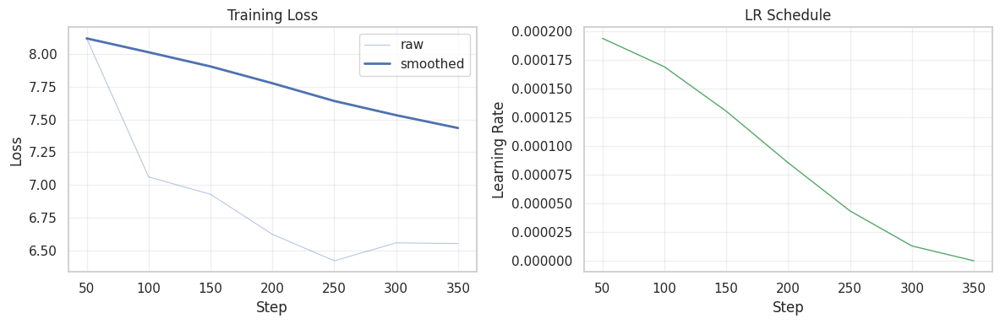


Total training steps: 357
Best checkpoint: None
Final loss: 6.5524
Min loss:   6.4209 (step 250)


In [41]:
# ============================================================
# Training diagnostics: loss curves from trainer_state.json
# ============================================================
import json as _json, os, glob
import matplotlib.pyplot as plt
import numpy as np

LOCAL_DIR  = "/content/florence_lora_adapter"
DRIVE_DIR  = "/content/drive/MyDrive/Too CUA for School/MS4/florence_lora_adapter"

# --- Locate trainer_state.json ---
state_path = None
for base in [LOCAL_DIR, DRIVE_DIR]:
    # Check root
    candidate = os.path.join(base, "trainer_state.json")
    if os.path.isfile(candidate):
        state_path = candidate
        break
    # Check inside checkpoint-* subdirs (pick latest)
    ckpts = sorted(glob.glob(os.path.join(base, "checkpoint-*", "trainer_state.json")))
    if ckpts:
        state_path = ckpts[-1]
        break

assert state_path, (
    f"No trainer_state.json found in {LOCAL_DIR} or {DRIVE_DIR}. "
    "Run training first (§4.1.7.4)."
)
print(f"Loading training logs from: {state_path}")

with open(state_path) as f:
    state = _json.load(f)

log_history = state["log_history"]
print(f"Found {len(log_history)} log entries.")

# --- Extract metrics ---
train_steps, train_loss = [], []
ce_steps, ce_loss = [], []
soft_steps, soft_loss = [], []
l2_steps, l2_loss = [], []
lr_steps, lr_vals = [], []
eval_steps, eval_loss = [], []

for entry in log_history:
    step = entry.get("step", None)
    if step is None:
        continue
    if "loss" in entry:
        train_steps.append(step)
        train_loss.append(entry["loss"])
    if "ce_loss" in entry:
        ce_steps.append(step)
        ce_loss.append(entry["ce_loss"])
    if "soft_ce_loss" in entry:
        soft_steps.append(step)
        soft_loss.append(entry["soft_ce_loss"])
    if "l2_loss" in entry:
        l2_steps.append(step)
        l2_loss.append(entry["l2_loss"])
    if "learning_rate" in entry:
        lr_steps.append(step)
        lr_vals.append(entry["learning_rate"])
    if "eval_loss" in entry:
        eval_steps.append(step)
        eval_loss.append(entry["eval_loss"])

# --- Plot ---
has_components = bool(ce_loss or soft_loss or l2_loss)
has_lr = bool(lr_vals)
n_plots = 1 + int(has_components) + int(has_lr)

fig, axes = plt.subplots(1, n_plots, figsize=(6 * n_plots, 4))
if n_plots == 1:
    axes = [axes]

# Panel 1: Overall training loss
ax = axes[0]
ax.plot(train_steps, train_loss, linewidth=0.8, alpha=0.4, label="raw")
# Smoothed curve (EMA)
if len(train_loss) > 5:
    alpha_ema = 0.1
    smoothed = [train_loss[0]]
    for v in train_loss[1:]:
        smoothed.append(alpha_ema * v + (1 - alpha_ema) * smoothed[-1])
    ax.plot(train_steps, smoothed, linewidth=2, color="C0", label="smoothed")
if eval_steps:
    ax.plot(eval_steps, eval_loss, 'o-', color="C1", markersize=4, label="eval")
ax.set_xlabel("Step")
ax.set_ylabel("Loss")
ax.set_title("Training Loss")
ax.legend()
ax.grid(True, alpha=0.3)

# Panel 2: Component losses (if logged)
pidx = 1
if has_components:
    ax = axes[pidx]; pidx += 1
    if ce_loss:   ax.plot(ce_steps,   ce_loss,   linewidth=1, label="CE")
    if soft_loss: ax.plot(soft_steps,  soft_loss, linewidth=1, label="Gaussian Soft-CE")
    if l2_loss:   ax.plot(l2_steps,    l2_loss,   linewidth=1, label="L2")
    ax.set_xlabel("Step")
    ax.set_ylabel("Loss")
    ax.set_title("Loss Components")
    ax.legend()
    ax.grid(True, alpha=0.3)

# Panel 3: Learning rate schedule
if has_lr:
    ax = axes[pidx]
    ax.plot(lr_steps, lr_vals, linewidth=1, color="C2")
    ax.set_xlabel("Step")
    ax.set_ylabel("Learning Rate")
    ax.set_title("LR Schedule")
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# --- Summary stats ---
print(f"\nTotal training steps: {state.get('global_step', 'N/A')}")
print(f"Best checkpoint: {state.get('best_model_checkpoint', 'N/A')}")
if train_loss:
    print(f"Final loss: {train_loss[-1]:.4f}")
    print(f"Min loss:   {min(train_loss):.4f} (step {train_steps[train_loss.index(min(train_loss))]})")
if eval_loss:
    print(f"Best eval loss: {min(eval_loss):.4f}")

#### 4.1.7.6 Evaluate on held-out test set (20%)

Runs the fine-tuned model on the 20% test split defined in §1.
These rows were never seen during training.

In [46]:
# ============================================================
# Evaluate the fine-tuned model on the 20% held-out test split
# ============================================================
import pandas as pd
from IPython.display import display
from peft import PeftModel

# --- Load fine-tuned adapter if not already in memory ---
DRIVE_ADAPTER = "/content/drive/MyDrive/Too CUA for School/MS4/florence_lora_adapter"
LOCAL_ADAPTER = "/content/florence_lora_adapter"

if "peft_model" not in dir() or peft_model is None:
    adapter_path = LOCAL_ADAPTER if os.path.isdir(LOCAL_ADAPTER) else DRIVE_ADAPTER
    assert os.path.isdir(adapter_path), (
        f"No adapter found at {LOCAL_ADAPTER} or {DRIVE_ADAPTER}. "
        "Run training first (§4.1.7.4) or upload a saved adapter to Drive."
    )
    print(f"Loading LoRA adapter from: {adapter_path}")
    peft_model = PeftModel.from_pretrained(florence_model, adapter_path)
    peft_model.eval()
    print("Adapter loaded.")
else:
    print("Using in-memory peft_model from training.")

# Convert test_eval_items to the format ff.evaluate expects
assert "test_eval_items" in dir(), "Run §4.1.2 first to build test_eval_items."

ft_eval_items = []
for s in test_eval_items:
    ft_eval_items.append({
        "row_idx":    s["source_idx"],
        "width":      s["width"],
        "height":     s["height"],
        "human_text": s["referring_expression"],
        "gt_x":       s["gt_point"][0],
        "gt_y":       s["gt_point"][1],
    })

print(f"Evaluating on {len(ft_eval_items):,} held-out test samples...")

ft_df = ff.evaluate(peft_model, florence_processor, ft_eval_items, ds, max_new_tokens=8)
ft_df.to_csv("/content/florence_lora_test_results.csv", index=False)
print(f"\nSaved: /content/florence_lora_test_results.csv  ({len(ft_df)} rows)")

parse_rate = ft_df["pred_x"].notna().mean() * 100
print(f"FT parse rate: {parse_rate:.1f}%")
print("\nFirst 15 predictions:")
disp = ft_df[["referring_expression", "gt_x", "gt_y",
              "pred_x", "pred_y", "raw_output"]].head(15).copy()
disp["referring_expression"] = disp["referring_expression"].astype(str).str.slice(0, 80)
disp["raw_output"]           = disp["raw_output"].astype(str).str.slice(0, 50)
display(disp)

Using in-memory peft_model from training.
Evaluating on 714 held-out test samples...
[florence-eval 0] gt=(335,545) pred_destd=(286, 529) mode=expectation raw='</s><s><s><s><loc_500><loc_514></s>'
[florence-eval 1] gt=(89,126) pred_destd=(176, 122) mode=expectation raw='</s><s><s><s><loc_83><loc_295></s>'
[florence-eval 2] gt=(175,430) pred_destd=(143, 513) mode=expectation raw='</s><s><s><s><loc_136><loc_441></s>'
[florence] eval done (expectation): 714 samples in 195.8s (0.27s/sample)

Saved: /content/florence_lora_test_results.csv  (714 rows)
FT parse rate: 100.0%

First 15 predictions:


,referring_expression,gt_x,gt_y,pred_x,pred_y,raw_output
0,<image>\nYour task is to help the user identif...,335,545,286,529,</s><s><s><s><loc_500><loc_514></s>
1,<image>\nYour task is to help the user identif...,89,126,176,122,</s><s><s><s><loc_83><loc_295></s>
2,<image>Your task is to help the user identify ...,175,430,143,513,</s><s><s><s><loc_136><loc_441></s>
3,<image>Your task is to help the user identify ...,833,97,835,99,</s><s><s><s><loc_840><loc_272></s>
4,<image>\nYour task is to help the user identif...,405,49,417,52,</s><s><s><s><loc_416><loc_246></s>
5,<image>\nYour task is to help the user identif...,821,65,831,100,</s><s><s><s><loc_826><loc_259></s>
6,<image>\nYour task is to help the user identif...,500,491,503,542,</s><s><s><s><loc_500><loc_493></s>
7,<image>Your task is to help the user identify ...,626,426,376,431,</s><s><s><s><loc_376><loc_458></s>
8,<image>\nYour task is to help the user identif...,295,30,266,36,</s><s><s><s><loc_236><loc_236></s>
9,<image>\nYour task is to help the user identif...,44,928,61,924,</s><s><s><s><loc_42><loc_738></s>


#### 4.1.7.7 Compare: zero-shot vs fine-tuned

In [47]:
# ============================================================
# Same metric battery as §4.1.4 (and matching Qwen cell 61).
# Inputs: ft_df (this section) and the per-sample baseline df from
# /content/florence2_zeroshot_results.csv (saved by §4.1.4 cell 55).
# ============================================================
import numpy as np
import pandas as pd

NAN = float("nan")

def compute_metrics(pred_df):
    n = len(pred_df)
    parsed = pred_df["pred_x"].notna() & pred_df["pred_y"].notna()
    in_bounds = parsed & pred_df["pred_x"].between(0, 999) & pred_df["pred_y"].between(0, 999)
    valid = pred_df[in_bounds].copy()
    m = {"n_total": n, "parse_rate": parsed.mean()*100,
         "in_bounds_rate": in_bounds.mean()*100}

    if len(valid):
        valid["err_norm"] = np.sqrt((valid["pred_x"]-valid["gt_x"])**2 + (valid["pred_y"]-valid["gt_y"])**2)
        pxx = valid["pred_x"]/999.0*valid["width"];  pxy = valid["pred_y"]/999.0*valid["height"]
        gxx = valid["gt_x"]  /999.0*valid["width"];  gxy = valid["gt_y"]  /999.0*valid["height"]
        valid["err_px"] = np.sqrt((pxx-gxx)**2 + (pxy-gxy)**2)
        diag = np.sqrt(valid["width"]**2 + valid["height"]**2)
        valid["err_pct_diag"] = valid["err_px"]/diag*100
        m["mean_err_norm"]=valid["err_norm"].mean();  m["median_err_norm"]=valid["err_norm"].median()
        m["mean_err_px"]=valid["err_px"].mean();      m["median_err_px"]=valid["err_px"].median()
        m["mean_err_pct_diag"]=valid["err_pct_diag"].mean()
        for thr in [5,10,25,50,100,200]: m[f"acc_px_{thr}"] = (valid["err_px"]<=thr).sum()/n*100
        for thr in [1,2,5,10]:           m[f"acc_diag_{thr}"] = (valid["err_pct_diag"]<=thr).sum()/n*100
    else:
        # Degenerate: no usable predictions. Fill so the comparison cell
        # doesn't KeyError.
        for k in ["mean_err_norm","median_err_norm","mean_err_px",
                  "median_err_px","mean_err_pct_diag"]: m[k] = NAN
        for thr in [5,10,25,50,100,200]: m[f"acc_px_{thr}"] = 0.0
        for thr in [1,2,5,10]:           m[f"acc_diag_{thr}"] = 0.0
    return m, valid

# Load baseline (saved by §4.1.4 cell 55).
baseline_df = pd.read_csv("/content/florence2_zeroshot_results.csv")
b_metrics, _ = compute_metrics(baseline_df)
ft_metrics, _ = compute_metrics(ft_df)

def fmt_d(b, f, hib):
    if b!=b or f!=f: return "   n/a"
    d = f-b; arrow = "↑" if (d>0)==hib else ("↓" if d!=0 else "·")
    return f"{d:+7.2f} {arrow}"

def fmt_v(v):
    return "   n/a" if v != v else f"{v:>7.2f}"

print("="*78)
print(f"  Florence-2: ZERO-SHOT (bbox-center)  vs  +LoRA POINT  ({len(ft_df)} eval samples)")
print("="*78)
print(f"\n[Format compliance]")
print(f"{'Metric':<36}{'Baseline':>12}{'FT':>14}{'Δ':>16}")
for k,lab in [("parse_rate","Parse rate (%)"), ("in_bounds_rate","In-bounds rate (%)")]:
    print(f"{lab:<36}{b_metrics[k]:>12.2f}{ft_metrics[k]:>14.2f}   {fmt_d(b_metrics[k], ft_metrics[k], True)}")
print(f"\n[Distance error (lower is better)]")
print(f"{'Metric':<36}{'Baseline':>12}{'FT':>14}{'Δ':>16}")
for k,lab in [("mean_err_norm","Mean err norm (0-999)"),
              ("median_err_norm","Median err norm"),
              ("mean_err_px","Mean err (px)"),
              ("median_err_px","Median err (px)"),
              ("mean_err_pct_diag","Mean err (% diag)")]:
    print(f"{lab:<36} {fmt_v(b_metrics[k]):>11} {fmt_v(ft_metrics[k]):>13}   {fmt_d(b_metrics[k], ft_metrics[k], False)}")
print(f"\n[Accuracy at thresholds (% of all {len(ft_df)})]")
print(f"{'Metric':<36}{'Baseline':>12}{'FT':>14}{'Δ':>16}")
for thr in [5,10,25,50,100,200]:
    k=f"acc_px_{thr}"
    print(f"{'Acc @ '+str(thr)+' px':<36}{b_metrics[k]:>12.2f}{ft_metrics[k]:>14.2f}   {fmt_d(b_metrics[k], ft_metrics[k], True)}")
for thr in [1,2,5,10]:
    k=f"acc_diag_{thr}"
    print(f"{'Acc @ '+str(thr)+'% diag':<36}{b_metrics[k]:>12.2f}{ft_metrics[k]:>14.2f}   {fmt_d(b_metrics[k], ft_metrics[k], True)}")
print("="*78)


  Florence-2: ZERO-SHOT (bbox-center)  vs  +LoRA POINT  (714 eval samples)

[Format compliance]
Metric                                  Baseline            FT               Δ
Parse rate (%)                             62.46        100.00    +37.54 ↑
In-bounds rate (%)                         62.46        100.00    +37.54 ↑

[Distance error (lower is better)]
Metric                                  Baseline            FT               Δ
Mean err norm (0-999)                     487.29         88.04   -399.25 ↑
Median err norm                           497.70         23.00   -474.70 ↑
Mean err (px)                             458.81         96.59   -362.22 ↑
Median err (px)                           433.43         26.04   -407.39 ↑
Mean err (% diag)                          31.19          6.57    -24.62 ↑

[Accuracy at thresholds (% of all 714)]
Metric                                  Baseline            FT               Δ
Acc @ 5 px                                  0.70         13.59   

#### 4.1.7.8 Visualization — GT vs predicted on sample screenshots

Picks 8 random eval samples and draws the original screenshot with the GT point
(green ✕) and the FT-predicted point (red ✕). Useful for sanity-checking that the
model is landing on the actual element, not just close in pixel terms.


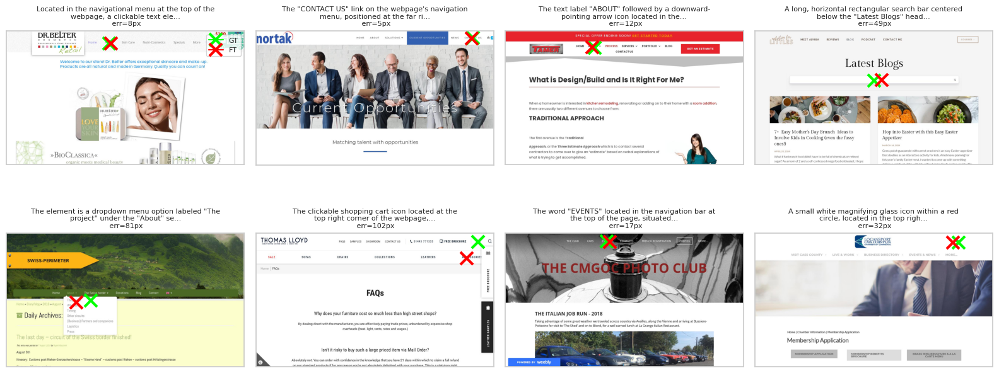

In [48]:
# ============================================================
# Image overlays: GT vs FT predictions on N random eval samples
# ============================================================
import io, re, textwrap
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

N_SHOW = 8
COLS = 4
ROWS = (N_SHOW + COLS - 1) // COLS

def _short_re(text: str, n: int = 80) -> str:
    """Trim the verbose UGround prompt to the actual element description."""
    if not isinstance(text, str): return ""
    cleaned = ff.extract_element_description(text)
    return cleaned[:n] + ("…" if len(cleaned) > n else "")

rng = np.random.RandomState(42)
parsed_df = ft_df[ft_df["pred_x"].notna() & ft_df["pred_y"].notna()]
if len(parsed_df) == 0:
    print("No parseable FT predictions — skipping visualization.")
else:
    pick_idx = rng.choice(len(parsed_df), size=min(N_SHOW, len(parsed_df)), replace=False)
    fig, axes = plt.subplots(ROWS, COLS, figsize=(COLS*4, ROWS*3.6))
    axes = np.array(axes).reshape(-1)

    for ax, idx in zip(axes, pick_idx):
        row = parsed_df.iloc[idx]
        img_field = ds["image"][int(row["row_idx"])]
        if isinstance(img_field, dict) and "bytes" in img_field:
            img = Image.open(io.BytesIO(img_field["bytes"])).convert("RGB")
        elif isinstance(img_field, bytes):
            img = Image.open(io.BytesIO(img_field)).convert("RGB")
        else:
            img = img_field.convert("RGB")
        w, h = row["width"], row["height"]

        gt_px  = (row["gt_x"]/999.0*w,   row["gt_y"]/999.0*h)
        pred_px= (row["pred_x"]/999.0*w, row["pred_y"]/999.0*h)
        err_px = float(np.hypot(gt_px[0]-pred_px[0], gt_px[1]-pred_px[1]))

        ax.imshow(img)
        ax.plot(*gt_px,   marker="x", color="lime",  markersize=14, mew=3, label="GT")
        ax.plot(*pred_px, marker="x", color="red",   markersize=14, mew=3, label="FT")
        title = _short_re(row.get("referring_expression", ""))
        title = "\n".join(textwrap.wrap(title, 50)) if title else ""
        ax.set_title(f"{title}\n err={err_px:.0f}px", fontsize=8)
        ax.set_xticks([]); ax.set_yticks([])

    for ax in axes[len(pick_idx):]:
        ax.axis("off")
    axes[0].legend(loc="upper right", fontsize=8)
    plt.tight_layout()
    plt.show()


In [49]:
# ============================================================
# STEP: Upgrade transformers for Qwen2-VL
# ============================================================
# Florence-2 requires transformers==4.44.2 (loaded above).
# Qwen2-VL requires transformers>=4.45.0.
# Running this cell installs the newer version to disk.
#
# *** AFTER RUNNING THIS CELL: ***
# Runtime → Restart session (or Ctrl+M .) then run ONLY cells
# in section 4b below. Florence-2 weights will be lost, which
# is fine — this notebook is designed to be run in two passes:
#   Pass 1: Run all cells up to and including Section 4a.
#   Pass 2: Run this upgrade cell, restart, then run Section 4b.
#
import subprocess, sys
result = subprocess.run(
    [sys.executable, "-m", "pip", "install", "-q", "transformers>=4.45.0"],
    capture_output=True, text=True
)
print(result.stdout[-500:] if result.stdout else "")
print(result.stderr[-300:] if result.stderr else "")

print()
print("=" * 60)
print("transformers upgrade complete.")
print()
print("ACTION REQUIRED: Restart the Colab runtime now.")
print("  Runtime menu → Restart session  (or Ctrl+M .)")
print()
print("After restart, run ONLY the cells in Section 4b (Qwen2-VL).")
print("Do NOT re-run Section 4a cells — those need transformers==4.44.2.")
print("=" * 60)

# Attempt to auto-restart the runtime (Colab-only)
try:
    import google.colab.runtime
    google.colab.runtime.unassign()
except Exception:
    pass  # Not in Colab or already handled


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.6/10.6 MB 124.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 661.5/661.5 kB 54.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 106.6 MB/s eta 0:00:00



transformers upgrade complete.

ACTION REQUIRED: Restart the Colab runtime now.
  Runtime menu → Restart session  (or Ctrl+M .)

After restart, run ONLY the cells in Section 4b (Qwen2-VL).
Do NOT re-run Section 4a cells — those need transformers==4.44.2.


> ### RESTART REQUIRED BEFORE RUNNING CELLS BELOW
>
> 1. Run the upgrade cell above.
> 2. Restart the Colab runtime: **Runtime → Restart session** (or `Ctrl+M .`).
> 3. After restart, run **only the cells in Section 4b** (cells below this point).
>
> **Do NOT re-run the initial install cell at the top of the notebook** — that
> cell pins `transformers==4.44.2` for Florence-2. Re-running it will downgrade
> your environment and break the Qwen import.
>
> **Why a restart is needed:** `pip install` in a running kernel updates the
> package on disk but cannot replace modules already loaded in Python's memory.
> A kernel restart forces Python to re-import `transformers` from the new version.


### 4.2 Qwen2-VL-2B (2B)

Zero-shot evaluation of Qwen2-VL-2B-Instruct on the UGround grounding task.

### 4.2.1 Model Overview

Qwen2-VL-2B-Instruct is a 2B vision-language model from Alibaba that natively outputs
`(x, y)` coordinates when prompted, making it a natural zero-shot baseline for grounding.
Unlike Florence-2, it requires no task tokens or bounding-box post-processing — the model
is prompted in natural language and directly returns a coordinate pair.

| | **Qwen2-VL-2B** |
|---|---|
| Parameters | 2B |
| Output format | `(x, y)` coordinate pair |
| Prompting style | Chat / instruction |
| Fine-tuning | Zero-shot only (this notebook) |
| transformers version | ≥ 4.45.0 |

In [1]:
# ============================================================
# Install dependencies for Qwen2-VL inference
# ============================================================
# If you are running this cell right after a kernel restart, this will
# install transformers>=4.45.0 (required for Qwen2VLForConditionalGeneration).
# Do NOT re-run the initial install cell above — that would downgrade back
# to transformers==4.44.2 which is incompatible with Qwen2-VL.
import subprocess, sys
subprocess.run([sys.executable, "-m", "pip", "install", "-q",
                "transformers>=4.45.0", "accelerate>=0.34.0", "qwen-vl-utils"],
               check=True)

import importlib.metadata
tv = importlib.metadata.version("transformers")
print(f"transformers {tv} ready for Qwen2-VL")


transformers 5.0.0 ready for Qwen2-VL


In [2]:
# ============================================================
# Load the Qwen2-VL-2B-Instruct model and processor
# ============================================================
# Version guard: Qwen2VLForConditionalGeneration requires transformers>=4.45.0
import importlib.metadata
_tv = importlib.metadata.version("transformers")
from packaging.version import Version
if Version(_tv) < Version("4.45.0"):
    raise RuntimeError(
        f"transformers {_tv} is too old for Qwen2-VL (need >=4.45.0).\n"
        "Run the install cell above, then restart the runtime.\n"
        "Do NOT re-run the initial install cell at the top of the notebook."
    )
print(f"transformers {_tv} — OK")

import torch
from transformers import Qwen2VLForConditionalGeneration, AutoProcessor

# Model identifier on the Hugging Face Hub. The "Instruct" variant is
# instruction-tuned and is what we want for zero-shot prompting (vs. the
# base completion model). 2B refers to ~2 billion parameters - the smallest
# in the Qwen2-VL family, and the exact baseline our paper compares against.
MODEL_ID = "Qwen/Qwen2-VL-2B-Instruct"

# bfloat16 is preferred over float16 for VLMs because it has float32's
# dynamic range, avoiding overflow in attention scores. It cuts memory
# roughly in half vs float32, putting the 2B model at ~4-5 GB of GPU RAM -
# comfortably within a free-tier T4's 15 GB. Fall back to fp16 if the GPU
# (e.g. older Tesla cards) doesn't support bf16, or fp32 on CPU.
if torch.cuda.is_available() and torch.cuda.is_bf16_supported():
    DTYPE = torch.bfloat16
elif torch.cuda.is_available():
    DTYPE = torch.float16
else:
    DTYPE = torch.float32  # CPU fallback - inference will be VERY slow.

# device_map="auto" lets `accelerate` shard the model across available
# devices. On a single GPU it just goes to cuda:0; on CPU-only it stays
# on CPU. This is the recommended pattern for VLMs.
DEVICE_MAP = "auto" if torch.cuda.is_available() else None

print(f"Loading {MODEL_ID}...")
print(f"  dtype     : {DTYPE}")
print(f"  device_map: {DEVICE_MAP}")
print(f"  CUDA avail: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"  GPU name  : {torch.cuda.get_device_name(0)}")
    print(f"  GPU mem   : {torch.cuda.get_device_properties(0).total_memory/1e9:.1f} GB")

# Download (~4-5 GB on first run) and load weights. Subsequent runs use
# the local cache at ~/.cache/huggingface/hub.
model = Qwen2VLForConditionalGeneration.from_pretrained(
    MODEL_ID,
    torch_dtype=DTYPE,
    device_map=DEVICE_MAP,
)
model.eval()  # Disable dropout etc. - inference only.

# The processor wraps both the image preprocessor and the tokenizer, and
# also applies Qwen2-VL's chat template (which inserts the right
# <|vision_start|>, <|image_pad|>, <|im_start|> etc. special tokens).
processor = AutoProcessor.from_pretrained(MODEL_ID)

n_params = sum(p.numel() for p in model.parameters())
print(f"\n✓ Model loaded. Parameter count: {n_params/1e9:.2f}B")


transformers 5.0.0 — OK
Loading Qwen/Qwen2-VL-2B-Instruct...
  dtype     : torch.bfloat16
  device_map: auto
  CUDA avail: True
  GPU name  : NVIDIA A100-SXM4-40GB
  GPU mem   : 42.4 GB


config.json: 0.00B [00:00, ?B/s]

model.safetensors.index.json: 0.00B [00:00, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/729 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/272 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/347 [00:00<?, ?B/s]

chat_template.json: 0.00B [00:00, ?B/s]

The image processor of type `Qwen2VLImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]


✓ Model loaded. Parameter count: 2.21B


In [3]:
# ============================================================
# Helper functions: prompt building, output parsing, image decoding
# ============================================================
import re
import io
from PIL import Image

# Regex that captures the FIRST (x, y) integer pair anywhere in a string.
# Matches things like "(123, 456)", "( 999,1)", "(0,0)". We allow the
# optional leading minus so that out-of-bounds negative outputs get
# parsed (and then flagged) instead of silently dropped.
_COORD_RE = re.compile(r"\(\s*(-?\d+)\s*,\s*(-?\d+)\s*\)")

def parse_coordinates(text: str):
    """
    Extract the first (x, y) coordinate pair from a model output string.

    The base Qwen2-VL model often emits verbose answers like
        "The search box is located at approximately (450, 120)."
    so we cannot assume the entire output is just coordinates - we have
    to *search* for the pattern.

    Returns (x, y) as ints, or None if no pair was found.
    """
    if not text:
        return None
    m = _COORD_RE.search(text)
    return (int(m.group(1)), int(m.group(2))) if m else None


def decode_image(img_field):
    """
    Convert the dataset's `image` field into a PIL.Image in RGB mode.

    Depending on how the parquet was written / how `datasets` decoded it,
    `image` can be one of three things, so we handle all three. Qwen2-VL
    needs 3-channel RGB input; some screenshots are RGBA or palette mode,
    so we convert.
    """
    if isinstance(img_field, Image.Image):
        img = img_field
    elif isinstance(img_field, bytes):
        img = Image.open(io.BytesIO(img_field))
    elif isinstance(img_field, dict) and "bytes" in img_field:
        img = Image.open(io.BytesIO(img_field["bytes"]))
    else:
        raise ValueError(f"Unsupported image field type: {type(img_field)}")
    return img.convert("RGB") if img.mode != "RGB" else img


# Short system prompt nudging the *base* (non-fine-tuned) model toward
# the (x,y) format the UGround dataset uses. Without it, base Qwen2-VL
# tends to either describe the location in prose or emit its own native
# bounding-box format - both would tank our format-compliance rate and
# under-represent what the model actually "knows" about UI layout.
# Set this to None for a stricter "raw" baseline (no system prompt).
SYSTEM_PROMPT = (
    "You are a GUI grounding assistant. When asked to locate a UI element "
    "in a screenshot, respond with ONLY the (x, y) coordinates of the "
    "element's center in the format (x, y), where x and y are integers in "
    "the range [0, 999] with (0, 0) at the top-left corner and (999, 999) "
    "at the bottom-right corner of the image. Do not include any other text."
)


def build_messages(image: Image.Image, human_text: str):
    """
    Build the chat-format message list Qwen2-VL expects.

    Qwen2-VL uses the OpenAI-style chat schema, but each message's
    `content` is a list of typed parts (`image`, `text`) rather than a
    single string. We strip the dataset's literal "<image>" placeholder
    from the human prompt because we're providing the image as a
    structured part - leaving it in causes Qwen2-VL to look for two
    images and error out.
    """
    cleaned_text = human_text.replace("<image>", "").strip()

    messages = []
    if SYSTEM_PROMPT:
        messages.append({"role": "system", "content": SYSTEM_PROMPT})
    messages.append({
        "role": "user",
        "content": [
            {"type": "image", "image": image},
            {"type": "text",  "text": cleaned_text},
        ],
    })
    return messages

In [4]:
# ============================================================
# Build the evaluation set: same 20% held-out test split as Florence
# ============================================================
# This cell replaces the previous "500 random rows" eval set with the
# proper held-out 20% test split that Florence-2 was evaluated on (§1
# of this notebook). Using the same eval set across models is essential
# for an apples-to-apples comparison: any metric difference between
# Florence and Qwen is attributable to the model, not the eval data.
#
# The cell handles two practical issues:
#   1. After the runtime restart for Qwen2-VL, `train_indices` and
#      `test_indices` from §1's split are no longer in memory. We
#      regenerate them deterministically with the same SPLIT_SEED so
#      they match Florence's run bit-for-bit.
#   2. If `ds` was also lost on restart, we reload it from the parquet
#      files on Drive.
import os
import json
import numpy as np

# Reload `ds` if it's gone (e.g. fresh kernel after a session timeout).
if "ds" not in dir() or ds is None:
    if not os.path.exists("/content/drive/MyDrive"):
        from google.colab import drive
        drive.mount("/content/drive")
    import glob as _glob
    from datasets import load_dataset
    EXTRACT_DIR = "/content/drive/MyDrive/Too CUA for School/MS4/jonathanliuground-v1-subsample"
    _pq = [f for f in _glob.glob(f"{EXTRACT_DIR}/**/*.parquet", recursive=True)
           if os.path.getsize(f) > 0]
    if not _pq:
        raise FileNotFoundError(
            "No parquet files found at " + EXTRACT_DIR +
            ". Run Section 1 (Data Loading) first."
        )
    print(f"Reloading ds from {len(_pq)} parquet files...")
    ds = load_dataset("parquet", data_files=_pq, split="train")
    print(f"  ds ready: {len(ds):,} rows")


# Reproduce the 80/20 split from §1 deterministically. Same SPLIT_SEED
# = 42 means we get the EXACT same row partitioning Florence used, so
# the held-out test set is identical across the two models.
SPLIT_SEED    = 42
TEST_FRACTION = 0.20

_all_indices = np.arange(len(ds))
_rng         = np.random.RandomState(SPLIT_SEED)
_rng.shuffle(_all_indices)
_split_point  = int(len(_all_indices) * (1 - TEST_FRACTION))
train_indices = set(_all_indices[:_split_point].tolist())
test_indices  = set(_all_indices[_split_point:].tolist())

print(f"Reproduced 80/20 split (SPLIT_SEED={SPLIT_SEED}):")
print(f"  train rows: {len(train_indices):,}")
print(f"  test rows : {len(test_indices):,}")


# Cap on eval items — leave at None to use the FULL held-out test split
# (matches Florence). For a quick smoke test of the downstream inference
# loop, set this to a small integer like 100.
MAX_EVAL_SAMPLES  = None
MAX_PAIRS_PER_ROW = 1   # one pair per screenshot — same policy as Florence


def build_eval_items_from_test_indices(dataset, indices_set,
                                       max_pairs=1, cap=None):
    """
    For each row in `indices_set` (sorted for determinism), take the
    first `max_pairs` valid (human, gpt) pair(s) and emit one eval item
    per pair. Returns a list with the schema the downstream cells
    expect: row_idx, pair_idx, image (decoded PIL), width, height,
    human_text, gt_x, gt_y.

    NOTE on memory: this eagerly decodes PIL images into the items list
    so the inference loop downstream can use them directly. For ~700
    items at typical resolutions this is ~1-2 GB. If the test set is
    very large (>5K items) and you hit OOM, switch to lazy decoding
    by removing the `image` field here and decoding inside the
    inference loop instead.
    """
    items = []
    for ri in sorted(indices_set):
        if cap is not None and len(items) >= cap:
            break
        ri = int(ri)

        # Defensive parse — bad rows shouldn't crash the build.
        try:
            convos_raw = dataset["conversations"][ri]
            convos = json.loads(convos_raw) if isinstance(convos_raw, str) else convos_raw
        except (json.JSONDecodeError, TypeError):
            continue

        image = None  # decoded lazily after we confirm a valid pair exists
        pair_count = 0

        for pi in range(0, len(convos) - 1, 2):
            if pair_count >= max_pairs:
                break
            human_turn = convos[pi]
            gpt_turn   = convos[pi + 1]
            if human_turn.get("from") != "human" or gpt_turn.get("from") != "gpt":
                continue

            gt = parse_coordinates(gpt_turn.get("value", ""))
            if gt is None:
                continue  # GT itself doesn't parse — rare, skip

            if image is None:
                try:
                    image = decode_image(dataset[ri]["image"])
                except Exception:
                    break  # bad image — skip this whole row

            items.append({
                "row_idx":    ri,
                "pair_idx":   pi // 2,
                "image":      image,
                "width":      dataset["width"][ri],
                "height":     dataset["height"][ri],
                "human_text": human_turn.get("value", ""),
                "gt_x":       gt[0],
                "gt_y":       gt[1],
            })
            pair_count += 1
            if cap is not None and len(items) >= cap:
                return items
    return items


eval_items = build_eval_items_from_test_indices(
    ds, test_indices,
    max_pairs=MAX_PAIRS_PER_ROW,
    cap=MAX_EVAL_SAMPLES,
)
# Alias used by the LoRA fine-tune section (§4.2.5+) so it picks up the
# same eval set without rebuilding.
test_eval_items = eval_items

print(f"\nBuilt eval_items: {len(eval_items):,} items "
      f"(from {len(set(it['row_idx'] for it in eval_items)):,} unique screenshots)")
print(f"Drawn from the {len(test_indices):,}-row held-out test split — "
      f"same set used to evaluate Florence-2.")

Mounted at /content/drive
Reloading ds from 13 parquet files...


Generating train split: 0 examples [00:00, ? examples/s]

  ds ready: 3,570 rows
Reproduced 80/20 split (SPLIT_SEED=42):
  train rows: 2,856
  test rows : 714

Built eval_items: 714 items (from 714 unique screenshots)
Drawn from the 714-row held-out test split — same set used to evaluate Florence-2.


### 4.2.2 Zero-Shot Inference

In [5]:
# ============================================================
# Run the inference loop (Qwen2-VL forward pass on every eval item)
# ============================================================
import time
from tqdm.auto import tqdm
from qwen_vl_utils import process_vision_info

# Generation hyperparameters. We want short, deterministic outputs since
# the answer is just "(x, y)". Greedy decoding (do_sample=False) gives
# reproducible results - critical for a baseline number that future
# experiments will be compared against.
MAX_NEW_TOKENS = 32      # "(999, 999)" is ~9 tokens; 32 is safe headroom.
DO_SAMPLE      = False   # Greedy - deterministic.

results = []                   # One dict per eval item, populated below.
start_time = time.time()       # For throughput reporting.

# torch.inference_mode() is slightly faster than torch.no_grad() and also
# disables view tracking. Safe here because we never backprop.
with torch.inference_mode():
    for item in tqdm(eval_items, desc="Qwen2-VL inference"):
        try:
            # 1. Build chat-formatted messages.
            messages = build_messages(item["image"], item["human_text"])

            # 2. Apply the chat template -> single string with all the
            #    right special tokens. add_generation_prompt=True appends
            #    the assistant header so the model knows it's its turn.
            prompt_text = processor.apply_chat_template(
                messages, tokenize=False, add_generation_prompt=True,
            )

            # 3. process_vision_info extracts image / video inputs from
            #    the structured messages list. It's the official Qwen
            #    helper that handles resizing to the patch grid correctly.
            image_inputs, video_inputs = process_vision_info(messages)

            # 4. Tokenize text + preprocess image into model-ready tensors.
            #    The processor returns input_ids, attention_mask,
            #    pixel_values, and image_grid_thw (shape info Qwen2-VL
            #    needs to reconstruct the 2D image layout from flat tokens).
            inputs = processor(
                text=[prompt_text],
                images=image_inputs,
                videos=video_inputs,
                return_tensors="pt",
                padding=True,
            ).to(model.device)

            # 5. Generate. The model returns the full sequence (prompt +
            #    completion), so we slice off the prompt to keep only the
            #    new generated tokens.
            generated_ids = model.generate(
                **inputs,
                max_new_tokens=MAX_NEW_TOKENS,
                do_sample=DO_SAMPLE,
            )
            new_tokens = generated_ids[:, inputs.input_ids.shape[1]:]
            output_text = processor.batch_decode(
                new_tokens,
                skip_special_tokens=True,
                clean_up_tokenization_spaces=False,
            )[0].strip()

            # 6. Pull (x, y) out of whatever the model said.
            pred = parse_coordinates(output_text)

        except Exception as e:
            # One bad sample shouldn't kill an hour-long run. Log it as
            # an error and continue; it'll show up in metrics as a parse
            # failure (i.e. counted as wrong).
            output_text = f"[ERROR: {type(e).__name__}: {e}]"
            pred = None

        results.append({
            "row_idx":    item["row_idx"],
            "pair_idx":   item["pair_idx"],
            "width":      item["width"],
            "height":     item["height"],
            "gt_x":       item["gt_x"],
            "gt_y":       item["gt_y"],
            "raw_output": output_text,
            "pred_x":     pred[0] if pred else None,
            "pred_y":     pred[1] if pred else None,
        })

elapsed = time.time() - start_time
n = max(len(results), 1)
print(f"\n✓ Done. {len(results):,} samples in {elapsed:.1f}s "
      f"({elapsed/n:.2f}s per sample, {n/elapsed*60:.1f} samples/min)")

Qwen2-VL inference:   0%|          | 0/714 [00:00<?, ?it/s]

The following generation flags are not valid and may be ignored: ['temperature', 'top_p', 'top_k']. Set `TRANSFORMERS_VERBOSITY=info` for more details.



✓ Done. 714 samples in 414.2s (0.58s per sample, 103.4 samples/min)


### 4.2.3 Metrics & Results

In [6]:
# ============================================================
# Compute and report performance metrics
# ============================================================
import numpy as np
import pandas as pd

# Convert results into a DataFrame for easy slicing/aggregation.
df = pd.DataFrame(results)

# ---------- Format compliance ----------
# A prediction "parsed" if we got back a (x, y) tuple at all - regardless
# of whether it's in bounds or correct. This is the most basic check of
# whether the model is even speaking the right *language* (vs. answering
# in prose or its own native bbox format).
df["parsed"] = df["pred_x"].notna() & df["pred_y"].notna()
parse_rate = df["parsed"].mean() * 100

# Of the parsed ones, are they actually within [0, 999]? Out-of-bounds
# usually means the model output absolute pixel coordinates instead of
# normalized ones - a very common failure mode for the BASE Qwen2-VL on
# UGround prompts (it has its own native coord system).
in_bounds_mask = (
    df["parsed"]
    & df["pred_x"].between(0, 999)
    & df["pred_y"].between(0, 999)
)
oob_count = (df["parsed"] & ~in_bounds_mask).sum()
oob_rate  = oob_count / max(df["parsed"].sum(), 1) * 100

# ---------- Distance errors (only on parsed-and-in-bounds preds) ----------
# Two error spaces are useful:
#   1. Normalized [0, 999]  - directly comparable across image sizes.
#   2. Original pixels       - intuitive ("the prediction was 47px off").
valid = df[in_bounds_mask].copy()
if len(valid) > 0:
    # Normalized Euclidean distance.
    valid["err_norm"] = np.sqrt(
        (valid["pred_x"] - valid["gt_x"]) ** 2
        + (valid["pred_y"] - valid["gt_y"]) ** 2
    )
    # Per-axis abs error (normalized) - shows X vs Y bias if any.
    valid["err_norm_x"] = (valid["pred_x"] - valid["gt_x"]).abs()
    valid["err_norm_y"] = (valid["pred_y"] - valid["gt_y"]).abs()

    # Pixel-space error: scale each prediction by its OWN image dims,
    # since the dataset has many different resolutions.
    pred_px_x = valid["pred_x"] / 999.0 * valid["width"]
    pred_px_y = valid["pred_y"] / 999.0 * valid["height"]
    gt_px_x   = valid["gt_x"]   / 999.0 * valid["width"]
    gt_px_y   = valid["gt_y"]   / 999.0 * valid["height"]
    valid["err_px"] = np.sqrt(
        (pred_px_x - gt_px_x) ** 2 + (pred_px_y - gt_px_y) ** 2
    )

    # Image diagonal is the natural unit for a *relative* threshold
    # (a 50-pixel error means very different things on a 1080p
    # screenshot vs a 4K one).
    img_diag = np.sqrt(valid["width"] ** 2 + valid["height"] ** 2)
    valid["err_pct_diag"] = valid["err_px"] / img_diag * 100


# ---------- Accuracy at thresholds ----------
# Standard ScreenSpot / UGround grounding metric: a prediction "hits" if
# its predicted point is within X pixels (or X% of diagonal) of the GT
# point. We report several thresholds to give the full curve, not a
# single cherry-picked number.
n_total = len(df)  # IMPORTANT: denominator is total samples - a
                   # prediction that didn't parse counts as wrong.

def acc_at(col, threshold):
    """Fraction of ALL eval samples (n_total) where col <= threshold."""
    if len(valid) == 0:
        return 0.0
    return (valid[col] <= threshold).sum() / n_total * 100


# ---------- Pretty-print the report ----------
print("=" * 72)
print(f"  Qwen2-VL-2B-Instruct - Zero-shot baseline on UGround training data")
print(f"  Eval size: {n_total:,} samples | "
      f"system prompt: {'on' if SYSTEM_PROMPT else 'off'} | greedy decoding")
print("=" * 72)

print(f"\n[Format compliance]")
print(f"  Parse rate (output looks like (x,y))      : {parse_rate:6.2f}%")
print(f"  Out-of-bounds rate (of parsed)            : {oob_rate:6.2f}%   "
      f"({int(oob_count)} samples)")
print(f"  Usable predictions (parsed + in bounds)   : {len(valid):>6} / {n_total} "
      f"({len(valid)/max(n_total,1)*100:.2f}%)")

if len(valid) > 0:
    print(f"\n[Distance error - normalized space (0-999)]")
    print(f"  Mean Euclidean error                       : {valid['err_norm'].mean():6.1f}")
    print(f"  Median Euclidean error                     : {valid['err_norm'].median():6.1f}")
    print(f"  Mean |dx|                                  : {valid['err_norm_x'].mean():6.1f}")
    print(f"  Mean |dy|                                  : {valid['err_norm_y'].mean():6.1f}")

    print(f"\n[Distance error - original pixel space]")
    print(f"  Mean pixel error                           : {valid['err_px'].mean():6.1f} px")
    print(f"  Median pixel error                         : {valid['err_px'].median():6.1f} px")
    print(f"  Mean error / image diagonal                : {valid['err_pct_diag'].mean():6.2f}%")

    print(f"\n[Accuracy @ pixel thresholds (% of all {n_total} samples)]")
    for thr in [5, 10, 25, 50, 100, 200]:
        print(f"  Acc @ {thr:>3} px                              : {acc_at('err_px', thr):6.2f}%")

    print(f"\n[Accuracy @ normalized thresholds (% of all {n_total} samples)]")
    for thr in [10, 25, 50, 100, 200]:
        print(f"  Acc @ {thr:>3} (normalized units)              : {acc_at('err_norm', thr):6.2f}%")

    print(f"\n[Accuracy @ relative thresholds (% of image diagonal)]")
    for thr in [1, 2, 5, 10]:
        print(f"  Acc @ {thr:>2}% of image diagonal              : {acc_at('err_pct_diag', thr):6.2f}%")

print("\n" + "=" * 72)

# Persist per-sample results for later analysis (e.g. compare against the
# fine-tuned Florence-2 once that's trained, error inspection, etc.).
results_path = "/content/qwen2vl_2b_baseline_results.csv"
df.to_csv(results_path, index=False)
print(f"\nFull per-sample results saved to: {results_path}")

  Qwen2-VL-2B-Instruct - Zero-shot baseline on UGround training data
  Eval size: 714 samples | system prompt: on | greedy decoding

[Format compliance]
  Parse rate (output looks like (x,y))      :  89.92%
  Out-of-bounds rate (of parsed)            :   0.00%   (0 samples)
  Usable predictions (parsed + in bounds)   :    642 / 714 (89.92%)

[Distance error - normalized space (0-999)]
  Mean Euclidean error                       :  167.0
  Median Euclidean error                     :  106.1
  Mean |dx|                                  :  104.5
  Mean |dy|                                  :  101.8

[Distance error - original pixel space]
  Mean pixel error                           :  170.1 px
  Median pixel error                         :  108.4 px
  Mean error / image diagonal                :  11.60%

[Accuracy @ pixel thresholds (% of all 714 samples)]
  Acc @   5 px                              :   0.28%
  Acc @  10 px                              :   0.42%
  Acc @  25 px          

### 4.2.4 Visualizations

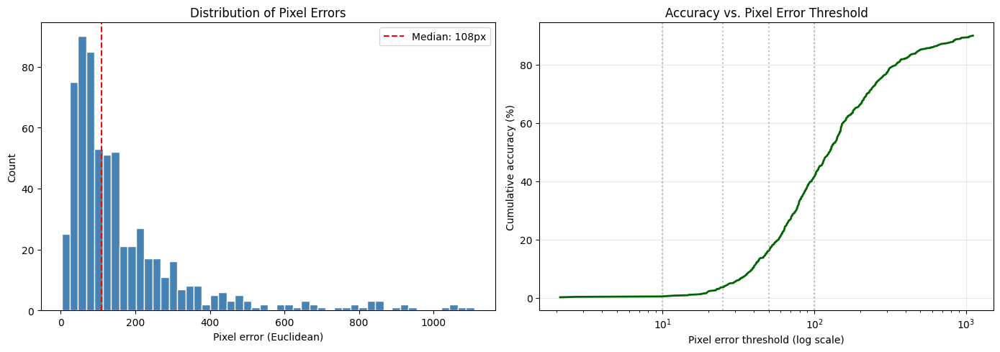

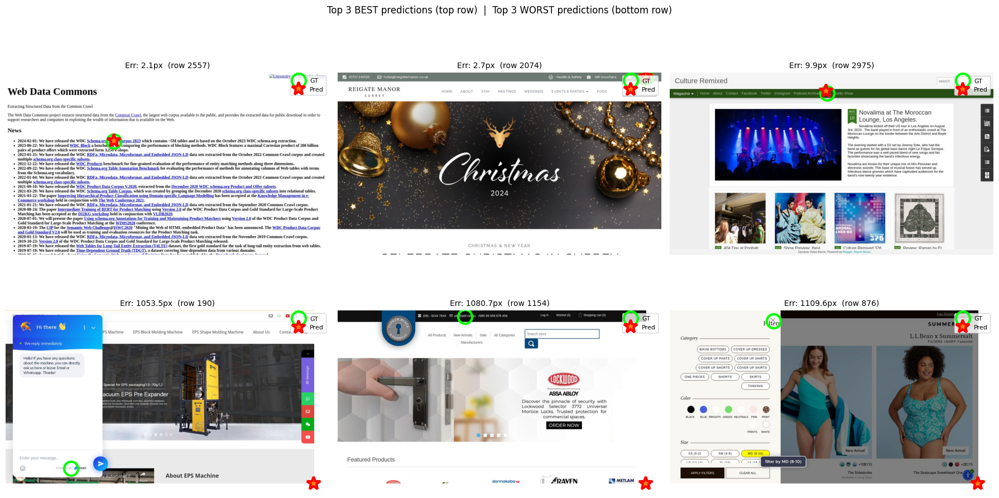


[Sample raw outputs for inspection]
------------------------------------------------------------------------
[BAD] GT=(479, 119)  raw_output='(450, 70, 550, 100)'
[OK ] GT=(254, 310)  raw_output='(490, 266)'
[OK ] GT=(500, 689)  raw_output='(200, 580)'
[BAD] GT=(566, 77)  raw_output='(819, 20, 850, 46)'
[OK ] GT=(968, 62)  raw_output='(980, 100)'


In [7]:
# ============================================================
# Visualize: error distribution + qualitative best/worst examples
# ============================================================
import matplotlib.pyplot as plt

if len(valid) > 0:
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Histogram of pixel errors. The shape tells us a lot:
    #   - Sharp left peak with thin tail = "mostly close, occasional miss" (good)
    #   - Flat / right-shifted distribution = "uniformly bad" (the model
    #     isn't really doing grounding, just guessing).
    axes[0].hist(valid["err_px"], bins=50, color="steelblue", edgecolor="white")
    axes[0].axvline(valid["err_px"].median(), color="red", linestyle="--",
                    label=f"Median: {valid['err_px'].median():.0f}px")
    axes[0].set_xlabel("Pixel error (Euclidean)")
    axes[0].set_ylabel("Count")
    axes[0].set_title("Distribution of Pixel Errors")
    axes[0].legend()

    # Cumulative accuracy curve - one of the most useful single-plot
    # summaries of grounding quality. The steeper the early rise, the
    # more often the model nails it within a few pixels. Log x-axis
    # because errors span several orders of magnitude.
    sorted_err = np.sort(valid["err_px"].values)
    cum_acc = np.arange(1, len(sorted_err) + 1) / n_total * 100
    axes[1].plot(sorted_err, cum_acc, color="darkgreen", linewidth=2)
    axes[1].set_xscale("log")
    axes[1].set_xlabel("Pixel error threshold (log scale)")
    axes[1].set_ylabel("Cumulative accuracy (%)")
    axes[1].set_title("Accuracy vs. Pixel Error Threshold")
    axes[1].grid(True, alpha=0.3)
    # Mark common threshold values for quick visual reference.
    for thr in [10, 25, 50, 100]:
        axes[1].axvline(thr, color="gray", linestyle=":", alpha=0.5)

    plt.tight_layout()
    plt.show()


# Show a handful of qualitative examples - 3 best + 3 worst by pixel
# error. This is invaluable for understanding what the model is doing
# well vs poorly (e.g. "always nails buttons but misses tiny icons").
if len(valid) >= 6:
    valid_sorted = valid.sort_values("err_px")
    examples = pd.concat([valid_sorted.head(3), valid_sorted.tail(3)])

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()

    for ax, (_, row) in zip(axes, examples.iterrows()):
        # We didn't keep the PIL image in `results` (would have eaten RAM),
        # so re-decode it from `ds` using the row index we tracked.
        ds_row = ds[int(row["row_idx"])]
        img = decode_image(ds_row["image"])
        ax.imshow(img)

        # Convert normalized [0, 999] coords back to pixels for plotting
        # on top of the original-resolution image.
        gt_px_x = row["gt_x"]   / 999.0 * row["width"]
        gt_px_y = row["gt_y"]   / 999.0 * row["height"]
        pr_px_x = row["pred_x"] / 999.0 * row["width"]
        pr_px_y = row["pred_y"] / 999.0 * row["height"]

        # Open green circle = ground truth; red X = prediction.
        ax.plot(gt_px_x, gt_px_y, "o",
                markersize=18, markerfacecolor="none",
                markeredgecolor="lime", markeredgewidth=3, label="GT")
        ax.plot(pr_px_x, pr_px_y, "*",
                markersize=18, markeredgecolor="red", markeredgewidth=3,
                label="Pred")
        ax.set_title(f"Err: {row['err_px']:.1f}px  (row {int(row['row_idx'])})",
                     fontsize=10)
        ax.legend(loc="upper right", fontsize=8)
        ax.axis("off")

    plt.suptitle("Top 3 BEST predictions (top row)  |  "
                 "Top 3 WORST predictions (bottom row)",
                 fontsize=12)
    plt.tight_layout()
    plt.show()


# Print a few raw model outputs so we can see HOW the model is failing
# when it fails - especially useful for diagnosing format issues.
print("\n[Sample raw outputs for inspection]")
print("-" * 72)
for _, row in df.sample(min(5, len(df)), random_state=0).iterrows():
    in_bounds = (pd.notna(row["pred_x"])
                 and 0 <= row["pred_x"] <= 999
                 and 0 <= row["pred_y"] <= 999)
    status = "OK " if in_bounds else "BAD"
    print(f"[{status}] GT=({row['gt_x']}, {row['gt_y']})  "
          f"raw_output={row['raw_output']!r}")

### 4.2.5 LoRA Fine-Tune (Cross-Entropy)

This section LoRA-fine-tunes Qwen2-VL-2B on the same 80% training split that
Section 1 produced, then re-evaluates on the same 20% held-out test split that
Florence-2 (§4.1.7.6) used. Identical splits across models means any
performance delta is attributable to architecture and training, not to
dataset variation.

**Why LoRA?** Full fine-tuning of a 2B-parameter model is infeasible on
consumer GPUs because the gradients and optimizer state alone exceed 40 GB.
LoRA freezes the base weights and trains only small low-rank decompositions
of the attention projections, reducing the trainable parameter count to
roughly 0.2% of the base model. With $r=16$, this fits comfortably on a
free-tier T4 and trains in well under an hour on an A100 at this dataset scale (~3K training items after the 80/20 split, down from ~43K when training on the whole dataset).

**Loss function.** Token-level cross-entropy on the assistant-turn tokens
only (the `(x, y)` answer string). System-prompt and user-turn token
positions are masked to `-100` so the model is not penalized for failing to
reproduce the prompt.

**Persistence.** Checkpoints are written every 1{,}000 optimizer steps to
local disk for speed and asynchronously mirrored to Google Drive via a
background callback, so training survives Colab session timeouts. After
training completes, the full per-step loss history (from
`trainer_state.json`) is also saved to Drive so the training curve can be
re-plotted in any future session without re-running the 12-hour fine-tune.

In [8]:
# ============================================================
# Reproduce the 80/20 train/test split from §1
# ============================================================
# After the runtime restart for Qwen2-VL, all the train_indices /
# test_indices variables from §1 (cell 12) are gone from memory. We
# regenerate them deterministically here by re-running the same logic
# with the same seed (SPLIT_SEED = 42), so this section's training and
# eval data are byte-for-byte identical to what Florence-2 used.
import numpy as np

SPLIT_SEED = 42
TEST_FRACTION = 0.20

all_indices = np.arange(len(ds))
rng = np.random.RandomState(SPLIT_SEED)
rng.shuffle(all_indices)

split_point   = int(len(all_indices) * (1 - TEST_FRACTION))
train_indices = set(all_indices[:split_point].tolist())
test_indices  = set(all_indices[split_point:].tolist())

print(f"Reproduced 80/20 split:")
print(f"  train rows : {len(train_indices):,}")
print(f"  test rows  : {len(test_indices):,}")
print(f"  total rows : {len(ds):,}")
print(f"  seed       : {SPLIT_SEED}  (matches §1 / Florence)")

Reproduced 80/20 split:
  train rows : 2,856
  test rows  : 714
  total rows : 3,570
  seed       : 42  (matches §1 / Florence)


In [9]:
# ============================================================
# Build Qwen-format eval items from the 20% test split
# ============================================================
# Florence's `test_eval_items` (cell 52) was built before the restart and
# is no longer in memory; we rebuild here with the schema this section's
# inference loop expects (gt_x/gt_y rather than gt_point tuple). Same
# rows, just reformatted.
#
# We override the previously-built `eval_items` (from cell 85, which used
# a Qwen-specific 500-random-row sample) so all subsequent cells in this
# section use the proper held-out test split.
import json

def build_eval_items_from_test_indices(dataset, indices_set, max_pairs=1):
    """
    For each row in `indices_set`, take the first valid (human, gpt) pair
    and emit one eval item per row. Returns a list with the same schema
    as Section 4.2's `eval_items` (row_idx, pair_idx, image, width,
    height, human_text, gt_x, gt_y).
    """
    items = []
    for ri in sorted(indices_set):
        ri = int(ri)
        try:
            convos_raw = dataset["conversations"][ri]
            convos = json.loads(convos_raw) if isinstance(convos_raw, str) else convos_raw
        except (json.JSONDecodeError, TypeError):
            continue

        image = None
        pair_count = 0
        for pi in range(0, len(convos) - 1, 2):
            if pair_count >= max_pairs:
                break
            h, g = convos[pi], convos[pi + 1]
            if h.get("from") != "human" or g.get("from") != "gpt":
                continue
            gt = parse_coordinates(g.get("value", ""))
            if gt is None:
                continue
            if image is None:
                try:
                    image = decode_image(dataset[ri]["image"])
                except Exception:
                    break
            items.append({
                "row_idx":    ri,
                "pair_idx":   pi // 2,
                "image":      image,
                "width":      dataset["width"][ri],
                "height":     dataset["height"][ri],
                "human_text": h.get("value", ""),
                "gt_x":       gt[0],
                "gt_y":       gt[1],
            })
            pair_count += 1
    return items


# Override: use the 20% held-out split for Qwen evaluation, matching
# Florence's `test_eval_items`. This replaces the 500-random-row eval set
# from cell 85.
test_eval_items = build_eval_items_from_test_indices(ds, test_indices, max_pairs=1)
eval_items = test_eval_items  # alias used by the rest of the section

print(f"Built test_eval_items: {len(test_eval_items):,} items "
      f"(from {len(set(it['row_idx'] for it in test_eval_items)):,} unique screenshots)")
print(f"Same 20% test split that Florence used.")

Built test_eval_items: 714 items (from 714 unique screenshots)
Same 20% test split that Florence used.


In [10]:
# ============================================================
# Build Qwen-format training items from the 80% train split
# ============================================================
# Same schema (row_idx, width, height, human_text, gt_x, gt_y) but
# without the `image` field — the training Dataset class decodes images
# lazily per __getitem__ to keep RAM flat across the ~43k samples.
import random

# Default: use every row in the 80% train split. For a smoke test, set
# this to a small integer like 2000 to verify the whole pipeline in
# ~30 minutes before committing to the 12-hour run.
MAX_TRAIN_SAMPLES = None


def build_qwen_training_items(dataset, included_rows, cap=None, seed=456):
    """
    Walk the rows in `included_rows` (in shuffled order) and return one
    (description, point) tuple per row in Qwen format. Image bytes are
    NOT decoded here; the Dataset class decodes lazily.
    """
    rng = random.Random(seed)
    indices = sorted(included_rows)
    rng.shuffle(indices)

    convos_col  = dataset["conversations"]
    widths_col  = dataset["width"]
    heights_col = dataset["height"]

    items = []
    for ri in indices:
        if cap is not None and len(items) >= cap:
            break
        try:
            convos = json.loads(convos_col[ri])
        except (json.JSONDecodeError, TypeError):
            continue
        for pi in range(0, len(convos) - 1, 2):
            h, g = convos[pi], convos[pi + 1]
            if h.get("from") != "human" or g.get("from") != "gpt":
                continue
            gt = parse_coordinates(g.get("value", ""))
            if gt is None:
                continue
            items.append({
                "row_idx":    ri,
                "width":      widths_col[ri],
                "height":     heights_col[ri],
                "human_text": h.get("value", ""),
                "gt_x":       gt[0],
                "gt_y":       gt[1],
            })
            break  # one pair per row
    return items


train_items = build_qwen_training_items(ds, train_indices, cap=MAX_TRAIN_SAMPLES)

# Sanity check: training and eval rows must not overlap.
train_row_set = set(it["row_idx"] for it in train_items)
test_row_set  = set(it["row_idx"] for it in test_eval_items)
overlap = train_row_set & test_row_set
assert not overlap, f"Train/test overlap: {len(overlap)} rows!"

print(f"train_items: {len(train_items):,}  (from {len(train_indices):,} train rows)")
print(f"test_eval_items: {len(test_eval_items):,}  (from {len(test_indices):,} test rows)")
print(f"Overlap: 0 — clean split.")

train_items: 2,856  (from 2,856 train rows)
test_eval_items: 714  (from 714 test rows)
Overlap: 0 — clean split.


In [12]:
# ============================================================
# Install peft + Colab environment fix for torchao
# ============================================================
# COLAB ENVIRONMENT FIX: Colab's base image ships with torchao 0.10.0,
# but peft >= 0.12 requires torchao >= 0.16.0 if torchao is present at
# all. We don't use torchao here, so the simplest fix is to uninstall it
# — peft's check is gated on "is torchao installed?" and skips entirely
# when it's not. Without this fix, importing LoraConfig raises
# ImportError on the version mismatch.
import importlib.util, subprocess, sys

# 1. Install peft if not present.
if importlib.util.find_spec("peft") is None:
    subprocess.run([sys.executable, "-m", "pip", "install", "-q", "peft>=0.12.0"],
                   check=True)

# 2. Uninstall torchao if it exists (tells us if a restart is needed).
if importlib.util.find_spec("torchao") is not None:
    subprocess.run([sys.executable, "-m", "pip", "uninstall", "-y", "-q", "torchao"],
                   check=True)
    print("⚠️  torchao uninstalled. RESTART THE RUNTIME now")
    print("   (Runtime → Restart session), then re-run cells from §4.2 onward.")
    raise SystemExit("Please restart the runtime before continuing.")

print("✓ peft ready; torchao not present (or already removed).")

✓ peft ready; torchao not present (or already removed).


In [13]:
# ============================================================
# Training Dataset: builds (input_ids, labels, pixel_values) per item
# ============================================================
# Key trick: tokenize the FULL conversation (system + user + assistant)
# for input_ids, but mask the loss on prompt positions to -100 so we
# only learn to PRODUCE the "(x, y)" answer, not regenerate the question.
import torch
from torch.utils.data import Dataset
from qwen_vl_utils import process_vision_info


class QwenGroundingDataset(Dataset):
    def __init__(self, items, dataset, processor):
        self.items     = items       # lightweight dicts (no decoded images)
        self.dataset   = dataset     # HuggingFace Dataset (image source)
        self.processor = processor

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        item = self.items[idx]

        # Memory-efficient: read just the image bytes for one row at a
        # time. Indexing as `dataset["image"][ri]` (column-then-row)
        # avoids materializing the other columns.
        image = decode_image(self.dataset["image"][item["row_idx"]])

        user_msgs = build_messages(image, item["human_text"])
        full_msgs = user_msgs + [{
            "role":    "assistant",
            "content": f"({item['gt_x']}, {item['gt_y']})",
        }]

        # Two chat-template renderings:
        #   1. full_text   — tokenized into input_ids
        #   2. prompt_text — used only to find where the answer starts,
        #                    so we can mask prompt tokens from the loss
        full_text = self.processor.apply_chat_template(
            full_msgs, tokenize=False, add_generation_prompt=False,
        )
        prompt_text = self.processor.apply_chat_template(
            user_msgs, tokenize=False, add_generation_prompt=True,
        )
        image_inputs, _ = process_vision_info(user_msgs)

        full_enc = self.processor(
            text=[full_text], images=image_inputs,
            return_tensors="pt", padding=True,
        )
        prompt_len = self.processor(
            text=[prompt_text], images=image_inputs,
            return_tensors="pt", padding=True,
        ).input_ids.shape[1]

        # labels = input_ids with prompt positions set to -100
        # (PyTorch's CrossEntropyLoss skips -100 positions entirely).
        labels = full_enc.input_ids.clone()
        labels[:, :prompt_len] = -100

        return {
            "input_ids":      full_enc.input_ids,
            "attention_mask": full_enc.attention_mask,
            "labels":         labels,
            "pixel_values":   full_enc.pixel_values,
            "image_grid_thw": full_enc.image_grid_thw,
        }


def qwen_collate(features):
    # batch_size=1 — Qwen2-VL processes images at native resolution, so
    # pixel_values is variable-length and real batching requires awkward
    # padding. Gradient accumulation provides effective batching instead.
    return features[0]


train_dataset = QwenGroundingDataset(train_items, ds, processor)

# Smoke test: confirm one sample comes out with sensible shapes.
_sample = train_dataset[0]
print("Sample tensor shapes:")
for k, v in _sample.items():
    print(f"  {k:<16s}: {tuple(v.shape)}  dtype={v.dtype}")
print(f"Non-masked label tokens: {(_sample['labels'] != -100).sum().item()} "
      f"(should be small — only the (x,y) tokens)")

Sample tensor shapes:
  input_ids       : (1, 1019)  dtype=torch.int64
  attention_mask  : (1, 1019)  dtype=torch.int64
  labels          : (1, 1019)  dtype=torch.int64
  pixel_values    : (3108, 1176)  dtype=torch.float32
  image_grid_thw  : (1, 3)  dtype=torch.int64
Non-masked label tokens: 11 (should be small — only the (x,y) tokens)


In [14]:
# ============================================================
# Attach LoRA adapters to Qwen2-VL
# ============================================================
# LoRA replaces each targeted Linear(in, out) with Linear(in, out)
# (frozen) + A @ B where A is (in, r), B is (r, out). With r << in, out,
# only ~0.1-0.5% of the params become trainable.
from peft import LoraConfig, get_peft_model, TaskType

LORA_R       = 16     # rank
LORA_ALPHA   = 32     # scaling factor (rule of thumb: alpha = 2 * r)
LORA_DROPOUT = 0.05   # mild regularization (LoRA overfits quickly)

# Target every attention projection. These names appear in BOTH the
# vision encoder and the language model; PEFT attaches to all of them,
# adapting the full vision-language stack.
TARGET_MODULES = ["q_proj", "k_proj", "v_proj", "o_proj"]

lora_config = LoraConfig(
    r              = LORA_R,
    lora_alpha     = LORA_ALPHA,
    lora_dropout   = LORA_DROPOUT,
    target_modules = TARGET_MODULES,
    bias           = "none",
    task_type      = TaskType.CAUSAL_LM,
)

# Gradient checkpointing trades ~30% recompute for ~4x activation-memory
# savings. enable_input_require_grads() is needed so gradients flow back
# through the (otherwise frozen) input embeddings to reach the LoRA A/B
# matrices. This combo is the standard PEFT-on-a-big-model recipe.
model.enable_input_require_grads()

peft_model = get_peft_model(model, lora_config)
peft_model.print_trainable_parameters()

trainable params: 4,358,144 || all params: 2,213,343,744 || trainable%: 0.1969


In [15]:
# ============================================================
# Train (with async Drive mirror for checkpoint persistence),
# OR load existing adapter if one is already saved.
# ============================================================
# This cell trains from scratch only if no completed adapter exists yet.
# If a final adapter is found locally or on Drive, it loads those
# weights into `peft_model` and skips training entirely. Safe to re-run
# across sessions without re-paying the multi-hour training cost.
#
# Set FORCE_RETRAIN = True to retrain even if an adapter exists (e.g.
# after changing hyperparameters, training data, or the loss).
import os
import shutil
import threading
import queue
import torch

FORCE_RETRAIN = False

LOCAL_OUTPUT_DIR = "/content/qwen2vl_lora_adapter"
DRIVE_MIRROR_DIR = "/content/drive/MyDrive/Too CUA for School/MS4/qwen2vl_lora_adapter"

assert os.path.isdir("/content/drive/MyDrive"), (
    "Google Drive is not mounted. Re-run the drive.mount cell first."
)
os.makedirs(LOCAL_OUTPUT_DIR, exist_ok=True)
os.makedirs(DRIVE_MIRROR_DIR, exist_ok=True)


def _has_final_adapter(adapter_dir):
    """A "final" adapter has weights and config at the TOP LEVEL of
    `adapter_dir` (not just inside checkpoint-* subdirs). PEFT writes
    these via save_pretrained only after training completes, so this
    check is robust against interrupted runs that left only checkpoints
    behind."""
    if not os.path.isdir(adapter_dir):
        return False
    has_config  = os.path.isfile(os.path.join(adapter_dir, "adapter_config.json"))
    has_weights = (
        os.path.isfile(os.path.join(adapter_dir, "adapter_model.safetensors"))
        or os.path.isfile(os.path.join(adapter_dir, "adapter_model.bin"))
    )
    return has_config and has_weights


# Decide what to do: load (local), load (Drive), or train.
if not FORCE_RETRAIN and _has_final_adapter(LOCAL_OUTPUT_DIR):
    adapter_source = LOCAL_OUTPUT_DIR
    print(f"✓ Found existing adapter at {LOCAL_OUTPUT_DIR}; loading.")
elif not FORCE_RETRAIN and _has_final_adapter(DRIVE_MIRROR_DIR):
    adapter_source = DRIVE_MIRROR_DIR
    print(f"✓ Found existing adapter on Drive at {DRIVE_MIRROR_DIR}; loading.")
else:
    adapter_source = None
    if FORCE_RETRAIN:
        print("FORCE_RETRAIN=True; ignoring any existing adapter and retraining.")
    else:
        print("No existing adapter found; training from scratch.")


if adapter_source is not None:
    # Load the saved adapter onto the underlying base Qwen2-VL model.
    # PeftModel.from_pretrained returns a fresh PeftModel; we reassign
    # `peft_model` so all downstream cells see the loaded weights
    # through the same name.
    from peft import PeftModel

    # `model` is the unwrapped base Qwen2-VL from the model-load cell.
    # If `peft_model` already wraps it (from the LoRA-attach cell run
    # earlier), passing the unwrapped `model` here avoids double-wrapping.
    peft_model = PeftModel.from_pretrained(model, adapter_source)
    peft_model.eval()
    print(f"✓ Adapter loaded from {adapter_source}.")
    print("  (To force retraining instead, set FORCE_RETRAIN=True at "
          "the top of this cell and re-run.)")

else:
    # ----- Train from scratch -----
    # Everything below this line is only constructed when we actually
    # train. The DriveMirrorCallback spawns a background thread on
    # construction, and we don't want that running idle if we just
    # loaded weights.
    from transformers import TrainingArguments, Trainer, TrainerCallback

    class DriveMirrorCallback(TrainerCallback):
        """
        After each checkpoint save, copy the new checkpoint to Drive
        in a background thread, and delete any Drive checkpoints that
        no longer exist locally (so Drive mirrors the save_total_limit
        cleanup).

        Drive FUSE writes take 30s-2min for a full checkpoint. Doing
        this inline would pause training that long every save_steps.
        The thread lets training resume immediately while the copy
        happens in the background. A single-worker queue serializes
        copies so two saves can't collide on Drive I/O.
        """
        def __init__(self, local_dir, drive_dir):
            self.local_dir = local_dir
            self.drive_dir = drive_dir
            self.q = queue.Queue()
            self.worker = threading.Thread(target=self._run, daemon=True)
            self.worker.start()

        def _run(self):
            while True:
                job = self.q.get()
                if job is None:
                    return
                local_path, ckpt_name = job
                try:
                    drive_path = os.path.join(self.drive_dir, ckpt_name)
                    if os.path.isdir(drive_path):
                        shutil.rmtree(drive_path)
                    shutil.copytree(local_path, drive_path)
                    self._sync_deletions()
                    print(f"[drive-mirror] synced {ckpt_name} to Drive", flush=True)
                except Exception as e:
                    print(f"[drive-mirror] WARN syncing {ckpt_name}: {e}", flush=True)
                finally:
                    self.q.task_done()

        def _sync_deletions(self):
            local_ckpts = {d for d in os.listdir(self.local_dir)
                           if d.startswith("checkpoint-")}
            drive_ckpts = {d for d in os.listdir(self.drive_dir)
                           if d.startswith("checkpoint-")}
            for stale in drive_ckpts - local_ckpts:
                shutil.rmtree(os.path.join(self.drive_dir, stale), ignore_errors=True)

        def on_save(self, args, state, control, **kwargs):
            ckpt_name = f"checkpoint-{state.global_step}"
            local_path = os.path.join(self.local_dir, ckpt_name)
            if os.path.isdir(local_path):
                self.q.put((local_path, ckpt_name))

        def on_train_end(self, args, state, control, **kwargs):
            # Block until every queued sync finishes, so we don't exit
            # the cell before the last checkpoint lands on Drive.
            print(f"[drive-mirror] waiting for {self.q.qsize()} pending sync(s)...",
                  flush=True)
            self.q.join()
            print("[drive-mirror] all checkpoints synced to Drive.", flush=True)


    training_args = TrainingArguments(
        output_dir                  = LOCAL_OUTPUT_DIR,
        num_train_epochs            = 1,
        per_device_train_batch_size = 1,
        gradient_accumulation_steps = 4,
        gradient_checkpointing      = True,
        gradient_checkpointing_kwargs = {"use_reentrant": False},

        # LoRA tolerates a much higher LR than full FT because adapters
        # initialize at zero — there's nothing to unlearn.
        learning_rate     = 2e-4,
        warmup_ratio      = 0.03,
        lr_scheduler_type = "cosine",
        weight_decay      = 0.0,        # LoRA's low-rank constraint regularizes

        bf16 = (DTYPE == torch.bfloat16),
        fp16 = (DTYPE == torch.float16),

        logging_steps     = 100,
        save_strategy     = "steps",
        save_steps        = 1000,
        save_total_limit  = 3,

        report_to             = "none",
        remove_unused_columns = False,   # CRITICAL: keep pixel_values in batch
        dataloader_num_workers = 0,      # Colab + multiprocessing = pain
        optim = "adamw_torch",
    )

    trainer = Trainer(
        model         = peft_model,
        args          = training_args,
        train_dataset = train_dataset,
        data_collator = qwen_collate,
        callbacks     = [DriveMirrorCallback(LOCAL_OUTPUT_DIR, DRIVE_MIRROR_DIR)],
    )

    effective_batch = (training_args.per_device_train_batch_size
                       * training_args.gradient_accumulation_steps)
    total_steps = len(train_dataset) // effective_batch * training_args.num_train_epochs
    print(f"\nStarting training:")
    print(f"  samples         : {len(train_dataset):,}")
    print(f"  epochs          : {training_args.num_train_epochs}")
    print(f"  effective batch : {effective_batch}")
    print(f"  optimizer steps : ~{total_steps:,}")
    print(f"  local ckpts     : every {training_args.save_steps:,} steps -> {LOCAL_OUTPUT_DIR}")
    print(f"  drive mirror    : async background -> {DRIVE_MIRROR_DIR}")
    print()


    def _has_ckpts(d):
        return os.path.isdir(d) and any(
            x.startswith("checkpoint-") for x in os.listdir(d)
        )

    # Auto-resume from intermediate checkpoints (different from the
    # "final adapter" check above): prefer local checkpoints (fast),
    # fall back to restoring from Drive if local is empty. This handles
    # the case where training was INTERRUPTED — checkpoint-* dirs exist
    # but no final adapter was written yet.
    if not _has_ckpts(LOCAL_OUTPUT_DIR) and _has_ckpts(DRIVE_MIRROR_DIR):
        print(f"No local checkpoints; restoring from Drive mirror first...")
        for ckpt in sorted(d for d in os.listdir(DRIVE_MIRROR_DIR)
                           if d.startswith("checkpoint-")):
            src = os.path.join(DRIVE_MIRROR_DIR, ckpt)
            dst = os.path.join(LOCAL_OUTPUT_DIR, ckpt)
            if not os.path.isdir(dst):
                shutil.copytree(src, dst)
        print(f"Restored {len(os.listdir(LOCAL_OUTPUT_DIR))} checkpoint(s) locally.")

    trainer.train(resume_from_checkpoint=_has_ckpts(LOCAL_OUTPUT_DIR))

    # Save final adapter locally and mirror to Drive. This is what the
    # `_has_final_adapter` check above will detect on subsequent runs.
    peft_model.save_pretrained(LOCAL_OUTPUT_DIR)
    for fname in os.listdir(LOCAL_OUTPUT_DIR):
        src = os.path.join(LOCAL_OUTPUT_DIR, fname)
        dst = os.path.join(DRIVE_MIRROR_DIR, fname)
        if os.path.isfile(src):
            shutil.copy2(src, dst)
    print(f"\n✓ LoRA adapter saved to {LOCAL_OUTPUT_DIR} and mirrored to {DRIVE_MIRROR_DIR}")

✓ Found existing adapter on Drive at /content/drive/MyDrive/Too CUA for School/MS4/qwen2vl_lora_adapter; loading.


/usr/local/lib/python3.12/dist-packages/peft/tuners/tuners_utils.py:302: UserWarning: Already found a `peft_config` attribute in the model. This will lead to having multiple adapters in the model. Make sure to know what you are doing!
  warnings.warn(


✓ Adapter loaded from /content/drive/MyDrive/Too CUA for School/MS4/qwen2vl_lora_adapter.
  (To force retraining instead, set FORCE_RETRAIN=True at the top of this cell and re-run.)


In [16]:
# ============================================================
# Persist the full training-loss history to Drive
# ============================================================
# Trainer's progress-table HTML output only contains rows logged in the
# CURRENT session. If training resumed from a checkpoint, the early
# steps from the original session aren't in the in-notebook display.
# However, every checkpoint's `trainer_state.json` contains the FULL
# log_history accumulated since step 1.
#
# We snapshot that history to a small JSON next to the adapter on Drive
# so the training curve can be re-plotted in any future session without
# re-running the 12-hour fine-tune.
import json as _json

# Source: prefer the latest local checkpoint (which has the freshest
# log), fall back to Drive if local is empty.
def _latest_checkpoint_dir(parent):
    if not os.path.isdir(parent):
        return None
    ckpts = [d for d in os.listdir(parent) if d.startswith("checkpoint-")]
    if not ckpts:
        return None
    return os.path.join(parent, max(ckpts, key=lambda x: int(x.split("-")[1])))

src_ckpt = _latest_checkpoint_dir(LOCAL_OUTPUT_DIR) or _latest_checkpoint_dir(DRIVE_MIRROR_DIR)
assert src_ckpt is not None, (
    f"No checkpoint found in {LOCAL_OUTPUT_DIR} or {DRIVE_MIRROR_DIR}. "
    f"Did training finish?"
)

state_path = os.path.join(src_ckpt, "trainer_state.json")
with open(state_path) as f:
    state = _json.load(f)

# `log_history` is a list of dicts. Logged training steps have a "loss"
# key; other entries (eval, summary) don't, so we filter to just the
# training-loss rows.
loss_rows = [
    {"step": e["step"], "loss": e["loss"], "epoch": e.get("epoch")}
    for e in state["log_history"]
    if "loss" in e
]

# Save to Drive next to the adapter, in a stable filename.
LOSS_HISTORY_PATH = os.path.join(DRIVE_MIRROR_DIR, "qwen_lora_loss_history.json")
with open(LOSS_HISTORY_PATH, "w") as f:
    _json.dump({
        "source_checkpoint": os.path.basename(src_ckpt),
        "n_training_steps":  state.get("global_step"),
        "loss_history":      loss_rows,
    }, f, indent=2)

print(f"✓ Saved {len(loss_rows)} loss-log rows to:")
print(f"  {LOSS_HISTORY_PATH}")
print(f"  (source: {os.path.basename(src_ckpt)}, "
      f"global step at end: {state.get('global_step')})")

✓ Saved 7 loss-log rows to:
  /content/drive/MyDrive/Too CUA for School/MS4/qwen2vl_lora_adapter/qwen_lora_loss_history.json
  (source: checkpoint-714, global step at end: 714)


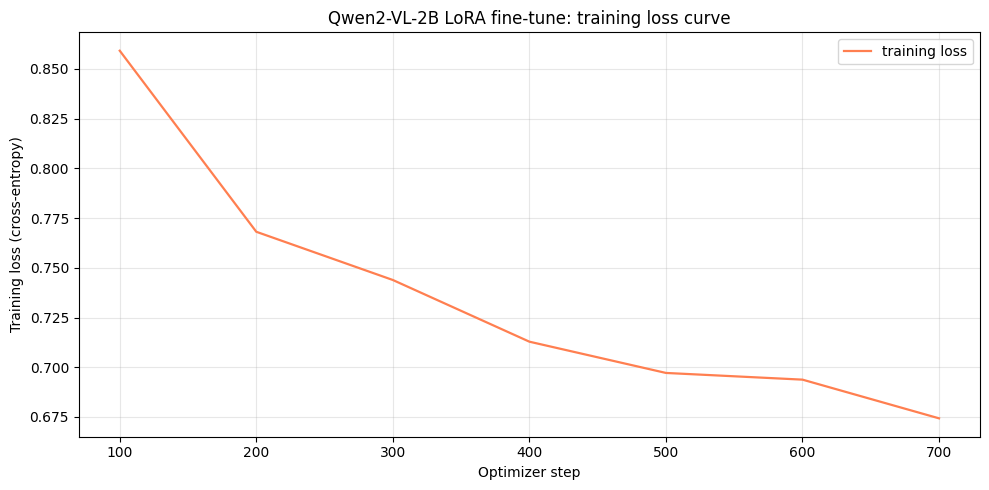


Loss summary:
  initial loss (step   100) : 0.859
  final loss   (step   700) : 0.674
  total reduction              : 0.185
  total optimizer steps logged : 7


In [17]:
# ============================================================
# Plot the training-loss curve
# ============================================================
# Loads the persisted loss history from Drive (so this cell can be run
# in any future session without re-running training) and plots it.
import json as _json
import matplotlib.pyplot as plt

with open(LOSS_HISTORY_PATH) as f:
    payload = _json.load(f)
loss_rows = payload["loss_history"]

if not loss_rows:
    print("No loss rows logged — was training resumed at the very end?")
else:
    steps  = [r["step"] for r in loss_rows]
    losses = [r["loss"] for r in loss_rows]

    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(steps, losses, color="coral", linewidth=1.6, label="training loss")
    # Light smoothing overlay (50-step rolling mean) to make the trend
    # easier to read through the per-step noise.
    if len(losses) >= 10:
        import numpy as _np
        window = max(5, len(losses) // 50)
        kernel = _np.ones(window) / window
        smooth = _np.convolve(losses, kernel, mode="valid")
        smooth_steps = steps[window - 1:]
        ax.plot(smooth_steps, smooth, color="darkred", linewidth=2.0,
                label=f"rolling mean ({window} pts)")

    ax.set_xlabel("Optimizer step")
    ax.set_ylabel("Training loss (cross-entropy)")
    ax.set_title("Qwen2-VL-2B LoRA fine-tune: training loss curve")
    ax.grid(alpha=0.3)
    ax.legend()
    plt.tight_layout()
    plt.show()

    print(f"\nLoss summary:")
    print(f"  initial loss (step {steps[0]:>5}) : {losses[0]:.3f}")
    print(f"  final loss   (step {steps[-1]:>5}) : {losses[-1]:.3f}")
    print(f"  total reduction              : {losses[0] - losses[-1]:.3f}")
    print(f"  total optimizer steps logged : {len(steps):,}")

In [18]:
# ============================================================
# Re-run inference on the held-out test split with the fine-tuned model
# ============================================================
# Same loop as §4.2.2 (zero-shot), with `peft_model` swapped in for the
# base `model`. Same eval items (test_eval_items, the 20% held-out
# split), same prompt, same greedy decoding — so any metric difference
# is attributable to the LoRA weights, not sampling noise or eval-set
# variation.
import time
from tqdm.auto import tqdm
from qwen_vl_utils import process_vision_info

peft_model.eval()  # disable dropout etc. for deterministic inference

ft_results = []
start_time = time.time()

with torch.inference_mode():
    for item in tqdm(test_eval_items, desc="Qwen2-VL + LoRA inference"):
        try:
            messages = build_messages(item["image"], item["human_text"])
            prompt_text = processor.apply_chat_template(
                messages, tokenize=False, add_generation_prompt=True,
            )
            image_inputs, video_inputs = process_vision_info(messages)
            inputs = processor(
                text=[prompt_text],
                images=image_inputs, videos=video_inputs,
                return_tensors="pt", padding=True,
            ).to(peft_model.device)

            gen_ids = peft_model.generate(
                **inputs, max_new_tokens=MAX_NEW_TOKENS, do_sample=DO_SAMPLE,
            )
            new_tokens = gen_ids[:, inputs.input_ids.shape[1]:]
            output_text = processor.batch_decode(
                new_tokens, skip_special_tokens=True,
                clean_up_tokenization_spaces=False,
            )[0].strip()
            pred = parse_coordinates(output_text)
        except Exception as e:
            output_text = f"[ERROR: {type(e).__name__}: {e}]"
            pred = None

        ft_results.append({
            "row_idx":    item["row_idx"],
            "pair_idx":   item["pair_idx"],
            "width":      item["width"],
            "height":     item["height"],
            "gt_x":       item["gt_x"],
            "gt_y":       item["gt_y"],
            "raw_output": output_text,
            "pred_x":     pred[0] if pred else None,
            "pred_y":     pred[1] if pred else None,
        })

elapsed = time.time() - start_time
print(f"\n✓ FT inference: {len(ft_results)} samples in {elapsed:.1f}s "
      f"({elapsed/max(len(ft_results),1):.2f}s/sample)")

ft_df = pd.DataFrame(ft_results)
ft_df.to_csv("/content/qwen2vl_2b_lora_results.csv", index=False)

Qwen2-VL + LoRA inference:   0%|          | 0/714 [00:00<?, ?it/s]


✓ FT inference: 714 samples in 556.1s (0.78s/sample)


  Qwen2-VL-2B:  ZERO-SHOT  vs  +LoRA  (714 held-out test samples)

[Format compliance — higher is better]
Metric                                 Zero-shot         +LoRA               Δ
Parse rate (%)                             89.92        100.00    +10.08 ↑
In-bounds rate (%)                         89.92        100.00    +10.08 ↑

[Distance error — lower is better]
Metric                                 Zero-shot         +LoRA               Δ
Mean err (normalized 0-999)               166.99         50.59   -116.40 ↑
Median err (normalized 0-999)             106.05         11.40    -94.65 ↑
Mean err (pixels)                         170.05         54.90   -115.16 ↑
Median err (pixels)                       108.38         12.55    -95.82 ↑
Mean err (% of diagonal)                   11.60          3.76     -7.84 ↑

[Accuracy at thresholds — higher is better]
Metric                                 Zero-shot         +LoRA               Δ
Acc @ 5 px                                  0.28   

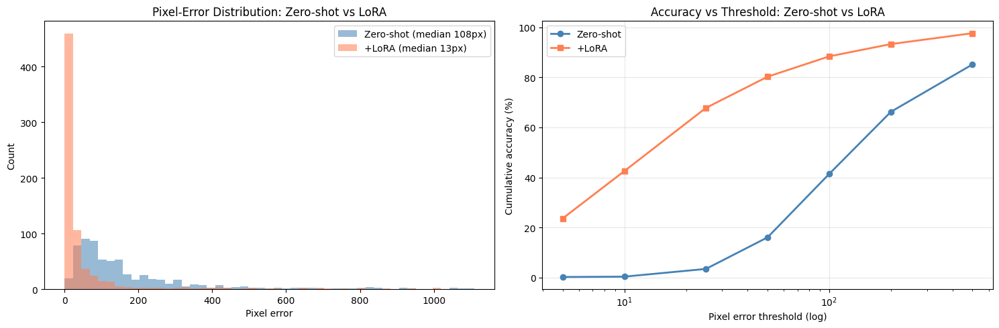

In [19]:
# ============================================================
# Side-by-side comparison: zero-shot vs fine-tuned
# ============================================================
# Same metrics computed in §4.2.3 (zero-shot), now applied to the
# fine-tuned predictions. We re-use the existing `df` (zero-shot) frame
# from §4.2.3 as the baseline comparison; if it's not in memory (e.g.
# this cell is run after a kernel restart), recompute zero-shot metrics
# from the saved CSV.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def compute_metrics(pred_df):
    """
    Compute the full grounding-metric battery on a predictions DataFrame.
    Mirrors §4.2.3 exactly so numbers are directly comparable.
    """
    n = len(pred_df)
    parsed    = pred_df["pred_x"].notna() & pred_df["pred_y"].notna()
    in_bounds = parsed & pred_df["pred_x"].between(0, 999) & pred_df["pred_y"].between(0, 999)
    valid = pred_df[in_bounds].copy()

    m = {
        "n_total":        n,
        "parse_rate":     parsed.mean() * 100,
        "in_bounds_rate": in_bounds.mean() * 100,
    }
    if len(valid) > 0:
        valid["err_norm"] = np.sqrt(
            (valid["pred_x"] - valid["gt_x"]) ** 2
            + (valid["pred_y"] - valid["gt_y"]) ** 2
        )
        pxx = valid["pred_x"] / 999.0 * valid["width"]
        pxy = valid["pred_y"] / 999.0 * valid["height"]
        gxx = valid["gt_x"]   / 999.0 * valid["width"]
        gxy = valid["gt_y"]   / 999.0 * valid["height"]
        valid["err_px"] = np.sqrt((pxx - gxx) ** 2 + (pxy - gxy) ** 2)
        diag = np.sqrt(valid["width"] ** 2 + valid["height"] ** 2)
        valid["err_pct_diag"] = valid["err_px"] / diag * 100

        m["mean_err_norm"]     = valid["err_norm"].mean()
        m["median_err_norm"]   = valid["err_norm"].median()
        m["mean_err_px"]       = valid["err_px"].mean()
        m["median_err_px"]     = valid["err_px"].median()
        m["mean_err_pct_diag"] = valid["err_pct_diag"].mean()

        for thr in [5, 10, 25, 50, 100, 200]:
            m[f"acc_px_{thr}"] = (valid["err_px"] <= thr).sum() / n * 100
        for thr in [10, 25, 50, 100, 200]:
            m[f"acc_norm_{thr}"] = (valid["err_norm"] <= thr).sum() / n * 100
        for thr in [1, 2, 5, 10]:
            m[f"acc_diag_{thr}"] = (valid["err_pct_diag"] <= thr).sum() / n * 100
    else:
        for k in ["mean_err_norm", "median_err_norm", "mean_err_px",
                  "median_err_px", "mean_err_pct_diag"]:
            m[k] = float("nan")
        for thr in [5, 10, 25, 50, 100, 200]:
            m[f"acc_px_{thr}"] = 0.0
        for thr in [10, 25, 50, 100, 200]:
            m[f"acc_norm_{thr}"] = 0.0
        for thr in [1, 2, 5, 10]:
            m[f"acc_diag_{thr}"] = 0.0
    return m, valid


# Baseline: prefer in-memory `df` from §4.2.3, otherwise recompute from CSV.
if "df" in dir() and isinstance(df, pd.DataFrame) and "pred_x" in df.columns:
    baseline_df = df.copy()
else:
    baseline_csv = "/content/qwen2vl_2b_baseline_results.csv"
    if os.path.exists(baseline_csv):
        baseline_df = pd.read_csv(baseline_csv)
    else:
        raise RuntimeError(
            "No baseline df in memory and no baseline CSV at "
            f"{baseline_csv}. Re-run §4.2.2-4.2.3 first."
        )

baseline_metrics, baseline_valid = compute_metrics(baseline_df)
ft_metrics, ft_valid             = compute_metrics(ft_df)


# ---------- Tabular report ----------
def fmt_delta(b, f, higher_is_better):
    if any(map(lambda v: v != v, [b, f])):
        return "   n/a"
    d = f - b
    arrow = "↑" if (d > 0) == higher_is_better else ("↓" if d != 0 else "·")
    return f"{d:+7.2f} {arrow}"


print("=" * 78)
print(f"  Qwen2-VL-2B:  ZERO-SHOT  vs  +LoRA  ({len(test_eval_items)} held-out test samples)")
print("=" * 78)

print(f"\n[Format compliance — higher is better]")
print(f"{'Metric':<36}{'Zero-shot':>12}{'+LoRA':>14}{'Δ':>16}")
for k, label in [("parse_rate",     "Parse rate (%)"),
                 ("in_bounds_rate", "In-bounds rate (%)")]:
    b, f = baseline_metrics[k], ft_metrics[k]
    print(f"{label:<36}{b:>12.2f}{f:>14.2f}   {fmt_delta(b, f, True)}")

print(f"\n[Distance error — lower is better]")
print(f"{'Metric':<36}{'Zero-shot':>12}{'+LoRA':>14}{'Δ':>16}")
for k, label in [("mean_err_norm",     "Mean err (normalized 0-999)"),
                 ("median_err_norm",   "Median err (normalized 0-999)"),
                 ("mean_err_px",       "Mean err (pixels)"),
                 ("median_err_px",     "Median err (pixels)"),
                 ("mean_err_pct_diag", "Mean err (% of diagonal)")]:
    b, f = baseline_metrics[k], ft_metrics[k]
    print(f"{label:<36}{b:>12.2f}{f:>14.2f}   {fmt_delta(b, f, False)}")

print(f"\n[Accuracy at thresholds — higher is better]")
print(f"{'Metric':<36}{'Zero-shot':>12}{'+LoRA':>14}{'Δ':>16}")
for thr in [5, 10, 25, 50, 100, 200]:
    k = f"acc_px_{thr}"
    b, f = baseline_metrics[k], ft_metrics[k]
    print(f"{'Acc @ '+str(thr)+' px':<36}{b:>12.2f}{f:>14.2f}   {fmt_delta(b, f, True)}")
for thr in [1, 2, 5, 10]:
    k = f"acc_diag_{thr}"
    b, f = baseline_metrics[k], ft_metrics[k]
    print(f"{'Acc @ '+str(thr)+'% of diagonal':<36}{b:>12.2f}{f:>14.2f}   {fmt_delta(b, f, True)}")
print("=" * 78)


# ---------- Visual comparison ----------
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

bins_max = max(
    baseline_valid["err_px"].max() if len(baseline_valid) else 1,
    ft_valid["err_px"].max() if len(ft_valid) else 1,
)
bins = np.linspace(0, bins_max, 50)
if len(baseline_valid):
    axes[0].hist(baseline_valid["err_px"], bins=bins, alpha=0.55,
                 color="steelblue",
                 label=f"Zero-shot (median {baseline_metrics['median_err_px']:.0f}px)")
if len(ft_valid):
    axes[0].hist(ft_valid["err_px"], bins=bins, alpha=0.55,
                 color="coral",
                 label=f"+LoRA (median {ft_metrics['median_err_px']:.0f}px)")
axes[0].set_xlabel("Pixel error")
axes[0].set_ylabel("Count")
axes[0].set_title("Pixel-Error Distribution: Zero-shot vs LoRA")
axes[0].legend()

thresholds = [5, 10, 25, 50, 100, 200, 500]
def acc_curve(valid_df, n_total):
    return [(valid_df["err_px"] <= t).sum() / n_total * 100
            if len(valid_df) else 0 for t in thresholds]

axes[1].plot(thresholds, acc_curve(baseline_valid, len(baseline_df)),
             "o-", color="steelblue", linewidth=2, label="Zero-shot")
axes[1].plot(thresholds, acc_curve(ft_valid, len(ft_df)),
             "s-", color="coral", linewidth=2, label="+LoRA")
axes[1].set_xscale("log")
axes[1].set_xlabel("Pixel error threshold (log)")
axes[1].set_ylabel("Cumulative accuracy (%)")
axes[1].set_title("Accuracy vs Threshold: Zero-shot vs LoRA")
axes[1].grid(True, alpha=0.3)
axes[1].legend()

plt.tight_layout()
plt.show()

### 4.2.6 LoRA Fine-Tune (Hybrid Loss: CE + L2)

The previous section (§4.2.5) trained Qwen2-VL with pure token-level
cross-entropy. That objective is structurally **insensitive to spatial
distance**: predicting `(451, 120)` when the truth is `(450, 120)` incurs the
same per-token loss as predicting `(999, 999)` would, even though one is
essentially correct and the other catastrophic.

This section adds an **auxiliary L2 distance term** computed on differentiable
digit-token expectations. At each digit position $i$, we read the model's
logits, mask to the 10 digit tokens (0-9), softmax, and compute the expected
digit:

$$\hat{d}_i = \sum_{j=0}^{9} j \cdot P(\text{token}_i = \text{"}j\text{"})$$

We assemble these into expected coordinates
$\hat{x} = 100\,\hat{d}_1 + 10\,\hat{d}_2 + \hat{d}_3$ (and similarly for
$\hat{y}$, with comma-aware splitting for asymmetric digit counts), then
compute Euclidean distance to ground truth. The full objective is:

$$\mathcal{L} = \mathcal{L}_{\text{CE}} + \lambda \cdot \mathcal{L}_{\text{dist}}$$

with $\lambda = 0.01$ chosen so CE remains the primary signal but the distance
term provides denser spatial supervision (especially on the upper tail of the
error distribution).

**Why not pure distance?** A pure-distance loss has known failure modes:
loss of format compliance, collapse to predicting the dataset mean, imbalanced
per-digit weighting (hundreds-place gets 100x the gradient of the ones-place),
and pathological expected-value behavior on bimodal distributions. CE keeps
the model anchored to valid string outputs and calibrated commitments; the
distance term layers spatial precision on top.

This run produces a **separate adapter** (saved to a different output
directory) so we can compare three conditions cleanly: zero-shot baseline,
pure-CE LoRA (§4.2.5), and hybrid-loss LoRA.

In [20]:
# ============================================================
# Reload base Qwen2-VL for a fresh adapter (avoid CE contamination)
# ============================================================
# IMPORTANT: PEFT mutates `model` in place when you call get_peft_model.
# The `peft_model` from §4.2.5 wraps a `model` whose LoRA adapters have
# already been trained on cross-entropy. If we attached a NEW adapter
# without first reloading the base, the hybrid run would effectively
# start from CE-fine-tuned weights — confounding the ablation.
#
# Fix: free the existing peft_model, clear CUDA cache, and reload the
# base model from the HuggingFace cache (re-download is skipped, so this
# is fast — ~30 seconds rather than several minutes).
import gc

# Free the CE adapter from memory before loading the second copy of the
# base model. On a T4 (16 GB) this step is mandatory; on an A100 (40 GB)
# it's still good hygiene.
del peft_model, model
gc.collect()
torch.cuda.empty_cache()

from transformers import Qwen2VLForConditionalGeneration

print(f"Reloading base Qwen2-VL ({MODEL_ID}) for the hybrid run...")
model = Qwen2VLForConditionalGeneration.from_pretrained(
    MODEL_ID,
    torch_dtype=DTYPE,
    device_map=DEVICE_MAP,
)
model.eval()
model.enable_input_require_grads()  # required for LoRA + grad checkpointing

n_params = sum(p.numel() for p in model.parameters())
print(f"✓ Fresh base model loaded. Parameter count: {n_params/1e9:.2f}B")
print(f"  Same DTYPE ({DTYPE}) and DEVICE_MAP ({DEVICE_MAP}) as §4.2.")

Reloading base Qwen2-VL (Qwen/Qwen2-VL-2B-Instruct) for the hybrid run...


Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/729 [00:00<?, ?it/s]

✓ Fresh base model loaded. Parameter count: 2.21B
  Same DTYPE (torch.bfloat16) and DEVICE_MAP (auto) as §4.2.


In [21]:
# ============================================================
# Identify digit and comma token IDs (one-time tokenizer inspection)
# ============================================================
# To compute expected digit values from the logit distribution at each
# answer position, we need to know which token IDs correspond to the
# digits "0" through "9". For BPE tokenizers (which Qwen2-VL uses),
# single-digit strings can tokenize differently depending on context
# (start of word, with leading space, etc.). We need the *exact* IDs
# that appear in our training labels at digit positions.
#
# We also need the comma token ID, because our coordinates can have
# asymmetric digit counts (e.g. "(50, 999)" — 2 digits for x, 3 for y).
# A naive `half = num_digits // 2` split is silently wrong on those
# cases; using the comma's position in the labels splits correctly.

tokenizer = processor.tokenizer

# Probe: how does Qwen tokenize a digit appearing right after "(" ?
# That's the position digits appear in our answer strings.
digit_token_ids = []
for d in range(10):
    ids_in_ctx = tokenizer.encode(f"({d}", add_special_tokens=False)
    # Last token is the digit (the "(" comes first).
    digit_token_ids.append(ids_in_ctx[-1])

print("Digit -> token ID mapping (in-context, after '('):")
for d, tid in enumerate(digit_token_ids):
    decoded = tokenizer.decode([tid])
    print(f"  '{d}' -> {tid:>6}  (decodes to {decoded!r})")

# Sanity check: every digit must map to a unique single-character token.
# If this fails, multi-digit numbers might be tokenized as one token (e.g.
# "999" as a single BPE merge), and the hybrid loss as written wouldn't
# correctly extract per-digit expectations.
assert len(set(digit_token_ids)) == 10, "Digit tokens are not unique!"
for d, tid in enumerate(digit_token_ids):
    decoded = tokenizer.decode([tid]).strip()
    assert decoded == str(d), (
        f"Digit {d} decodes to {decoded!r}, not {str(d)!r}. "
        f"BPE may be merging digits into multi-char tokens; the hybrid "
        f"loss assumes one-digit-per-token and would need refactoring."
    )

# Move to model device for fast indexing inside the loss function.
DIGIT_TOKEN_IDS = torch.tensor(digit_token_ids, device=model.device)
print(f"\n✓ DIGIT_TOKEN_IDS tensor: shape={DIGIT_TOKEN_IDS.shape}, "
      f"device={DIGIT_TOKEN_IDS.device}")

# Comma token. Tokenize "1, 2" and find the token containing "," in its
# decoded form (it may carry a leading space depending on BPE).
comma_ids = tokenizer.encode("1, 2", add_special_tokens=False)
COMMA_TOKEN_ID = None
for tid in comma_ids:
    if "," in tokenizer.decode([tid]):
        COMMA_TOKEN_ID = tid
        break
assert COMMA_TOKEN_ID is not None, "Could not find a comma token in tokenizer output"
print(f"COMMA_TOKEN_ID: {COMMA_TOKEN_ID} (decodes to {tokenizer.decode([COMMA_TOKEN_ID])!r})")

Digit -> token ID mapping (in-context, after '('):
  '0' ->     15  (decodes to '0')
  '1' ->     16  (decodes to '1')
  '2' ->     17  (decodes to '2')
  '3' ->     18  (decodes to '3')
  '4' ->     19  (decodes to '4')
  '5' ->     20  (decodes to '5')
  '6' ->     21  (decodes to '6')
  '7' ->     22  (decodes to '7')
  '8' ->     23  (decodes to '8')
  '9' ->     24  (decodes to '9')

✓ DIGIT_TOKEN_IDS tensor: shape=torch.Size([10]), device=cuda:0
COMMA_TOKEN_ID: 11 (decodes to ',')


In [22]:
# ============================================================
# Hybrid Dataset: same as §4.2.5's QwenGroundingDataset but also
# returns gt_coords for the distance loss
# ============================================================
import torch
from torch.utils.data import Dataset
from qwen_vl_utils import process_vision_info


class QwenGroundingHybridDataset(Dataset):
    """Same as QwenGroundingDataset but the __getitem__ output also
    includes gt_coords (a [1, 2] float tensor of the GT (x, y)). The
    custom loss function reads these to compute Euclidean distance."""

    def __init__(self, items, dataset, processor):
        self.items     = items
        self.dataset   = dataset
        self.processor = processor

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        item = self.items[idx]
        image = decode_image(self.dataset["image"][item["row_idx"]])

        user_msgs = build_messages(image, item["human_text"])
        full_msgs = user_msgs + [{
            "role":    "assistant",
            "content": f"({item['gt_x']}, {item['gt_y']})",
        }]

        full_text = self.processor.apply_chat_template(
            full_msgs, tokenize=False, add_generation_prompt=False,
        )
        prompt_text = self.processor.apply_chat_template(
            user_msgs, tokenize=False, add_generation_prompt=True,
        )
        image_inputs, _ = process_vision_info(user_msgs)

        full_enc = self.processor(
            text=[full_text], images=image_inputs,
            return_tensors="pt", padding=True,
        )
        prompt_len = self.processor(
            text=[prompt_text], images=image_inputs,
            return_tensors="pt", padding=True,
        ).input_ids.shape[1]

        labels = full_enc.input_ids.clone()
        labels[:, :prompt_len] = -100

        return {
            "input_ids":      full_enc.input_ids,
            "attention_mask": full_enc.attention_mask,
            "labels":         labels,
            "pixel_values":   full_enc.pixel_values,
            "image_grid_thw": full_enc.image_grid_thw,
            # NEW: GT (x, y) as float tensor for the distance loss.
            "gt_coords": torch.tensor(
                [[item["gt_x"], item["gt_y"]]], dtype=torch.float32,
            ),
        }


def qwen_collate_hybrid(features):
    return features[0]


train_dataset_hybrid = QwenGroundingHybridDataset(train_items, ds, processor)

_sample = train_dataset_hybrid[0]
print("Hybrid dataset sample shapes:")
for k, v in _sample.items():
    print(f"  {k:<16s}: {tuple(v.shape)}  dtype={v.dtype}")

Hybrid dataset sample shapes:
  input_ids       : (1, 1019)  dtype=torch.int64
  attention_mask  : (1, 1019)  dtype=torch.int64
  labels          : (1, 1019)  dtype=torch.int64
  pixel_values    : (3108, 1176)  dtype=torch.float32
  image_grid_thw  : (1, 3)  dtype=torch.int64
  gt_coords       : (1, 2)  dtype=torch.float32


In [23]:
# ============================================================
# Attach a fresh LoRA adapter for the hybrid run
# ============================================================
# Same hyperparameters as the pure-CE adapter (r=16, alpha=32, dropout
# 0.05, q/k/v/o_proj). Holding LoRA config constant across the two runs
# isolates the loss function as the only variable that changed.
from peft import LoraConfig, get_peft_model, TaskType

lora_config_hybrid = LoraConfig(
    r              = 16,
    lora_alpha     = 32,
    lora_dropout   = 0.05,
    target_modules = ["q_proj", "k_proj", "v_proj", "o_proj"],
    bias           = "none",
    task_type      = TaskType.CAUSAL_LM,
)

peft_model_hybrid = get_peft_model(model, lora_config_hybrid)
peft_model_hybrid.print_trainable_parameters()

# Re-pin DIGIT_TOKEN_IDS to the (possibly different) post-PEFT device.
DIGIT_TOKEN_IDS = DIGIT_TOKEN_IDS.to(peft_model_hybrid.device)

trainable params: 4,358,144 || all params: 2,213,343,744 || trainable%: 0.1969


In [24]:
# ============================================================
# HybridLossTrainer: cross-entropy + lambda * Euclidean distance
# ============================================================
# Subclass HuggingFace's Trainer and override compute_loss. The standard
# Trainer call already gives us CE via the model's forward pass with
# `labels`; we add a distance term computed from the logits at digit
# positions.
from transformers import Trainer

# Weight on the distance term. Picked so it's meaningful but doesn't
# dominate CE early in training:
#   CE per-token at random init: ~ln(vocab_size) ~= 12 nats, dropping to
#   ~0.5 nats once the model commits to digits.
#   Distance per-sample at random init: ~700 px Euclidean (rough average
#   over uniform [0,999] predictions vs central GT).
# At lambda=0.01, distance contributes ~7 to the loss early (similar
# order to CE at ~12), and ~0.5 once trained (similar to CE at ~0.5).
# This keeps the two terms in the same ballpark throughout training.
DISTANCE_LAMBDA = 0.01


class HybridLossTrainer(Trainer):
    """
    Custom Trainer that computes:
        loss = ce_loss + DISTANCE_LAMBDA * mean_euclidean_distance

    The distance term is computed on differentiable digit-token
    expectations: at each answer digit position, take the logits, mask
    to digit tokens 0-9, softmax, compute expected digit value, and
    assemble into expected coordinates (x_hat, y_hat). The L2 distance
    between (x_hat, y_hat) and the ground-truth (x, y) is the auxiliary
    loss.

    Crucially, this is fully differentiable: argmax is replaced with a
    softmax-weighted sum, so gradients flow back through the model's
    logit head to the LoRA adapters.
    """

    def compute_loss(self, model, inputs, return_outputs=False, **kwargs):
        # Pop GT coords out before passing inputs to the model
        # (model.forward() doesn't accept this extra kwarg).
        gt_coords = inputs.pop("gt_coords")  # [1, 1, 2]
        gt_coords = gt_coords.squeeze(1).to(model.device)  # [1, 2]

        labels = inputs["labels"]

        # Standard forward pass. With `labels=...` in inputs, the model
        # computes and returns the cross-entropy loss as `outputs.loss`.
        outputs = model(**inputs)
        ce_loss = outputs.loss

        # Logits: [batch, seq, vocab]. We need logits at the positions
        # PREDICTING each label token. In causal LMs, position t's
        # logits predict token t+1, so the logits we want for label
        # position t are at logits position t-1. Apply the standard
        # "shift by 1" used by HuggingFace's loss computation.
        logits = outputs.logits[:, :-1, :]
        shifted_labels = labels[:, 1:]

        # Identify digit positions in shifted_labels (one-hot test).
        is_digit = torch.zeros_like(shifted_labels, dtype=torch.bool)
        for tid in DIGIT_TOKEN_IDS:
            is_digit |= (shifted_labels == tid)

        # Defensive: skip distance term if no digit positions found.
        if not is_digit.any():
            return (ce_loss, outputs) if return_outputs else ce_loss

        batch_size = shifted_labels.size(0)
        device = logits.device

        # We only handle batch_size=1 here (matches our training setup).
        assert batch_size == 1, (
            f"HybridLossTrainer assumes batch_size=1 (got {batch_size}). "
            f"Update this loop for larger batches."
        )

        digit_positions = is_digit[0]
        digit_logits = logits[0][digit_positions]
        digit_label_ids = shifted_labels[0][digit_positions]

        # Map label token IDs back to digit values 0-9.
        digit_values = torch.zeros_like(digit_label_ids, dtype=torch.long)
        for d in range(10):
            digit_values[digit_label_ids == DIGIT_TOKEN_IDS[d]] = d

        num_digits = digit_logits.size(0)
        if num_digits < 2:
            return (ce_loss, outputs) if return_outputs else ce_loss

        # Split into x-digits and y-digits using the COMMA TOKEN'S
        # POSITION. We can't just use num_digits//2 because x and y can
        # have different digit counts (e.g. "(50, 999)" has 2+3 digits,
        # total 5). Instead: find the comma in shifted_labels and split
        # digits into "before comma" (x) and "after comma" (y).
        comma_positions = (shifted_labels[0] == COMMA_TOKEN_ID).nonzero(as_tuple=True)[0]
        if comma_positions.numel() == 0:
            return (ce_loss, outputs) if return_outputs else ce_loss
        comma_pos = comma_positions[0].item()

        digit_position_indices = digit_positions.nonzero(as_tuple=True)[0]
        half_x = int((digit_position_indices < comma_pos).sum().item())
        half_y = num_digits - half_x
        if half_x < 1 or half_y < 1:
            return (ce_loss, outputs) if return_outputs else ce_loss

        # For each digit position, compute the SOFTMAX over just the 10
        # digit tokens, then the expected digit value. This is the
        # differentiable replacement for argmax.
        digit_only_logits = digit_logits[:, DIGIT_TOKEN_IDS]
        digit_probs = torch.softmax(digit_only_logits, dim=-1)
        digit_range = torch.arange(10, device=device, dtype=digit_probs.dtype)
        expected_digits = (digit_probs * digit_range).sum(dim=-1)

        # Place-value assembly:
        # For "(450, 120)" with half_x=3, half_y=3:
        #   place_values_x = [100, 10, 1] -> x_hat = 100*d0 + 10*d1 + d2
        # For "(50, 999)" with half_x=2, half_y=3:
        #   place_values_x = [10, 1]     -> x_hat = 10*d0 + d1
        #   place_values_y = [100, 10, 1] -> y_hat = 100*d2 + 10*d3 + d4
        place_values_x = torch.tensor(
            [10 ** (half_x - 1 - i) for i in range(half_x)],
            device=device, dtype=digit_probs.dtype,
        )
        place_values_y = torch.tensor(
            [10 ** (half_y - 1 - i) for i in range(half_y)],
            device=device, dtype=digit_probs.dtype,
        )
        x_hat = (expected_digits[:half_x] * place_values_x).sum()
        y_hat = (expected_digits[half_x:] * place_values_y).sum()
        pred_coords = torch.stack([x_hat, y_hat]).unsqueeze(0)

        # Squared form (smoother gradients near zero); sqrt at the end
        # for interpretable "pixels" units.
        dist_sq = ((pred_coords - gt_coords) ** 2).sum(dim=-1)
        dist_loss = torch.sqrt(dist_sq + 1e-8).mean()

        total_loss = ce_loss + DISTANCE_LAMBDA * dist_loss

        # Best-effort logging of the two components separately.
        if hasattr(self, "log") and self.state.global_step % 100 == 0:
            try:
                self.log({
                    "ce_loss":     ce_loss.item(),
                    "dist_loss":   dist_loss.item(),
                    "dist_lambda": DISTANCE_LAMBDA,
                })
            except Exception:
                pass

        return (total_loss, outputs) if return_outputs else total_loss


print(f"HybridLossTrainer ready. lambda = {DISTANCE_LAMBDA}")
print(f"Loss = CE + {DISTANCE_LAMBDA} * Euclidean(predicted, ground_truth)")

HybridLossTrainer ready. lambda = 0.01
Loss = CE + 0.01 * Euclidean(predicted, ground_truth)


In [25]:
# ============================================================
# Train hybrid-loss LoRA (with async Drive mirror to MS4 folder)
# ============================================================
# Same training infrastructure as the pure-CE run: local checkpoints
# for speed, async Drive mirror for persistence across runtime
# disconnects. Output paths are different so the two adapters don't
# collide.
import shutil
import threading
import queue
from transformers import TrainingArguments, TrainerCallback

LOCAL_HYBRID_DIR = "/content/qwen2vl_lora_hybrid_adapter"
DRIVE_HYBRID_DIR = "/content/drive/MyDrive/Too CUA for School/MS4/qwen2vl_lora_hybrid_adapter"

assert os.path.isdir("/content/drive/MyDrive"), (
    "Google Drive is not mounted. Re-run the drive.mount cell first."
)
os.makedirs(LOCAL_HYBRID_DIR, exist_ok=True)
os.makedirs(DRIVE_HYBRID_DIR, exist_ok=True)


class DriveMirrorCallback(TrainerCallback):
    """Re-defined here so this section is self-contained if someone
    re-runs from this point forward. Identical behavior to §4.2.5."""
    def __init__(self, local_dir, drive_dir):
        self.local_dir = local_dir
        self.drive_dir = drive_dir
        self.q = queue.Queue()
        self.worker = threading.Thread(target=self._run, daemon=True)
        self.worker.start()

    def _run(self):
        while True:
            job = self.q.get()
            if job is None:
                return
            local_path, ckpt_name = job
            try:
                drive_path = os.path.join(self.drive_dir, ckpt_name)
                if os.path.isdir(drive_path):
                    shutil.rmtree(drive_path)
                shutil.copytree(local_path, drive_path)
                self._sync_deletions()
                print(f"[drive-mirror] synced {ckpt_name} to Drive", flush=True)
            except Exception as e:
                print(f"[drive-mirror] WARN syncing {ckpt_name}: {e}", flush=True)
            finally:
                self.q.task_done()

    def _sync_deletions(self):
        local_ckpts = {d for d in os.listdir(self.local_dir)
                       if d.startswith("checkpoint-")}
        drive_ckpts = {d for d in os.listdir(self.drive_dir)
                       if d.startswith("checkpoint-")}
        for stale in drive_ckpts - local_ckpts:
            shutil.rmtree(os.path.join(self.drive_dir, stale), ignore_errors=True)

    def on_save(self, args, state, control, **kwargs):
        ckpt_name = f"checkpoint-{state.global_step}"
        local_path = os.path.join(self.local_dir, ckpt_name)
        if os.path.isdir(local_path):
            self.q.put((local_path, ckpt_name))

    def on_train_end(self, args, state, control, **kwargs):
        print(f"[drive-mirror] waiting for {self.q.qsize()} pending sync(s)...",
              flush=True)
        self.q.join()
        print("[drive-mirror] all checkpoints synced to Drive.", flush=True)


# Same hyperparameters as §4.2.5: only the loss function is different.
training_args_hybrid = TrainingArguments(
    output_dir                    = LOCAL_HYBRID_DIR,
    num_train_epochs              = 1,
    per_device_train_batch_size   = 1,
    gradient_accumulation_steps   = 4,
    gradient_checkpointing        = True,
    gradient_checkpointing_kwargs = {"use_reentrant": False},
    learning_rate                 = 2e-4,
    warmup_ratio                  = 0.03,
    lr_scheduler_type             = "cosine",
    weight_decay                  = 0.0,
    bf16 = (DTYPE == torch.bfloat16),
    fp16 = (DTYPE == torch.float16),
    logging_steps                 = 100,
    save_strategy                 = "steps",
    save_steps                    = 1000,
    save_total_limit              = 3,
    report_to                     = "none",
    remove_unused_columns         = False,   # keep pixel_values + gt_coords
    dataloader_num_workers        = 0,
    optim                         = "adamw_torch",
)

trainer_hybrid = HybridLossTrainer(
    model         = peft_model_hybrid,
    args          = training_args_hybrid,
    train_dataset = train_dataset_hybrid,
    data_collator = qwen_collate_hybrid,
    callbacks     = [DriveMirrorCallback(LOCAL_HYBRID_DIR, DRIVE_HYBRID_DIR)],
)

effective_batch = (training_args_hybrid.per_device_train_batch_size
                   * training_args_hybrid.gradient_accumulation_steps)
total_steps = (len(train_dataset_hybrid) // effective_batch
               * training_args_hybrid.num_train_epochs)
print(f"Starting hybrid-loss training:")
print(f"  samples         : {len(train_dataset_hybrid):,}")
print(f"  epochs          : {training_args_hybrid.num_train_epochs}")
print(f"  effective batch : {effective_batch}")
print(f"  optimizer steps : ~{total_steps:,}")
print(f"  loss            : CE + {DISTANCE_LAMBDA} * Euclidean")
print(f"  local ckpts     : every {training_args_hybrid.save_steps:,} -> {LOCAL_HYBRID_DIR}")
print(f"  drive mirror    : async background -> {DRIVE_HYBRID_DIR}")
print()


def _has_ckpts(d):
    return os.path.isdir(d) and any(
        x.startswith("checkpoint-") for x in os.listdir(d)
    )

# Auto-resume from Drive if local is empty (e.g. fresh Colab session).
if not _has_ckpts(LOCAL_HYBRID_DIR) and _has_ckpts(DRIVE_HYBRID_DIR):
    print("No local checkpoints; restoring from Drive mirror first...")
    for ckpt in sorted(d for d in os.listdir(DRIVE_HYBRID_DIR)
                       if d.startswith("checkpoint-")):
        src = os.path.join(DRIVE_HYBRID_DIR, ckpt)
        dst = os.path.join(LOCAL_HYBRID_DIR, ckpt)
        if not os.path.isdir(dst):
            shutil.copytree(src, dst)
    print(f"Restored {len(os.listdir(LOCAL_HYBRID_DIR))} checkpoint(s) locally.")

trainer_hybrid.train(resume_from_checkpoint=_has_ckpts(LOCAL_HYBRID_DIR))

# Save final adapter locally and mirror to Drive.
peft_model_hybrid.save_pretrained(LOCAL_HYBRID_DIR)
for fname in os.listdir(LOCAL_HYBRID_DIR):
    src = os.path.join(LOCAL_HYBRID_DIR, fname)
    dst = os.path.join(DRIVE_HYBRID_DIR, fname)
    if os.path.isfile(src):
        shutil.copy2(src, dst)
print(f"\n✓ Hybrid LoRA adapter saved to {LOCAL_HYBRID_DIR} and mirrored to {DRIVE_HYBRID_DIR}")

warmup_ratio is deprecated and will be removed in v5.2. Use `warmup_steps` instead.


Starting hybrid-loss training:
  samples         : 2,856
  epochs          : 1
  effective batch : 4
  optimizer steps : ~714
  loss            : CE + 0.01 * Euclidean
  local ckpts     : every 1,000 -> /content/qwen2vl_lora_hybrid_adapter
  drive mirror    : async background -> /content/drive/MyDrive/Too CUA for School/MS4/qwen2vl_lora_hybrid_adapter

No local checkpoints; restoring from Drive mirror first...
Restored 1 checkpoint(s) locally.
[drive-mirror] waiting for 0 pending sync(s)...
[drive-mirror] all checkpoints synced to Drive.


Step,Training Loss



✓ Hybrid LoRA adapter saved to /content/qwen2vl_lora_hybrid_adapter and mirrored to /content/drive/MyDrive/Too CUA for School/MS4/qwen2vl_lora_hybrid_adapter


In [26]:
# ============================================================
# Persist the full hybrid-training loss history to Drive
# ============================================================
# Same approach as §4.2.5: read trainer_state.json from the latest
# checkpoint and snapshot the log_history to a JSON next to the adapter.
# Naming the file `qwen_lora_hybrid_loss_history.json` so it doesn't
# collide with the pure-CE history file.
import json as _json

def _latest_checkpoint_dir(parent):
    if not os.path.isdir(parent):
        return None
    ckpts = [d for d in os.listdir(parent) if d.startswith("checkpoint-")]
    if not ckpts:
        return None
    return os.path.join(parent, max(ckpts, key=lambda x: int(x.split("-")[1])))

src_ckpt_hybrid = _latest_checkpoint_dir(LOCAL_HYBRID_DIR) or _latest_checkpoint_dir(DRIVE_HYBRID_DIR)
assert src_ckpt_hybrid is not None, (
    f"No checkpoint found in {LOCAL_HYBRID_DIR} or {DRIVE_HYBRID_DIR}. "
    f"Did training finish?"
)

state_path = os.path.join(src_ckpt_hybrid, "trainer_state.json")
with open(state_path) as f:
    state = _json.load(f)

# log_history for the hybrid run also contains our extra `ce_loss` and
# `dist_loss` entries logged every 100 steps, alongside the standard
# `loss` entries. We capture them all so the plot cell can show the
# decomposition.
loss_rows = []
for e in state["log_history"]:
    if "loss" in e:
        loss_rows.append({
            "step":      e["step"],
            "loss":      e["loss"],
            "ce_loss":   e.get("ce_loss"),
            "dist_loss": e.get("dist_loss"),
            "epoch":     e.get("epoch"),
        })

LOSS_HISTORY_HYBRID_PATH = os.path.join(DRIVE_HYBRID_DIR, "qwen_lora_hybrid_loss_history.json")
with open(LOSS_HISTORY_HYBRID_PATH, "w") as f:
    _json.dump({
        "source_checkpoint": os.path.basename(src_ckpt_hybrid),
        "n_training_steps":  state.get("global_step"),
        "lambda":            DISTANCE_LAMBDA,
        "loss_history":      loss_rows,
    }, f, indent=2)

print(f"✓ Saved {len(loss_rows)} loss-log rows to:")
print(f"  {LOSS_HISTORY_HYBRID_PATH}")
print(f"  (source: {os.path.basename(src_ckpt_hybrid)}, "
      f"global step at end: {state.get('global_step')})")

✓ Saved 7 loss-log rows to:
  /content/drive/MyDrive/Too CUA for School/MS4/qwen2vl_lora_hybrid_adapter/qwen_lora_hybrid_loss_history.json
  (source: checkpoint-714, global step at end: 714)


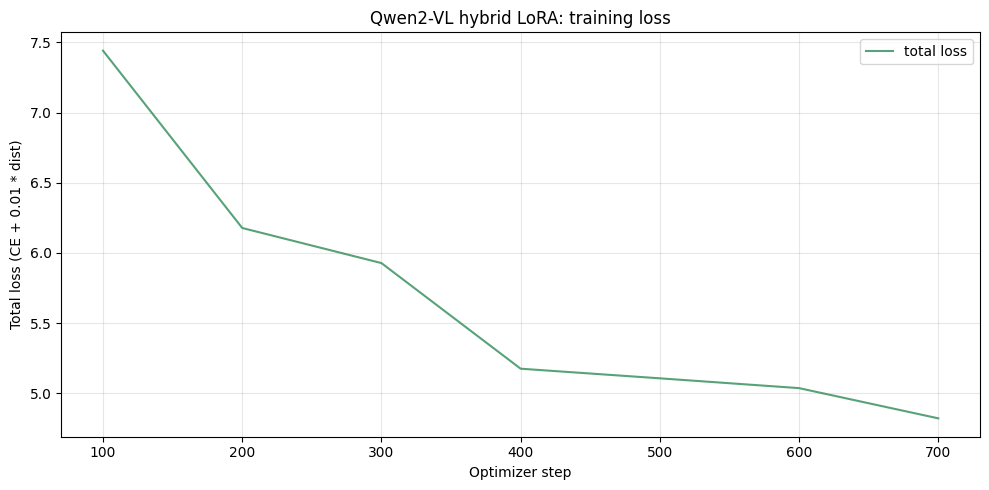


Loss summary:
  initial total loss (step   100) : 7.440
  final total loss   (step   700) : 4.822
  total optimizer steps logged           : 7


In [27]:
# ============================================================
# Plot: hybrid training curve (with CE / dist decomposition if available)
# ============================================================
# Loads the persisted hybrid loss history from Drive and plots:
#   1. Total loss (CE + lambda * dist)
#   2. CE component alone (if logged)
#   3. dist component alone (if logged)
# This makes it easy to see which term is shrinking and at what rate.
import json as _json
import matplotlib.pyplot as plt
import numpy as _np

with open(LOSS_HISTORY_HYBRID_PATH) as f:
    payload = _json.load(f)
loss_rows = payload["loss_history"]
hybrid_lambda = payload.get("lambda", DISTANCE_LAMBDA)

if not loss_rows:
    print("No loss rows logged.")
else:
    steps      = [r["step"] for r in loss_rows]
    total_loss = [r["loss"] for r in loss_rows]
    ce_only    = [r["ce_loss"]   for r in loss_rows if r.get("ce_loss")   is not None]
    dist_only  = [r["dist_loss"] for r in loss_rows if r.get("dist_loss") is not None]
    ce_steps   = [r["step"]      for r in loss_rows if r.get("ce_loss")   is not None]
    dist_steps = [r["step"]      for r in loss_rows if r.get("dist_loss") is not None]

    have_decomposition = bool(ce_only) and bool(dist_only)

    if have_decomposition:
        fig, axes = plt.subplots(1, 2, figsize=(14, 5))

        # Left panel: total loss only (with smoothing).
        axes[0].plot(steps, total_loss, color="seagreen", linewidth=1.5,
                     alpha=0.8, label="total loss")
        if len(total_loss) >= 10:
            window = max(5, len(total_loss) // 50)
            kernel = _np.ones(window) / window
            smooth = _np.convolve(total_loss, kernel, mode="valid")
            axes[0].plot(steps[window-1:], smooth, color="darkgreen",
                         linewidth=2.0, label=f"rolling mean ({window} pts)")
        axes[0].set_xlabel("Optimizer step")
        axes[0].set_ylabel("Total loss")
        axes[0].set_title(f"Hybrid total loss (CE + {hybrid_lambda} * dist)")
        axes[0].grid(alpha=0.3)
        axes[0].legend()

        # Right panel: CE vs dist on twin y-axes (different magnitudes).
        ax2_ce   = axes[1]
        ax2_dist = axes[1].twinx()
        ax2_ce.plot(ce_steps,   ce_only,   color="coral",     linewidth=1.6,
                    label="CE component")
        ax2_dist.plot(dist_steps, dist_only, color="steelblue", linewidth=1.6,
                      linestyle="--", label="dist component")
        ax2_ce.set_xlabel("Optimizer step")
        ax2_ce.set_ylabel("CE loss",   color="coral")
        ax2_dist.set_ylabel("Distance loss (px)", color="steelblue")
        ax2_ce.tick_params(axis='y',   labelcolor="coral")
        ax2_dist.tick_params(axis='y', labelcolor="steelblue")
        axes[1].set_title("Loss decomposition: CE vs distance")
        axes[1].grid(alpha=0.3)
    else:
        # No decomposition logged — plot total loss only.
        fig, ax = plt.subplots(figsize=(10, 5))
        ax.plot(steps, total_loss, color="seagreen", linewidth=1.5,
                alpha=0.8, label="total loss")
        if len(total_loss) >= 10:
            window = max(5, len(total_loss) // 50)
            kernel = _np.ones(window) / window
            smooth = _np.convolve(total_loss, kernel, mode="valid")
            ax.plot(steps[window-1:], smooth, color="darkgreen",
                    linewidth=2.0, label=f"rolling mean ({window} pts)")
        ax.set_xlabel("Optimizer step")
        ax.set_ylabel(f"Total loss (CE + {hybrid_lambda} * dist)")
        ax.set_title("Qwen2-VL hybrid LoRA: training loss")
        ax.grid(alpha=0.3)
        ax.legend()

    plt.tight_layout()
    plt.show()

    print(f"\nLoss summary:")
    print(f"  initial total loss (step {steps[0]:>5}) : {total_loss[0]:.3f}")
    print(f"  final total loss   (step {steps[-1]:>5}) : {total_loss[-1]:.3f}")
    print(f"  total optimizer steps logged           : {len(steps):,}")

In [28]:
# ============================================================
# Hybrid-LoRA inference on the same 20% held-out test split
# ============================================================
# Same loop as §4.2.5 (pure-CE FT inference), with peft_model_hybrid
# swapped in. Same test_eval_items, same prompt, same greedy decoding
# — any metric difference between CE-LoRA and Hybrid-LoRA is
# attributable to the loss function, not eval-set or sampling variation.
import time
from tqdm.auto import tqdm
from qwen_vl_utils import process_vision_info

peft_model_hybrid.eval()

ft_hybrid_results = []
start_time = time.time()

with torch.inference_mode():
    for item in tqdm(test_eval_items, desc="Qwen2-VL + Hybrid-LoRA inference"):
        try:
            messages = build_messages(item["image"], item["human_text"])
            prompt_text = processor.apply_chat_template(
                messages, tokenize=False, add_generation_prompt=True,
            )
            image_inputs, video_inputs = process_vision_info(messages)
            inputs = processor(
                text=[prompt_text],
                images=image_inputs, videos=video_inputs,
                return_tensors="pt", padding=True,
            ).to(peft_model_hybrid.device)

            gen_ids = peft_model_hybrid.generate(
                **inputs, max_new_tokens=MAX_NEW_TOKENS, do_sample=DO_SAMPLE,
            )
            new_tokens = gen_ids[:, inputs.input_ids.shape[1]:]
            output_text = processor.batch_decode(
                new_tokens, skip_special_tokens=True,
                clean_up_tokenization_spaces=False,
            )[0].strip()
            pred = parse_coordinates(output_text)
        except Exception as e:
            output_text = f"[ERROR: {type(e).__name__}: {e}]"
            pred = None

        ft_hybrid_results.append({
            "row_idx":    item["row_idx"],
            "pair_idx":   item["pair_idx"],
            "width":      item["width"],
            "height":     item["height"],
            "gt_x":       item["gt_x"],
            "gt_y":       item["gt_y"],
            "raw_output": output_text,
            "pred_x":     pred[0] if pred else None,
            "pred_y":     pred[1] if pred else None,
        })

elapsed = time.time() - start_time
print(f"\n✓ Hybrid FT inference: {len(ft_hybrid_results)} samples in "
      f"{elapsed:.1f}s ({elapsed/max(len(ft_hybrid_results),1):.2f}s/sample)")

ft_hybrid_df = pd.DataFrame(ft_hybrid_results)
ft_hybrid_df.to_csv("/content/qwen2vl_2b_lora_hybrid_results.csv", index=False)

Qwen2-VL + Hybrid-LoRA inference:   0%|          | 0/714 [00:00<?, ?it/s]


✓ Hybrid FT inference: 714 samples in 549.4s (0.77s/sample)


  Qwen2-VL-2B: ZERO-SHOT vs CE-LoRA vs HYBRID-LoRA  (714 held-out test samples)

[Format compliance — higher is better]
Metric                           Zero-shot   CE-LoRA    Hybrid         Δ vs CE
Parse rate (%)                       89.92    100.00    100.00     +0.00 ·
In-bounds rate (%)                   89.92    100.00    100.00     +0.00 ·

[Distance error — lower is better]
Metric                           Zero-shot   CE-LoRA    Hybrid         Δ vs CE
Mean err (normalized)               166.99     50.59     57.83     +7.24 ↓
Median err (normalized)             106.05     11.40     15.18     +3.78 ↓
Mean err (pixels)                   170.05     54.90     63.71     +8.82 ↓
Median err (pixels)                 108.38     12.55     17.21     +4.65 ↓
Mean err (% diagonal)                11.60      3.76      4.38     +0.62 ↓

[Accuracy at thresholds — higher is better, % of all 714 samples]
Metric                           Zero-shot   CE-LoRA    Hybrid         Δ vs CE
Acc @ 5 px     

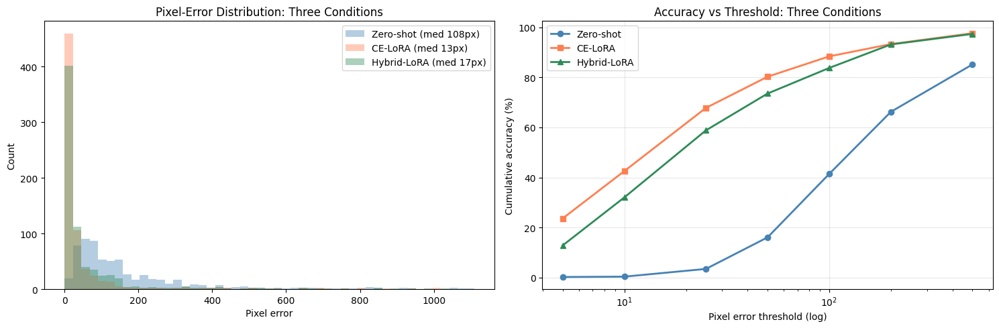

In [29]:
# ============================================================
# Three-way comparison: Zero-shot vs CE-LoRA vs Hybrid-LoRA
# ============================================================
# Reuses the compute_metrics function from §4.2.5's two-way comparison.
# baseline_df and ft_df should already be in memory from §4.2.5; if
# they're not, we fall back to reading the CSVs.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Recover dataframes if any were lost between sessions.
if "baseline_df" not in dir() or not isinstance(baseline_df, pd.DataFrame):
    baseline_df = pd.read_csv("/content/qwen2vl_2b_baseline_results.csv")
if "ft_df" not in dir() or not isinstance(ft_df, pd.DataFrame):
    ft_df = pd.read_csv("/content/qwen2vl_2b_lora_results.csv")

baseline_metrics, baseline_valid = compute_metrics(baseline_df)
ft_metrics,       ft_valid       = compute_metrics(ft_df)
hybrid_metrics,   hybrid_valid   = compute_metrics(ft_hybrid_df)


def fmt_delta(b, f, higher_is_better):
    if any(map(lambda v: v != v, [b, f])):
        return "   n/a"
    d = f - b
    arrow = "↑" if (d > 0) == higher_is_better else ("↓" if d != 0 else "·")
    return f"{d:+7.2f} {arrow}"


print("=" * 90)
print(f"  Qwen2-VL-2B: ZERO-SHOT vs CE-LoRA vs HYBRID-LoRA  ({len(test_eval_items)} held-out test samples)")
print("=" * 90)

# Format compliance.
print(f"\n[Format compliance — higher is better]")
print(f"{'Metric':<32}{'Zero-shot':>10}{'CE-LoRA':>10}{'Hybrid':>10}{'Δ vs CE':>16}")
for k, label in [("parse_rate",     "Parse rate (%)"),
                 ("in_bounds_rate", "In-bounds rate (%)")]:
    b = baseline_metrics[k]
    c = ft_metrics[k]
    h = hybrid_metrics[k]
    print(f"{label:<32}{b:>10.2f}{c:>10.2f}{h:>10.2f}   {fmt_delta(c, h, True)}")

# Distance error — lower is better.
print(f"\n[Distance error — lower is better]")
print(f"{'Metric':<32}{'Zero-shot':>10}{'CE-LoRA':>10}{'Hybrid':>10}{'Δ vs CE':>16}")
for k, label in [("mean_err_norm",     "Mean err (normalized)"),
                 ("median_err_norm",   "Median err (normalized)"),
                 ("mean_err_px",       "Mean err (pixels)"),
                 ("median_err_px",     "Median err (pixels)"),
                 ("mean_err_pct_diag", "Mean err (% diagonal)")]:
    b = baseline_metrics[k]
    c = ft_metrics[k]
    h = hybrid_metrics[k]
    print(f"{label:<32}{b:>10.2f}{c:>10.2f}{h:>10.2f}   {fmt_delta(c, h, False)}")

# Accuracy at thresholds — higher is better.
print(f"\n[Accuracy at thresholds — higher is better, % of all {len(test_eval_items)} samples]")
print(f"{'Metric':<32}{'Zero-shot':>10}{'CE-LoRA':>10}{'Hybrid':>10}{'Δ vs CE':>16}")
for thr in [5, 10, 25, 50, 100, 200]:
    k = f"acc_px_{thr}"
    b, c, h = baseline_metrics[k], ft_metrics[k], hybrid_metrics[k]
    print(f"{'Acc @ '+str(thr)+' px':<32}{b:>10.2f}{c:>10.2f}{h:>10.2f}   {fmt_delta(c, h, True)}")
for thr in [1, 2, 5, 10]:
    k = f"acc_diag_{thr}"
    b, c, h = baseline_metrics[k], ft_metrics[k], hybrid_metrics[k]
    print(f"{'Acc @ '+str(thr)+'% of diagonal':<32}{b:>10.2f}{c:>10.2f}{h:>10.2f}   {fmt_delta(c, h, True)}")
print("=" * 90)


# ---------- Visual comparison ----------
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

bins_max = max(
    baseline_valid["err_px"].max() if len(baseline_valid) else 1,
    ft_valid["err_px"].max() if len(ft_valid) else 1,
    hybrid_valid["err_px"].max() if len(hybrid_valid) else 1,
)
bins = np.linspace(0, bins_max, 50)
if len(baseline_valid):
    axes[0].hist(baseline_valid["err_px"], bins=bins, alpha=0.4,
                 color="steelblue",
                 label=f"Zero-shot (med {baseline_metrics['median_err_px']:.0f}px)")
if len(ft_valid):
    axes[0].hist(ft_valid["err_px"], bins=bins, alpha=0.4,
                 color="coral",
                 label=f"CE-LoRA (med {ft_metrics['median_err_px']:.0f}px)")
if len(hybrid_valid):
    axes[0].hist(hybrid_valid["err_px"], bins=bins, alpha=0.4,
                 color="seagreen",
                 label=f"Hybrid-LoRA (med {hybrid_metrics['median_err_px']:.0f}px)")
axes[0].set_xlabel("Pixel error")
axes[0].set_ylabel("Count")
axes[0].set_title("Pixel-Error Distribution: Three Conditions")
axes[0].legend()

thresholds = [5, 10, 25, 50, 100, 200, 500]
def acc_curve(valid_df, n_total):
    return [(valid_df["err_px"] <= t).sum() / n_total * 100
            if len(valid_df) else 0 for t in thresholds]

axes[1].plot(thresholds, acc_curve(baseline_valid, len(baseline_df)),
             "o-", color="steelblue", linewidth=2, label="Zero-shot")
axes[1].plot(thresholds, acc_curve(ft_valid, len(ft_df)),
             "s-", color="coral", linewidth=2, label="CE-LoRA")
axes[1].plot(thresholds, acc_curve(hybrid_valid, len(ft_hybrid_df)),
             "^-", color="seagreen", linewidth=2, label="Hybrid-LoRA")
axes[1].set_xscale("log")
axes[1].set_xlabel("Pixel error threshold (log)")
axes[1].set_ylabel("Cumulative accuracy (%)")
axes[1].set_title("Accuracy vs Threshold: Three Conditions")
axes[1].grid(True, alpha=0.3)
axes[1].legend()

plt.tight_layout()
plt.show()